# Network Buffer for Portland, Oregon

# Import the library

# Follow the below link to install Geopanda


#https://medium.com/analytics-vidhya/fastest-way-to-install-geopandas-in-jupyter-notebook-on-windows-8f734e11fa2b

In [1]:
import time
start = time.time()
# First Run all these in command prompt cell to use geopanda
#conda create -n geo_env
#conda activate geo_env
#conda config --env --add channels conda-forge
#conda config --env --set channel_priority strict
#conda install python=3 geopandas

In [2]:
#conda activate geo_env


In [3]:
#python -m ipykernel install --user --name geo_env

In [4]:
import geopandas as gpd

In [5]:
import pandas as pd
from functools import reduce

In [6]:
import sys
'geopandas' in sys.modules

True

In [7]:
#!pip3 install matplotlib
import matplotlib.pyplot as plt

In [8]:
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import io
import pandas as pd
import networkx as nx
import osmnx as ox

In [9]:
import rasterio
from rasterio.plot import show
from rasterio import plot as rioplot
import matplotlib.pyplot as plt
import networkx as nx
import osmnx as ox

# All inputs

# Inputr your Euclidean Buffer size or your GIS Customize buffer file Here

In [10]:
#buffer size in meter
#size=804.672 #in m, this input is also required for area conversation

In [751]:
# Import streetlight and strava
ss=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/all-aadbt-final-all.csv")
ss=ss[ss["region"]=="Dallas"]
ss=ss[ss["year"]==2019]
ss=ss.drop_duplicates(subset='site_id')
ss.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment
182,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN
183,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...
184,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN
185,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.71307,-96.66779,NaN
186,P005DAL,Everglade Park Loop,permanent,2019,Dallas,2.0,10.631548,NaN,NaN,1.0,32.78616,-96.69895,not in strava-osm


In [752]:
# Get the count location 
c1=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/sites_all_study_area.csv")
c1=c1[c1["region"]=="Dallas"]
c1=c1[c1["in_2019"]==1]
c1=c1[['site_id','osm_id_sensor']]
#c1=c1[c1["sensor_type"]=="permanent"]
c1.head(5)
# #print(c1.shape)

,site_id,osm_id_sensor
382,P001DAL,496723098.0
383,P002DAL,356309596.0
384,P003DAL,493380742.0
385,P004DAL,461234382.0
387,P006DAL,472409339.0


In [753]:
# Import the non-fill buffer shape file
nf=gpd.read_file("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/Dallas-net-buff-60m-2019.shp")
nf.head()

,buff_dist,site_id,geometry
0,2.0,P001DAL,"POLYGON ((766513.757 2113768.939, 766512.852 2..."
1,1.5,P001DAL,"POLYGON ((765905.933 2113451.976, 765905.330 2..."
2,1.0,P001DAL,"POLYGON ((765493.733 2114135.540, 765493.023 2..."
3,0.75,P001DAL,"POLYGON ((766231.166 2114401.964, 766232.211 2..."
4,0.5,P001DAL,"POLYGON ((765881.236 2114636.717, 765880.881 2..."


In [754]:
# merge by site_id
ss1=pd.merge(ss,c1, right_on='site_id', left_on='site_id',how='inner')
ss1.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.71307,-96.66779,NaN,461234382.0
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,32.75781,-96.70038,NaN,472409339.0


In [755]:
nf1=pd.merge(ss1,nf, left_on='site_id', right_on='site_id',how='inner')
nf1 = gpd.GeoDataFrame(nf1)
nf1.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,2.0,"POLYGON ((766513.757 2113768.939, 766512.852 2..."
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,1.5,"POLYGON ((765905.933 2113451.976, 765905.330 2..."
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,1.0,"POLYGON ((765493.733 2114135.540, 765493.023 2..."
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,0.75,"POLYGON ((766231.166 2114401.964, 766232.211 2..."
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,0.5,"POLYGON ((765881.236 2114636.717, 765880.881 2..."


In [756]:
emerging_data=ss1.loc[:,['osm_id_sensor','site_id','sensor_type','AADBT','stv_adb','stv_c_adb','stl_raw']]
emerging_data.columns=['osm_id','site_id','sensor_type','AADBT','stv_adb','stv_c_adb','stl_raw']
emerging_data.head()

,osm_id,site_id,sensor_type,AADBT,stv_adb,stv_c_adb,stl_raw
0,496723098.0,P001DAL,permanent,11.805952,0.986301,0.013699,25.0
1,356309596.0,P002DAL,permanent,17.944163,5.794521,1.273973,12.0
2,493380742.0,P003DAL,permanent,63.346667,5.726027,1.383562,220.0
3,461234382.0,P004DAL,permanent,43.761310,0.150685,0.000000,129.0
4,472409339.0,P006DAL,permanent,26.274603,0.000000,0.000000,8.0


# Change your Buffer size Here

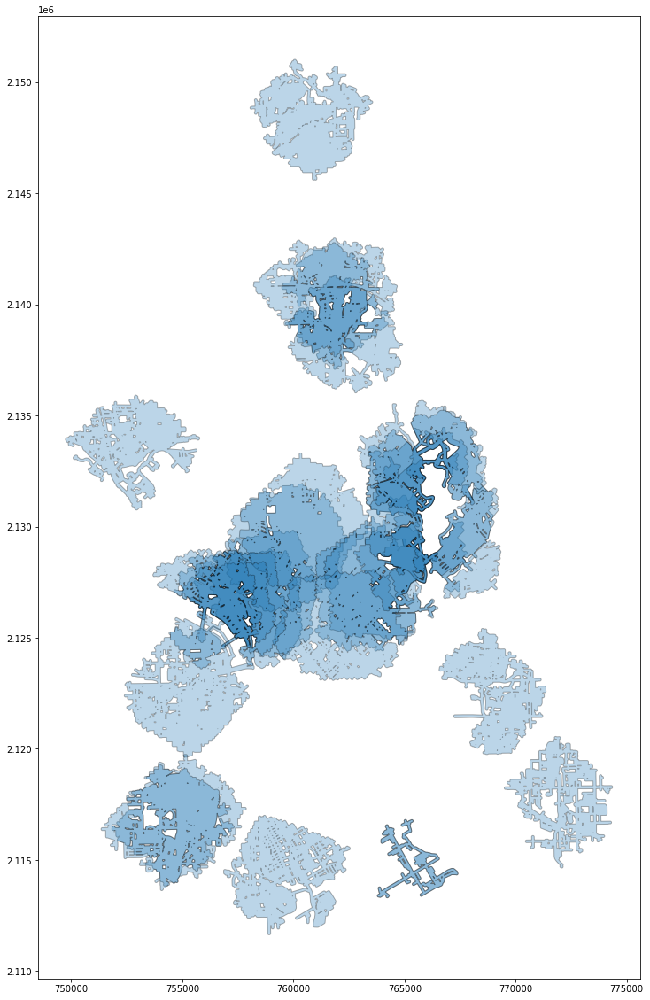

In [757]:
nf2=nf1[nf1['region']=='Dallas']
nf3=nf2[nf1['buff_dist']=='2.0']
ax = nf3.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [758]:
nf3

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.707870,-96.708810,NaN,496723098.0,2.0,"POLYGON ((766513.757 2113768.939, 766512.852 2..."
7,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.762840,-96.842440,Kessler Pkwy (141085) parallel might be steali...,356309596.0,2.0,"POLYGON ((755105.651 2119627.931, 755103.563 2..."
14,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.918850,-96.764420,NaN,493380742.0,2.0,"POLYGON ((762001.633 2137194.255, 761996.850 2..."
21,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.713070,-96.667790,NaN,461234382.0,2.0,"POLYGON ((771993.377 2114694.615, 771991.968 2..."
28,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,32.757810,-96.700380,NaN,472409339.0,2.0,"POLYGON ((768671.382 2119748.786, 768669.113 2..."
35,P007DAL,Glendale Park Loop Trail,permanent,2019,Dallas,3.0,15.088095,0.000000,0.000000,8.0,32.681450,-96.794260,NaN,469524545.0,2.0,"POLYGON ((758884.239 2111637.396, 758883.529 2..."
42,P008DAL,Katy Trail (Houston St / AA Center),permanent,2019,Dallas,3.0,409.750513,42.575342,9.273973,1373.0,32.793570,-96.811820,parallel link (1687094),170833583.0,2.0,"POLYGON ((759074.373 2123687.548, 759068.887 2..."
49,P009DAL,Katy Trail at Cedar Springs Rd,permanent,2019,Dallas,3.0,632.923809,40.821918,9.547945,2624.0,32.802600,-96.804810,parallel link (1447148),223881880.0,2.0,"POLYGON ((758982.730 2124107.319, 758976.847 2..."
56,P010DAL,Katy Trail at Fitzhugh,permanent,2019,Dallas,3.0,521.530357,41.205479,9.876712,2559.0,32.818420,-96.794980,NaN,223881858.0,2.0,"POLYGON ((759097.012 2126231.950, 759096.122 2..."
63,P011DAL,Katy Trail at Harvard Avenue,permanent,2019,Dallas,3.0,304.138095,41.767123,7.972603,1124.0,32.828480,-96.785900,parallel link (1447146),313514317.0,2.0,"POLYGON ((759495.798 2127297.206, 759490.945 2..."


# Input the Strava Annual Network shape file here

In [759]:
strava=gpd.read_file("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/Dallas_strava_osm_buffer_3mi.shp")
print(strava.crs)
# Define the current EPSG
strava = strava.set_crs("EPSG:4326")
# Let's take a copy of our layer
strava_proj = strava.copy()

# Reproject the geometries by replacing the values with projected ones
strava_proj = strava_proj.to_crs(epsg=2845)

epsg:4326


# Input Bike share data here

bs1=pd.read_csv("C:/Users/mxm5116/Desktop/Bike Fusion/2019_01.csv")
bs2=pd.read_csv("C:/Users/mxm5116/Desktop/Bike Fusion/2019_02.csv")
bs3=pd.read_csv("C:/Users/mxm5116/Desktop/Bike Fusion/2019_03.csv")
bs4=pd.read_csv("C:/Users/mxm5116/Desktop/Bike Fusion/2019_04.csv")
bs5=pd.read_csv("C:/Users/mxm5116/Desktop/Bike Fusion/2019_05.csv")
bs6=pd.read_csv("C:/Users/mxm5116/Desktop/Bike Fusion/2019_06.csv")
bs7=pd.read_csv("C:/Users/mxm5116/Desktop/Bike Fusion/2019_07.csv")
bs8=pd.read_csv("C:/Users/mxm5116/Desktop/Bike Fusion/2019_08.csv")
bs9=pd.read_csv("C:/Users/mxm5116/Desktop/Bike Fusion/2019_09.csv")
bs10=pd.read_csv("C:/Users/mxm5116/Desktop/Bike Fusion/2019_10.csv")
bs11=pd.read_csv("C:/Users/mxm5116/Desktop/Bike Fusion/2019_11.csv")
bs12=pd.read_csv("C:/Users/mxm5116/Desktop/Bike Fusion/2019_12.csv")
bs_all=pd.concat([bs1,bs2,bs3,bs4,bs5,bs6,bs7,bs8,bs9,bs10,bs11,bs12],axis=0,ignore_index=True)
bs_all.head(5)

# Input OSM file here

In [22]:
# Input OSM land use shape file here
luse = gpd.read_file("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/landuse.shp")
# Define the current EPSG (normall for OSM this 3D EPSG code does not change)
lusec = luse.set_crs("EPSG:4326")


# Input OSM Natural shape file here
nature=gpd.read_file("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/natural.shp")
# Define the current EPSG
nature = nature.set_crs("EPSG:4326")

# Input OSM Point shape file here
pts=gpd.read_file("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/points.shp")
# Define the current EPSG
pts = pts.set_crs("EPSG:4326")

# Input the place of your study Area to calculate the intersection Density (city or county, Country)
#place="Oregon,USA"

# Input OSM road shape file here
road = gpd.read_file("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/roads.shp")
# Define the current EPSG
road = road.set_crs("EPSG:4326")

# Import OSM Building shape file to get CBD (City Hall)

In [23]:
# Input OSM road shape file here
building = gpd.read_file("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/buildings.shp")
print(building.crs)
# Define the current EPSG
building1 = building.set_crs("EPSG:4326")

epsg:4326


# Input NHGIS Block Group shape and CSV file here

In [24]:
# Input the block group shape file of your study area here
bg=gpd.read_file("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/TX_blck_grp_2019.shp")

# Input Race csv file here
race=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/race.csv")

# Input Age by Sex csv file here
gender=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/age by sex.csv")

# Input education csv file here
edu=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/education.csv")
# Import school enrollmemt 
scll=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Charellote/Charlotte/School Enrollment.csv")

# Input Median age csv file here
age=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/median_age.csv")

# Input Median House Hold income csv file here
income=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/median_hh_income.csv")

# Input House hold Type csv file here
hhdensity=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/household_type.csv")

# Input Population csv file here
pdensity=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/population.csv")

# Input Employment csv file here
edensity=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/employment.csv")

# Means of Transportation data
bike_commute=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/Bike_commute_tx_2019_blck_grp.csv")

# Insert LEHD Job Data, WAC file

In [25]:
# Input job csv file here
Number_job=pd.read_csv("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/tx_wac_S000_JT00_2018.csv")
Number_job.head(4)
# Input the block group shape file of your study area here
bg_lehd=gpd.read_file("E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/tabblock2010_48_pophu.shp")

# Import slope file

In [26]:
eu = rasterio.open('E:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/dallasc.img')

# Weather data needs to input three things
1. Chrome driver link (no need for kaggle as it is already set)
2. Dates you want to extract the data (format: yyyy-m, for example, 2019-4)
3. page of weather underground from where you want to extract the data

Please change the dates and page link only for other sttudy area at weather section which you will find before the Random forest variable selections.

WGS84 Latitude/Longitude: "EPSG:4326"

UTM Zones (North): "EPSG:32633"

UTM Zones (South): "EPSG:32733

# Input Study Area Boundary Shape file here

In [760]:
BA_all=gpd.read_file('http://web.pdx.edu/~jbroach/bike-data-fusion/study_area_boundaries.geojson')

In [761]:
BA_all

,fid,region,comment,epsg_local,geometry
0,1,Boulder,None,2772,"MULTIPOLYGON (((-105.64858 40.06198, -105.6480..."
1,2,Eugene,None,2839,"MULTIPOLYGON (((-123.73473 43.94406, -123.7392..."
2,3,Bend,None,2839,"MULTIPOLYGON (((-121.40550 44.39315, -121.4025..."
3,4,Charlotte,None,3358,"MULTIPOLYGON (((-80.74046 35.37771, -80.73779 ..."
4,5,Dallas,None,2845,"MULTIPOLYGON (((-96.52941 32.54528, -96.52964 ..."
5,6,Portland,metro planning area,2838,"MULTIPOLYGON (((-123.13045 45.47864, -123.1307..."


<AxesSubplot:>

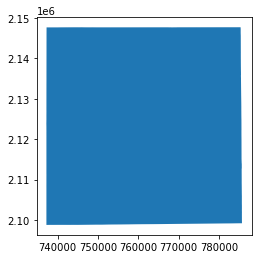

In [762]:
region = "Dallas"
# select regional boundary and transform to local coords for buffering
local_poly = BA_all[BA_all['region'] == region]
local_srid = int(local_poly['epsg_local'])
local_poly = local_poly.to_crs(local_srid)
local_poly.plot()

<AxesSubplot:>

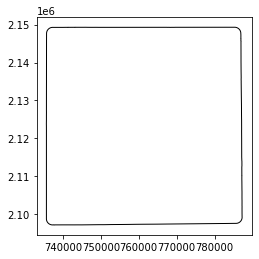

In [763]:
one_mile = 1609.34 # meters
pba = local_poly.buffer(one_mile)
pba.plot(color="none")

<AxesSubplot:>

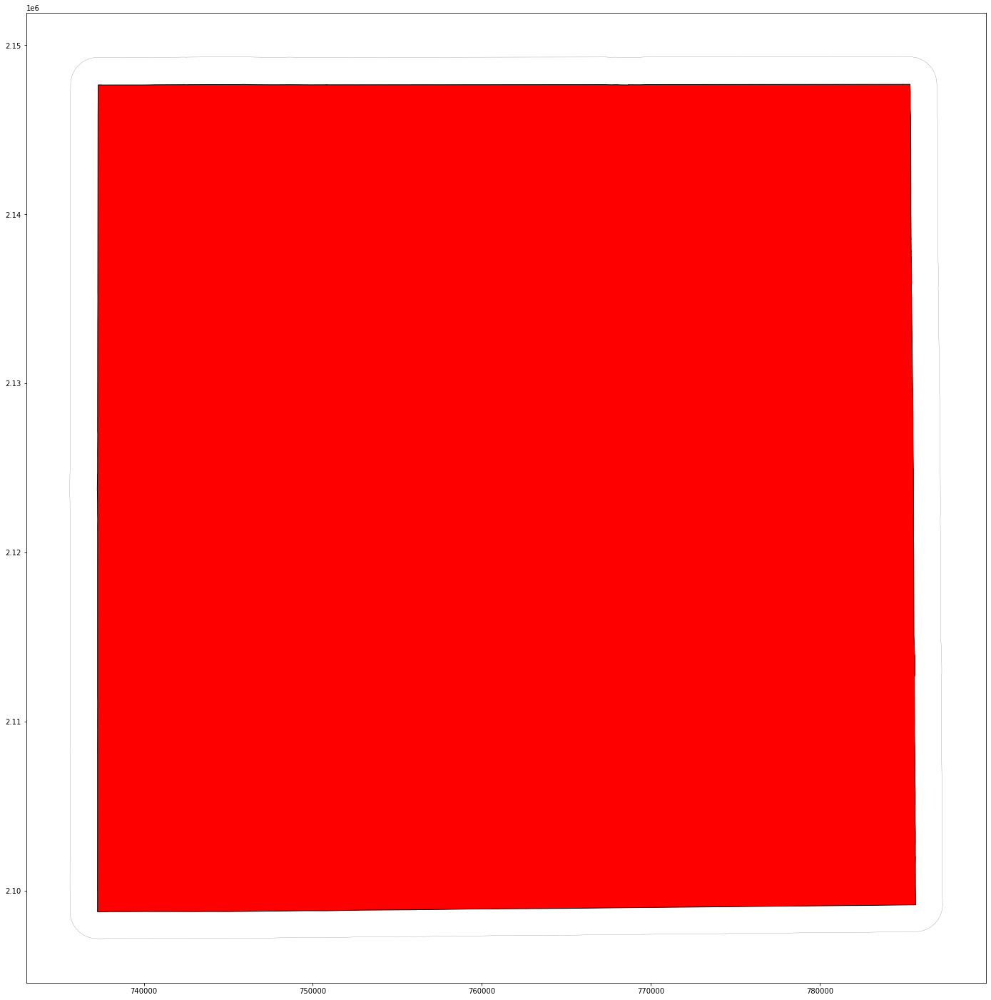

In [764]:
fig, ax = plt.subplots(figsize = (30,25)) 
local_poly.plot(ax=ax,color="red",edgecolor='k',linewidth = 1)
pba.plot(color="none",edgecolor='k',linewidth = 0.15,ax=ax) #Use your second dataframe

# Read the counter location file as gdf

In [765]:
df = gpd.GeoDataFrame(
    nf1, geometry=gpd.points_from_xy(nf1.longitude, nf1.latitude))
df.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,2.0,POINT (-96.70881 32.70787)
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,1.5,POINT (-96.70881 32.70787)
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,1.0,POINT (-96.70881 32.70787)
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,0.75,POINT (-96.70881 32.70787)
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,0.5,POINT (-96.70881 32.70787)


In [766]:
# set the co-ordinate system first
df = df.set_crs("EPSG:4211")
# Let's take a copy of our layer
gdf0_proj = df.copy()

# Reproject the geometries by replacing the values with projected ones
eco_proj = gdf0_proj.to_crs(epsg=2845)
eco_proj.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,2.0,POINT (767915.395 2116890.570)
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,1.5,POINT (767915.395 2116890.570)
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,1.0,POINT (767915.395 2116890.570)
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,0.75,POINT (767915.395 2116890.570)
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,0.5,POINT (767915.395 2116890.570)


In [767]:
ecoshort0=eco_proj
#ecoshort0=pd.concat([eco_proj,short_proj],axis=0)
ecoshort0.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,2.0,POINT (767915.395 2116890.570)
1,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,1.5,POINT (767915.395 2116890.570)
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,1.0,POINT (767915.395 2116890.570)
3,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,0.75,POINT (767915.395 2116890.570)
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,0.5,POINT (767915.395 2116890.570)


# Filter the location by Extended Study area Boundary

In [768]:
# Clip the data using GeoPandas clip
ecoshort = gpd.clip(ecoshort0, pba)
ecoshort.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry
125,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,32.69159,-96.72413,NaN,496723099.0,0.1,POINT (766509.872 2115061.204)
119,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,32.69159,-96.72413,NaN,496723099.0,2.0,POINT (766509.872 2115061.204)
120,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,32.69159,-96.72413,NaN,496723099.0,1.5,POINT (766509.872 2115061.204)
121,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,32.69159,-96.72413,NaN,496723099.0,1.0,POINT (766509.872 2115061.204)
122,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,32.69159,-96.72413,NaN,496723099.0,0.75,POINT (766509.872 2115061.204)


In [769]:
count_station=ecoshort.copy()

In [770]:
ecoshort=ecoshort.drop_duplicates(subset='osm_id_sensor')
ecoshort.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry
125,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,32.69159,-96.72413,NaN,496723099.0,0.1,POINT (766509.872 2115061.204)
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,1.0,POINT (767915.395 2116890.570)
27,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.71307,-96.66779,NaN,461234382.0,0.1,POINT (771750.380 2117533.411)
30,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,32.75781,-96.70038,NaN,472409339.0,1.0,POINT (768610.731 2122440.975)
118,P018DAL,Santa Fe Trail at Winstead,permanent,2019,Dallas,3.0,412.503571,78.931507,14.876712,1275.0,32.81480,-96.72942,NaN,144869316.0,0.1,POINT (765783.659 2128713.336)


<AxesSubplot:>

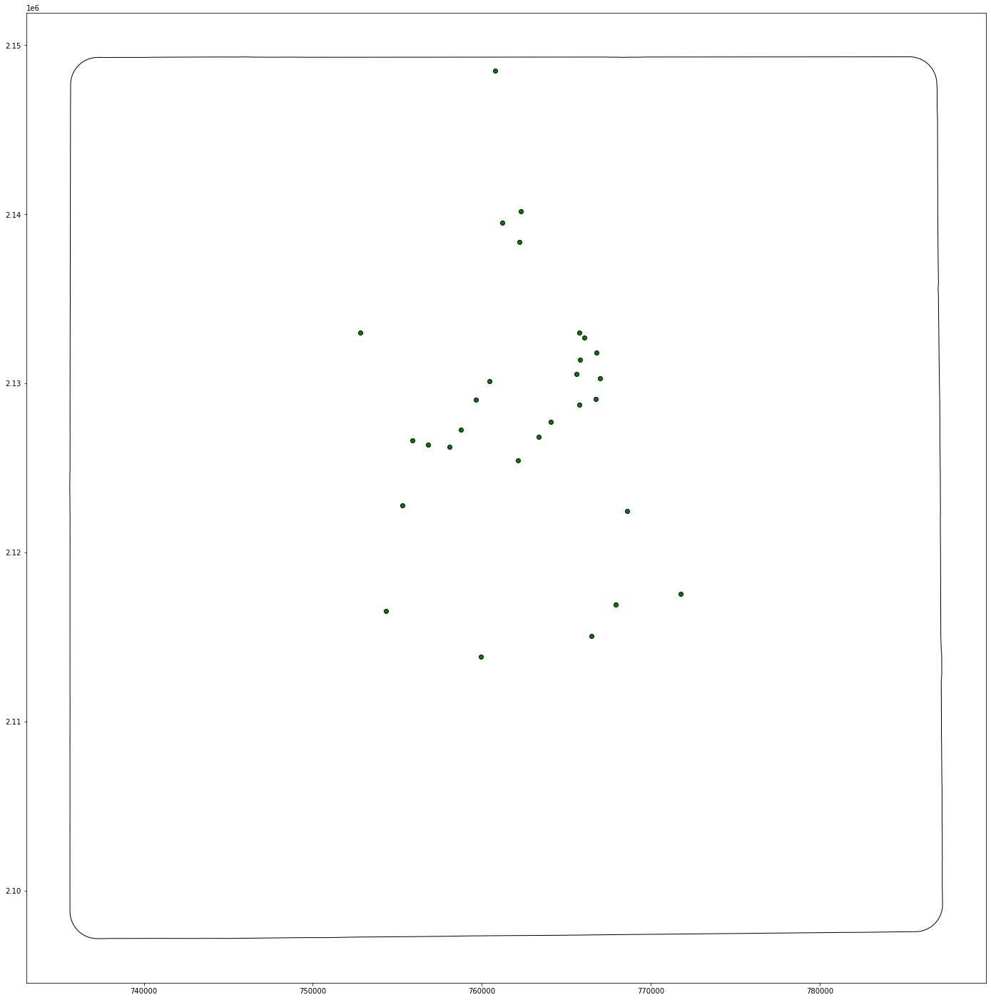

In [771]:
fig, ax = plt.subplots(figsize = (30,25)) 
ecoshort.plot(ax=ax,color="green",edgecolor='k',linewidth = 1)
pba.plot(color="none",edgecolor='k',linewidth = 1,ax=ax) #Use your second dataframe

# geopanda buffer function: https://geopandas.org/docs/user_guide/geometric_manipulations.html

In [772]:
# Buffer file
gdf1=nf3
gdf1['buffer_area']=gdf1.area*3.86102e-7 # in mile square
gdf1=gdf1[gdf1['buffer_area']>0]
gdf1

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry,buffer_area
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.707870,-96.708810,NaN,496723098.0,2.0,"POLYGON ((766513.757 2113768.939, 766512.852 2...",1.153958
7,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.762840,-96.842440,Kessler Pkwy (141085) parallel might be steali...,356309596.0,2.0,"POLYGON ((755105.651 2119627.931, 755103.563 2...",7.374509
14,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.918850,-96.764420,NaN,493380742.0,2.0,"POLYGON ((762001.633 2137194.255, 761996.850 2...",6.430770
21,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.713070,-96.667790,NaN,461234382.0,2.0,"POLYGON ((771993.377 2114694.615, 771991.968 2...",4.393878
28,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,32.757810,-96.700380,NaN,472409339.0,2.0,"POLYGON ((768671.382 2119748.786, 768669.113 2...",5.017613
35,P007DAL,Glendale Park Loop Trail,permanent,2019,Dallas,3.0,15.088095,0.000000,0.000000,8.0,32.681450,-96.794260,NaN,469524545.0,2.0,"POLYGON ((758884.239 2111637.396, 758883.529 2...",6.191336
42,P008DAL,Katy Trail (Houston St / AA Center),permanent,2019,Dallas,3.0,409.750513,42.575342,9.273973,1373.0,32.793570,-96.811820,parallel link (1687094),170833583.0,2.0,"POLYGON ((759074.373 2123687.548, 759068.887 2...",6.655320
49,P009DAL,Katy Trail at Cedar Springs Rd,permanent,2019,Dallas,3.0,632.923809,40.821918,9.547945,2624.0,32.802600,-96.804810,parallel link (1447148),223881880.0,2.0,"POLYGON ((758982.730 2124107.319, 758976.847 2...",7.699152
56,P010DAL,Katy Trail at Fitzhugh,permanent,2019,Dallas,3.0,521.530357,41.205479,9.876712,2559.0,32.818420,-96.794980,NaN,223881858.0,2.0,"POLYGON ((759097.012 2126231.950, 759096.122 2...",8.613365
63,P011DAL,Katy Trail at Harvard Avenue,permanent,2019,Dallas,3.0,304.138095,41.767123,7.972603,1124.0,32.828480,-96.785900,parallel link (1447146),313514317.0,2.0,"POLYGON ((759495.798 2127297.206, 759490.945 2...",8.695911


In [773]:
#gdf1 = ecoshort.copy()
#gdf1['geometry'] = gdf1['geometry'].buffer(size)
#gdf1

In [774]:
#conda install -c conda-forge contextily #install in your geo_env using command prompt 

#https://geopandas.org/gallery/plotting_basemap_background.html

In [775]:
import contextily as ctx

In [776]:
print(gdf1.crs)

epsg:2845


In [777]:
# Insert City Specific EPSG here to convert 3D to 2D map,for exaple, state plane system EPSG =2845 for Portland
# set the co-ordinate system first
gdfm = gdf1.set_crs("EPSG:2845") # provided by PSU
gdfm = gdfm.to_crs(epsg=3857) # This EPSG just for ploting

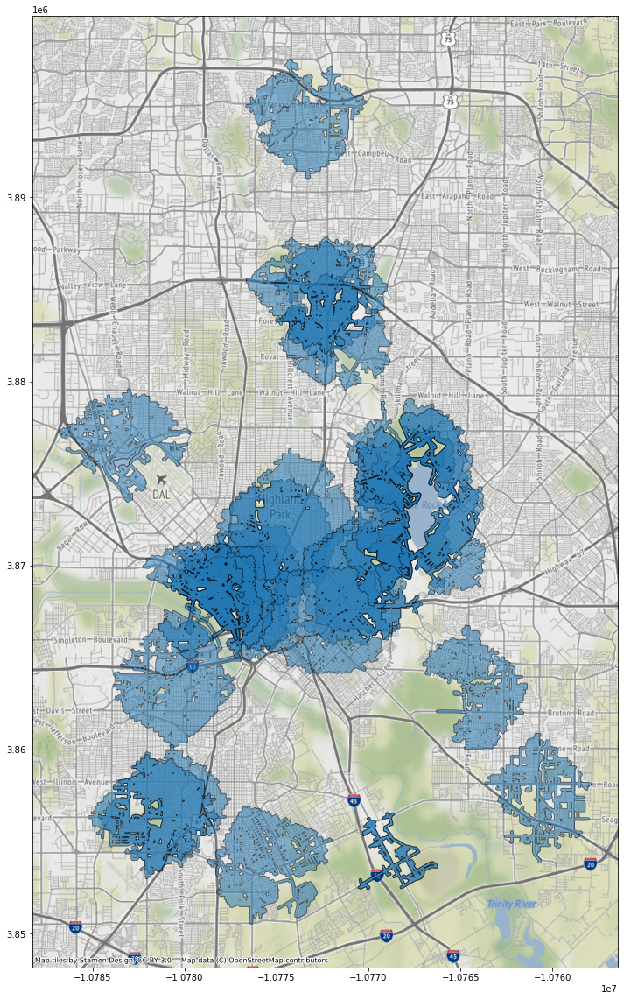

In [778]:
ax = gdfm.plot(figsize=(20, 20), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax)

# ploting code: http://darribas.org/gds15/content/labs/lab_03.html

# Calculate O, D and OD line

bs_all.head(5)

# BS Origin

In [144]:
# Origin
#bso = gpd.GeoDataFrame(
#    bs_all, geometry=gpd.points_from_xy(bs_all.StartLongitude, bs_all.StartLatitude))
#bso=bso.loc[:,['RouteID','StartLatitude','StartLongitude','geometry']]
#bso.head(5)

In [145]:
# set the co-ordinate system first
#bso1 = bso.set_crs("EPSG:4211")

# Reproject the geometries by replacing the values with projected ones
#bso1_proj = bso1.to_crs(epsg=2845)
#bso1_proj.head(5)

In [146]:
# Clip the data using GeoPandas clip
#bso1_clip = gpd.clip(bso1_proj, gdf1)
#bso1_clip.head(5)

In [147]:
# int_bso=gpd.overlay(gdf1, bso1_clip, how='intersection', make_valid=True, keep_geom_type=False)
# int_bso.head(5)

In [148]:
#int_bso.geometry.plot()
#ax = gdf1.plot(figsize=(40, 30))
#int_bso.geometry.plot(color="red",edgecolor='k',ax=ax)

In [49]:
#output_origin=int_bso.groupby(by=['osm_id_sensor'])['RouteID'].count().reset_index()
#output_origin.columns=["osm_id","Bike Share Origin"]
#output_origin

# BS destination

In [50]:
# Destination
#bsd = gpd.GeoDataFrame(
#    bs_all, geometry=gpd.points_from_xy(bs_all.EndLongitude, bs_all.EndLatitude))
#bsd=bsd.loc[:,['RouteID','EndLatitude','EndLongitude','geometry']]
#bsd.head(5)

In [51]:
# set the co-ordinate system first
#bsd1 = bsd.set_crs("EPSG:4211")
# Reproject the geometries by replacing the values with projected ones
#bsd1_proj = bsd1.to_crs(epsg=2845)
#bsd1_proj.head(5)

In [52]:
# Clip the data using GeoPandas clip
#bsd1_clip = gpd.clip(bsd1_proj, gdf1)
#bsd1_clip.head(5)

In [53]:
#int_bsd=gpd.overlay(gdf1, bsd1_clip, how='intersection', make_valid=True, keep_geom_type=False)
#int_bsd.head(5)

In [54]:
#int_bsd.geometry.plot()
#plotting    
#ax = gdf1.plot(figsize=(40, 30))
#int_bsd.geometry.plot(color="red",edgecolor='k',ax=ax)

In [55]:
#output_destination=int_bsd.groupby(by=['osm_id_sensor'])['RouteID'].count().reset_index()
#output_destination.columns=["osm_id","Bike Share Destination"]
#output_destination

# Bike Share OD line Crossing

In [56]:
#https://gis.stackexchange.com/questions/303615/creating-linestring-and-length-of-linestring-from-multiple-latlon-points-for-eac
#import shapely.geometry as geom
#bs_all_od=bs_all.copy()
#bs_all_od['geometry'] = bs_all_od.apply(lambda x: geom.LineString([(x['StartLongitude'], x['StartLatitude']) , (x['EndLongitude'], x['EndLatitude'])]), axis = 1)
#bs_all_od.head(5)

In [57]:
# exclude the points outside of Portland
#bs_all_od1=bs_all_od[(bs_all_od.StartLongitude<=-122)&(bs_all_od.StartLongitude>=-124)]
#bs_all_od1=bs_all_od1[(bs_all_od1.EndLongitude<=-122)&(bs_all_od1.EndLongitude>=-124)]
#bs_all_od1=bs_all_od1[(bs_all_od1.StartLatitude>=45)&(bs_all_od1.StartLatitude<=46)]
#bs_all_od1=bs_all_od1[(bs_all_od1.EndLatitude>=45)&(bs_all_od1.EndLatitude<=46)]
#bs_all_od1.head(5)

In [58]:
#bs_all_od1.dtypes

In [59]:
#print(bs_all_od1.info())

In [60]:
#bs_all_od2 = gpd.GeoDataFrame(bs_all_od1, geometry='geometry', crs={'init': 'epsg:4211'})
#bs_all_od2.head(5)

In [61]:
#print(bs_all_od2.crs)

In [62]:
#print(bs_all_od2.info())

In [63]:
# set the co-ordinate system first
#bs_all_od2 = bs_all_od1.set_crs("EPSG:4211")

# Reproject the geometries by replacing the values with projected ones
#bs_all_od2_proj = bs_all_od2.to_crs(epsg=2845)
#bs_all_od2_proj.head(5)

In [64]:
#bs_all_od2_proj.shape

In [65]:
#fig, ax = plt.subplots(figsize = (30,25)) 
#gdf1.plot(ax=ax,color="red")
#bs_all_od2_proj.geometry.plot(color="green",edgecolor='k',linewidth = 2,ax=ax)

In [66]:
#spj = gpd.sjoin( bs_all_od2_proj,gdf1, how="inner", op='intersects')

In [67]:
#spj.head(5)

In [68]:
#spj.shape

In [69]:
# Clip the data using GeoPandas clip
#odc1_clip = gpd.clip(bs_all_od2_proj,gdf1)
#odc1_clip.head(5)

In [70]:
#int_odl=gpd.overlay(gdf1, bs_all_od2_proj, how='intersection', make_valid=True, keep_geom_type=False)
#int_odl.head(5)

In [71]:
#fig, ax = plt.subplots(figsize = (30,25)) 
#gdf1.plot(ax=ax,color="red")
#spj.geometry.plot(color="green",edgecolor='k',linewidth = 2,ax=ax)

In [72]:
#output_odl=spj.groupby(by=['osm_id_sensor'])['RouteID'].count().reset_index()
#output_odl.columns=["osm_id","Bike Share Crossing"]
#output_odl

# Now import land use shape file

In [73]:
#luse = gpd.read_file("../input/osm-data/landuse.shp")
luse.head(5)

,osm_id,name,type,geometry
0,25857020,Greenwood Cemetery,cemetery,"POLYGON ((-96.79838 32.80328, -96.79565 32.800..."
1,26565510,Freedman's Memorial Cemetery,cemetery,"POLYGON ((-96.79683 32.80305, -96.79627 32.802..."
2,27130352,Oakland Cemetery,cemetery,"POLYGON ((-96.76081 32.76285, -96.75738 32.765..."
3,27449698,None,cemetery,"POLYGON ((-96.68890 32.69676, -96.68956 32.696..."
4,27934749,None,brownfield,"POLYGON ((-96.80863 32.92689, -96.80772 32.926..."


# Define and then Convert the co-ordinate system

In [74]:
# set the co-ordinate system first
#lusec = luse.set_crs("EPSG:4326")

In [75]:
# Let's take a copy of our layer
luse_proj = lusec.copy()

# Reproject the geometries by replacing the values with projected ones
luse_proj = luse_proj.to_crs(epsg=2845)
luse_proj.head(5)

,osm_id,name,type,geometry
0,25857020,Greenwood Cemetery,cemetery,"POLYGON ((759349.176 2127329.116, 759608.290 2..."
1,26565510,Freedman's Memorial Cemetery,cemetery,"POLYGON ((759494.448 2127305.231, 759547.747 2..."
2,27130352,Oakland Cemetery,cemetery,"POLYGON ((762940.873 2122904.128, 763256.324 2..."
3,27449698,None,cemetery,"POLYGON ((769803.942 2115689.980, 769742.562 2..."
4,27934749,None,brownfield,"POLYGON ((758168.521 2141018.687, 758253.580 2..."


# Visualize

<AxesSubplot:>

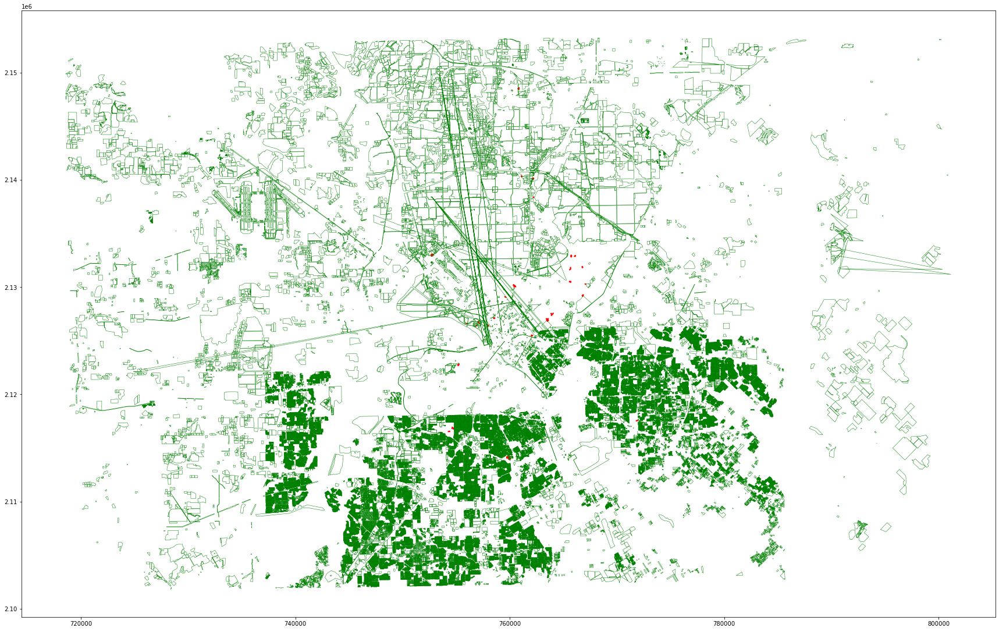

In [76]:
fig, ax = plt.subplots(figsize = (30,25)) 
gdf1.plot(ax=ax,color="red")
luse_proj.geometry.boundary.plot(color="green",edgecolor='k',linewidth = 0.5,ax=ax) #Use your second dataframe

# Now clip landuse with buffer

In [77]:
import os 
from shapely.geometry import Point
from geopandas import GeoDataFrame, read_file
from geopandas.tools import overlay

In [78]:
#!pip install Rtree
#!pip install pygeos
#!pip install ujson
#!pip install wheel

In [79]:
#luse_proj.exterior.type

In [80]:
#gdf1.exterior.type

In [81]:
#luse_proj.exterior.is_valid

In [82]:
#gdf1.exterior.is_valid

In [83]:
# Avoid this error- TopologyException: Input geom 0 is invalid: Self-intersection at 2307899.6553931381 208383.49467431975. Do the followings
luse_proj["geometry2"]=luse_proj.geometry.buffer(0)
# Now drop geometry column and rename geometry 2 equal to geometry again
luse_proj=luse_proj.drop(["geometry"],axis=1)
luse_proj.rename({'geometry2': 'geometry'}, axis=1, inplace=True)
luse_proj.head(5)

,osm_id,name,type,geometry
0,25857020,Greenwood Cemetery,cemetery,"POLYGON ((759349.176 2127329.116, 759608.290 2..."
1,26565510,Freedman's Memorial Cemetery,cemetery,"POLYGON ((759494.448 2127305.231, 759543.886 2..."
2,27130352,Oakland Cemetery,cemetery,"POLYGON ((762940.873 2122904.128, 763256.324 2..."
3,27449698,None,cemetery,"POLYGON ((769803.942 2115689.980, 770385.811 2..."
4,27934749,None,brownfield,"POLYGON ((758168.521 2141018.687, 758253.580 2..."


In [84]:
# Clip the data using GeoPandas clip
buffer_clip = gpd.clip(luse_proj, gdf1)
buffer_clip.head(5)

,osm_id,name,type,geometry
2297,460754375,None,commercial,"POLYGON ((761148.935 2140321.964, 761144.282 2..."
2300,460754379,None,commercial,"POLYGON ((762057.066 2140056.192, 762055.939 2..."
2343,460909885,None,grass,"POLYGON ((762089.556 2140103.186, 762094.744 2..."
2344,460909886,None,grass,"POLYGON ((762138.118 2140046.162, 762149.817 2..."
2345,460909887,None,grass,"POLYGON ((762203.772 2140143.766, 762214.730 2..."


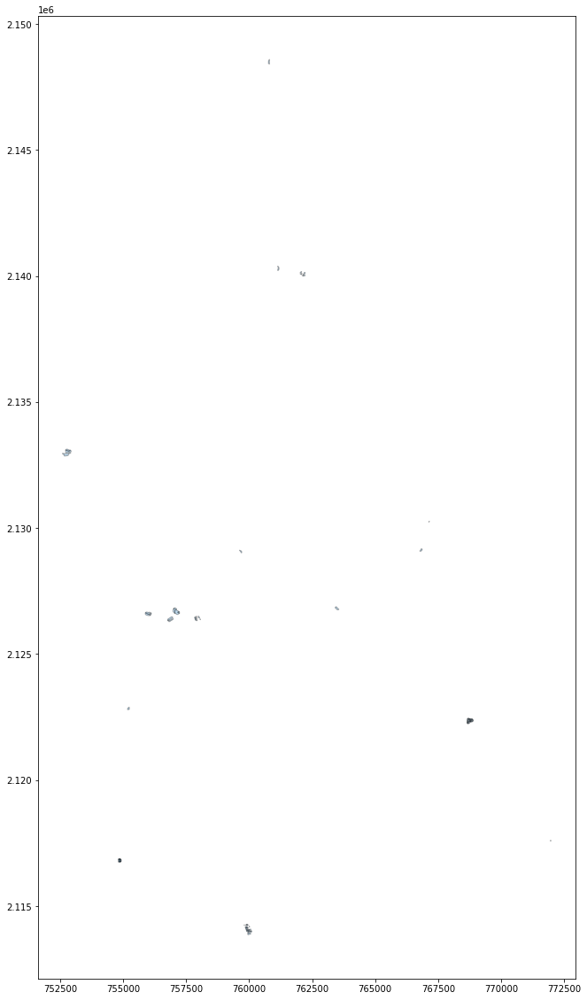

In [85]:
ax = buffer_clip.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

# Intersect the clipped area with Buffer ID

In [86]:
 intdata=gpd.overlay(gdf1, buffer_clip, how='intersection', make_valid=True, keep_geom_type=False)
 intdata.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,buffer_area,osm_id,name,type,geometry
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,0.1,0.015957,467374683,None,residential,"POLYGON ((755177.719 2122793.301, 755177.166 2..."
1,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,0.1,0.016334,460754379,None,commercial,"POLYGON ((762055.939 2140056.666, 762050.761 2..."
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,0.1,0.016334,460909885,None,grass,"POLYGON ((762094.744 2140106.743, 762081.597 2..."
3,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,0.1,0.016334,460909886,None,grass,"POLYGON ((762126.616 2139998.481, 762124.418 2..."
4,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,0.1,0.016334,460909887,None,grass,"POLYGON ((762214.730 2140141.773, 762220.976 2..."


In [87]:
intdata["Area"]=intdata["geometry"].area*10.76 # in ft2
intdata.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,buff_dist,buffer_area,osm_id,name,type,geometry,Area
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,0.1,0.015957,467374683,None,residential,"POLYGON ((755177.719 2122793.301, 755177.166 2...",56826.965377
1,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,-96.76442,NaN,493380742.0,0.1,0.016334,460754379,None,commercial,"POLYGON ((762055.939 2140056.666, 762050.761 2...",8880.104824
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,-96.76442,NaN,493380742.0,0.1,0.016334,460909885,None,grass,"POLYGON ((762094.744 2140106.743, 762081.597 2...",3290.127653
3,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,-96.76442,NaN,493380742.0,0.1,0.016334,460909886,None,grass,"POLYGON ((762126.616 2139998.481, 762124.418 2...",3951.319819
4,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,-96.76442,NaN,493380742.0,0.1,0.016334,460909887,None,grass,"POLYGON ((762214.730 2140141.773, 762220.976 2...",28577.750363


#https://geopandas.org/docs/user_guide/set_operations.html

In [88]:
#intdata.plot(figsize=(20, 20),alpha=0.5, edgecolor='k', cmap='tab10')

# Aggregate data by ID

#https://geopandas.org/docs/user_guide/aggregation_with_dissolve.html

In [89]:
output_landuse=intdata.groupby(by=['osm_id_sensor','type'])['Area'].sum().reset_index()
output_landuse.columns=['osm_id','type','Area']
output_landuse.head()

,osm_id,type,Area
0,170833583.0,grass,10427.492398
1,170833583.0,railway,56615.067402
2,170833583.0,residential,29214.463489
3,178552402.0,residential,54379.803892
4,223881858.0,commercial,38341.375797


In [90]:
# Calculate commercial area
commercial  = intdata[intdata['type'].str.contains('commercial')]
output_commercial = commercial  .groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_commercial.columns=['osm_id','Commercial Area ']
output_commercial.head()

,osm_id,Commercial Area
0,223881858.0,38341.375797
1,419107440.0,378567.552463
2,444480443.0,313029.208096
3,444489305.0,15362.110841
4,492447672.0,15146.809668


In [91]:
gdf1.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry,buffer_area
13,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,0.1,"POLYGON ((755108.415 2122678.505, 755107.565 2...",0.015957
20,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,0.1,"POLYGON ((762283.640 2140154.152, 762284.375 2...",0.016334
27,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.71307,-96.66779,NaN,461234382.0,0.1,"POLYGON ((771924.965 2117497.339, 771908.607 2...",0.010540
34,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,32.75781,-96.70038,NaN,472409339.0,0.1,"POLYGON ((768634.283 2122385.183, 768635.262 2...",0.014490
41,P007DAL,Glendale Park Loop Trail,permanent,2019,Dallas,3.0,15.088095,0.000000,0.000000,8.0,32.68145,-96.79426,NaN,469524545.0,0.1,"POLYGON ((759900.459 2114268.027, 759902.439 2...",0.046159


<AxesSubplot:>

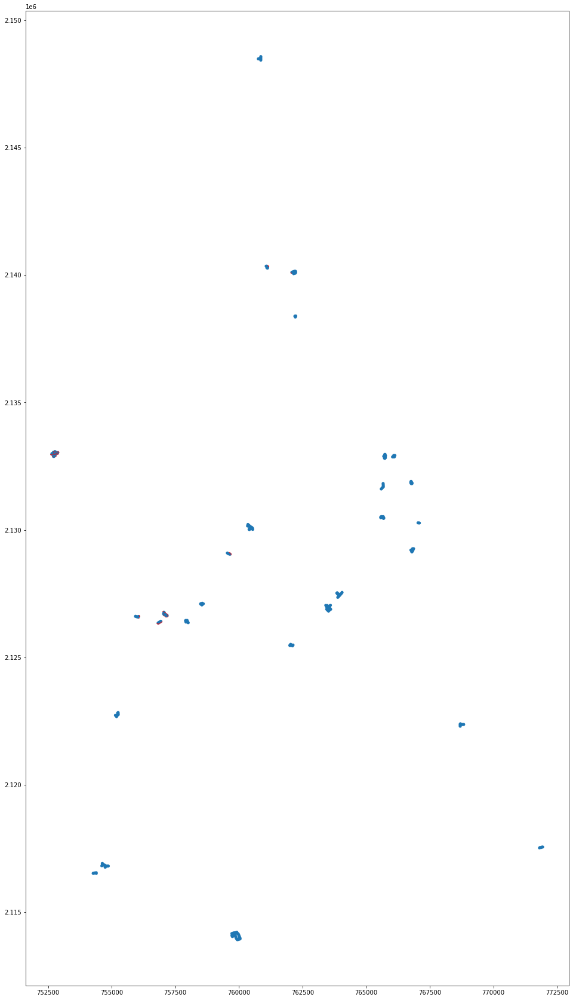

In [92]:
#plotting    
ax = gdf1.plot(figsize=(40, 30))
commercial.geometry.boundary.plot(color="red",edgecolor='k',linewidth = 0.5,ax=ax)

In [93]:
# Calculate inductrial area
industrial  = intdata[intdata['type'].str.contains('industrial')]
output_industrial = industrial  .groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_industrial.columns=['osm_id','Industrial Area ']
output_industrial.head()

,osm_id,Industrial Area
0,444489305.0,97940.340394


In [94]:
# Calculate residential area
residential  = intdata[intdata['type'].str.contains('residential')]
output_residential = residential.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_residential.columns=['osm_id','Residential_Area ']
output_residential.head()

,osm_id,Residential_Area
0,170833583.0,29214.463489
1,178552402.0,54379.803892
2,356118935.0,216972.198604
3,356309596.0,56826.965377
4,373275516.0,2655.638638


In [95]:
residential.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,buff_dist,buffer_area,osm_id,name,type,geometry,Area
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,0.1,0.015957,467374683,None,residential,"POLYGON ((755177.719 2122793.301, 755177.166 2...",56826.965377
7,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,-96.66779,NaN,461234382.0,0.1,0.010540,754303174,None,residential,"POLYGON ((771970.425 2117606.928, 771975.054 2...",4218.695720
8,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,-96.70038,NaN,472409339.0,0.1,0.014490,756227302,None,residential,"POLYGON ((768675.193 2122444.865, 768675.690 2...",3472.299267
9,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,-96.70038,NaN,472409339.0,0.1,0.014490,756227413,None,residential,"POLYGON ((768708.929 2122450.960, 768709.491 2...",9540.080464
10,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,-96.70038,NaN,472409339.0,0.1,0.014490,756227483,None,residential,"POLYGON ((768734.225 2122442.014, 768736.247 2...",9012.310584


<AxesSubplot:>

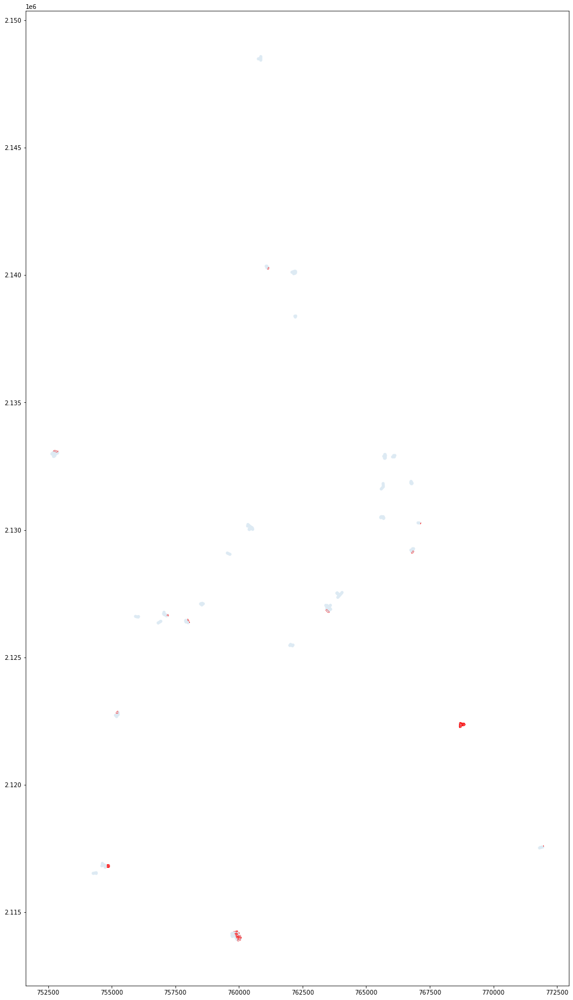

In [96]:
#plotting    
ax = gdf1.plot(figsize=(40, 30),alpha=0.15)
residential.geometry.boundary.plot(color="red",edgecolor='k',linewidth = 0.5,ax=ax)

In [97]:
# Calculate retail area
retail  = intdata[intdata['type'].str.contains('retail')]
output_retail = retail.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_retail.columns=['osm_id','Retail Area']
output_retail.head()

,osm_id,Retail Area
0,444480443.0,22.454707
1,493380742.0,17894.039980


In [98]:
# Calculate grass area
grass  = intdata[intdata['type'].str.contains('grass')]
output_grass = grass.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_grass.columns=['osm_id','Grass Area']
output_grass.head()

,osm_id,Grass Area
0,170833583.0,10427.492398
1,444480443.0,159101.744195
2,493380742.0,35819.197835


In [99]:
output_grass.index

RangeIndex(start=0, stop=3, step=1)

# Use the Natural Shape file to calculate the Park, water and green spaces

In [100]:
#nature=gpd.read_file("../input/osm-data/natural.shp")
nature.head(5)

,osm_id,name,type,geometry
0,5687271,Richfield Park,park,"POLYGON ((-97.22756 32.86751, -97.22378 32.867..."
1,6091409,North Lake,water,"POLYGON ((-96.85277 32.83343, -96.85291 32.833..."
2,10067542,None,water,"POLYGON ((-97.12306 32.98145, -97.12292 32.981..."
3,13991735,Dick Faram Park,park,"POLYGON ((-97.20499 32.86722, -97.20500 32.868..."
4,13992439,Northfield Park,park,"POLYGON ((-97.20021 32.88953, -97.20018 32.891..."


In [101]:
# set the co-ordinate system first
# nature = nature.set_crs("EPSG:4326")
# Let's take a copy of our layer
nature_proj = nature.copy()

# Reproject the geometries by replacing the values with projected ones
nature_proj = nature_proj.to_crs(epsg=2845)
nature_proj.head(5)

,osm_id,name,type,geometry
0,5687271,Richfield Park,park,"POLYGON ((719074.657 2133881.539, 719427.923 2..."
1,6091409,North Lake,water,"POLYGON ((754203.211 2130590.609, 754190.014 2..."
2,10067542,None,water,"POLYGON ((728687.286 2146638.727, 728699.768 2..."
3,13991735,Dick Faram Park,park,"POLYGON ((721186.165 2133875.704, 721184.426 2..."
4,13992439,Northfield Park,park,"POLYGON ((721602.867 2136354.443, 721602.398 2..."


In [102]:
#nature_proj.plot()

<AxesSubplot:>

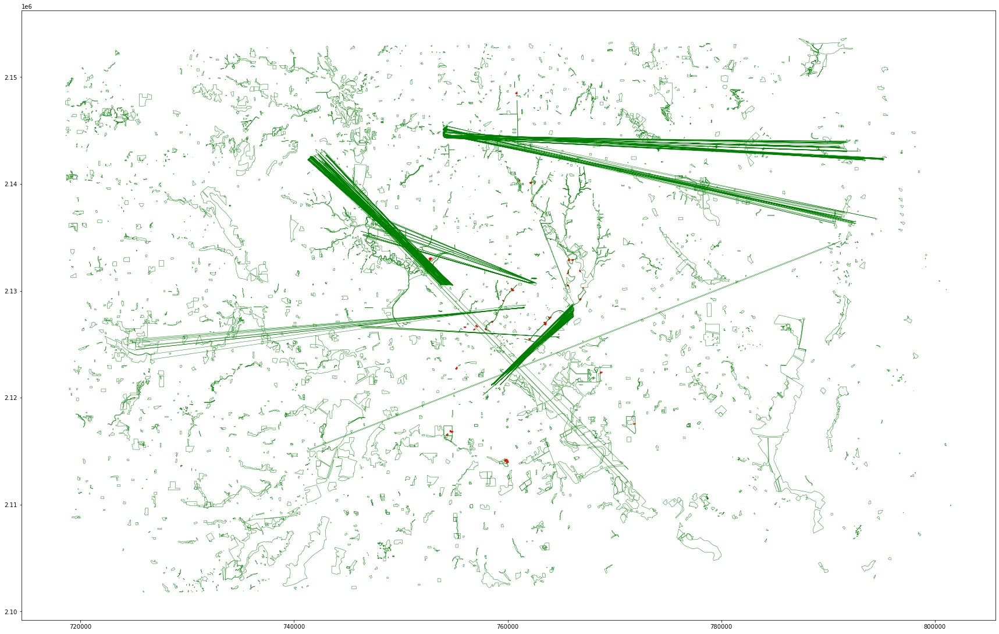

In [103]:
fig, ax = plt.subplots(figsize = (30,25)) 
gdf1.plot(ax=ax,color="red")
nature_proj.geometry.boundary.plot(color="green",edgecolor='k',linewidth = 0.5,ax=ax) #Use your second dataframe

# There is some invalid polygon in the shape file that need to pass through zero geom to correct it

In [104]:
nature_proj["geometry2"]=nature_proj.geometry.buffer(0)
nature_proj.head(5)

,osm_id,name,type,geometry,geometry2
0,5687271,Richfield Park,park,"POLYGON ((719074.657 2133881.539, 719427.923 2...","POLYGON ((719074.657 2133881.539, 719427.923 2..."
1,6091409,North Lake,water,"POLYGON ((754203.211 2130590.609, 754190.014 2...","MULTIPOLYGON (((741291.476 2142254.186, 741262..."
2,10067542,None,water,"POLYGON ((728687.286 2146638.727, 728699.768 2...","POLYGON ((728687.286 2146638.727, 728699.768 2..."
3,13991735,Dick Faram Park,park,"POLYGON ((721186.165 2133875.704, 721184.426 2...","POLYGON ((721186.165 2133875.704, 721184.426 2..."
4,13992439,Northfield Park,park,"POLYGON ((721602.867 2136354.443, 721602.398 2...","POLYGON ((721602.867 2136354.443, 721602.398 2..."


In [105]:
# Now drop geometry column and rename geometry 2 equal to geometry again
nature_proj1=nature_proj.drop(["geometry"],axis=1)
nature_proj1.head(5)

,osm_id,name,type,geometry2
0,5687271,Richfield Park,park,"POLYGON ((719074.657 2133881.539, 719427.923 2..."
1,6091409,North Lake,water,"MULTIPOLYGON (((741291.476 2142254.186, 741262..."
2,10067542,None,water,"POLYGON ((728687.286 2146638.727, 728699.768 2..."
3,13991735,Dick Faram Park,park,"POLYGON ((721186.165 2133875.704, 721184.426 2..."
4,13992439,Northfield Park,park,"POLYGON ((721602.867 2136354.443, 721602.398 2..."


In [106]:
nature_proj1.rename({'geometry2': 'geometry'}, axis=1, inplace=True)
nature_proj1.head(5)

,osm_id,name,type,geometry
0,5687271,Richfield Park,park,"POLYGON ((719074.657 2133881.539, 719427.923 2..."
1,6091409,North Lake,water,"MULTIPOLYGON (((741291.476 2142254.186, 741262..."
2,10067542,None,water,"POLYGON ((728687.286 2146638.727, 728699.768 2..."
3,13991735,Dick Faram Park,park,"POLYGON ((721186.165 2133875.704, 721184.426 2..."
4,13992439,Northfield Park,park,"POLYGON ((721602.867 2136354.443, 721602.398 2..."


In [107]:
# Clip the data using GeoPandas clip
buffer_clip_nature = gpd.clip(nature_proj1, gdf1)
buffer_clip_nature.head(10)

,osm_id,name,type,geometry
51,26477079,Kiest Park,park,"MULTIPOLYGON (((754805.325 2116749.377, 754803..."
54,27089872,White Rock Lake,water,"MULTIPOLYGON (((766733.402 2131955.283, 766740..."
89,27452061,None,forest,"MULTIPOLYGON (((766026.802 2132941.846, 766027..."
211,29261977,None,forest,"POLYGON ((757140.989 2126570.000, 757135.185 2..."
228,30763185,None,forest,"POLYGON ((757844.834 2126422.510, 757843.457 2..."
271,32491024,Randall Park,park,"POLYGON ((763848.095 2127533.933, 763949.129 2..."
340,61601599,None,forest,"POLYGON ((761068.248 2140278.674, 761062.829 2..."
523,127629511,Hamilton Park,park,"POLYGON ((762227.156 2140058.312, 762234.809 2..."
692,219613587,Dallas Arboretum and Botanical Garden,park,"POLYGON ((766856.934 2129276.705, 766782.196 2..."
1347,452935803,Bachman Lake Park,park,"POLYGON ((752784.396 2132853.674, 752784.066 2..."


In [108]:
inter_nature=gpd.overlay(gdf1, buffer_clip_nature, how='intersection', make_valid=True, keep_geom_type=False)
inter_nature.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,buffer_area,osm_id,name,type,geometry
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,0.1,0.015957,556135635,Fountain Memorial Park,park,"POLYGON ((755200.321 2122725.583, 755216.401 2..."
1,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,0.1,0.016334,127629511,Hamilton Park,park,"POLYGON ((762284.375 2140151.695, 762285.142 2..."
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,0.1,0.016334,635389289,None,forest,"POLYGON ((762258.252 2140192.060, 762261.565 2..."
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.71307,-96.66779,NaN,461234382.0,0.1,0.010540,452935948,Crawford Park,park,"POLYGON ((771908.607 2117489.070, 771903.025 2..."
4,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.71307,-96.66779,NaN,461234382.0,0.1,0.010540,754301665,None,park,"POLYGON ((771908.607 2117489.070, 771903.025 2..."


In [109]:
inter_nature["Area"]=inter_nature["geometry"].area*10.76 # in ft2
inter_nature.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,buff_dist,buffer_area,osm_id,name,type,geometry,Area
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,0.1,0.015957,556135635,Fountain Memorial Park,park,"POLYGON ((755200.321 2122725.583, 755216.401 2...",9495.354657
1,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,-96.76442,NaN,493380742.0,0.1,0.016334,127629511,Hamilton Park,park,"POLYGON ((762284.375 2140151.695, 762285.142 2...",95393.756195
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,-96.76442,NaN,493380742.0,0.1,0.016334,635389289,None,forest,"POLYGON ((762258.252 2140192.060, 762261.565 2...",29905.236626
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,-96.66779,NaN,461234382.0,0.1,0.010540,452935948,Crawford Park,park,"POLYGON ((771908.607 2117489.070, 771903.025 2...",228411.687549
4,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,-96.66779,NaN,461234382.0,0.1,0.010540,754301665,None,park,"POLYGON ((771908.607 2117489.070, 771903.025 2...",239886.312481


<AxesSubplot:>

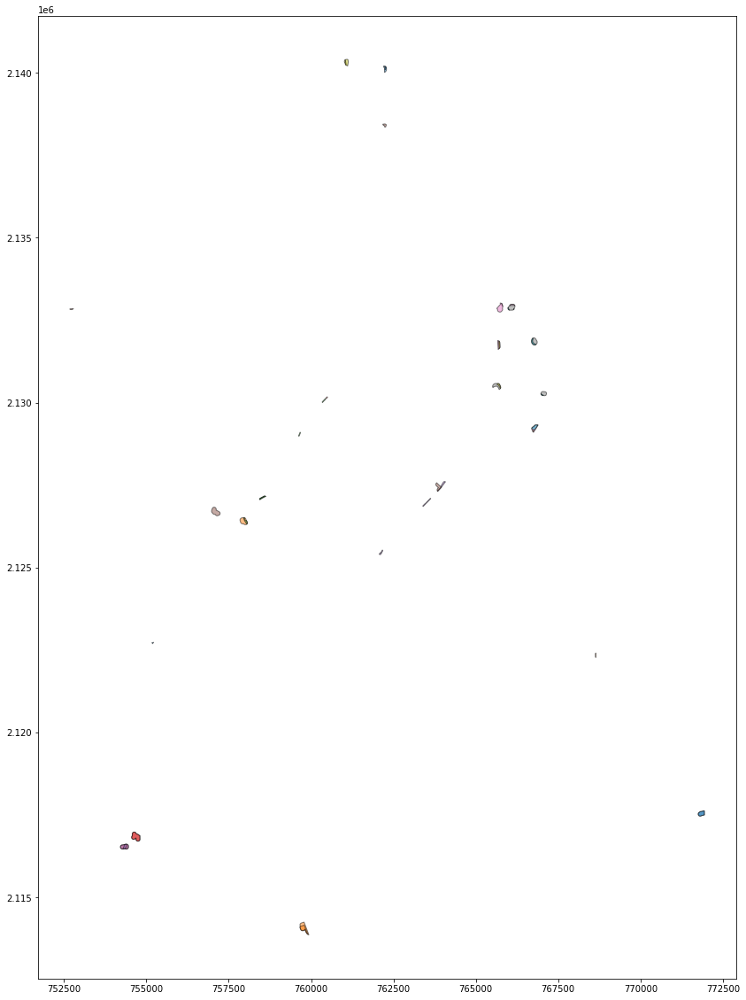

In [110]:
inter_nature.plot(figsize=(20, 20),alpha=0.5, edgecolor='k', cmap='tab10')

In [111]:
output_nature=inter_nature.groupby(by=['osm_id_sensor','type'])['Area'].sum().reset_index()
output_nature.head()

,osm_id_sensor,type,Area
0,28545390.0,park,291645.942259
1,97891369.0,park,43765.149600
2,170833583.0,forest,449238.036421
3,178552402.0,park,365905.342208
4,178552402.0,water,7739.772828


In [112]:
# Calculate park area
park  = inter_nature[inter_nature['type'].str.contains('park')]
output_park = park.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_park.columns=['osm_id',"Park Area"]
output_park.head()

,osm_id,Park Area
0,28545390.0,291645.942259
1,97891369.0,43765.149600
2,178552402.0,365905.342208
3,223881858.0,22048.487385
4,223881880.0,53277.661248


In [113]:
# Calculate water area
water  = inter_nature[inter_nature['type'].str.contains('water')]
output_water= water.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_water.columns=['osm_id',"Water Area"]
output_water.head()

,osm_id,Water Area
0,178552402.0,7739.772828
1,373275516.0,14418.221963
2,459188596.0,70464.714366
3,459209227.0,2127.312556
4,485232341.0,65701.070179


In [114]:
# Calculate forest area
forest  = inter_nature[inter_nature['type'].str.contains('forest')]
output_forest= forest.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_forest.columns=['osm_id',"Forest Area"]
output_forest.head()

,osm_id,Forest Area
0,170833583.0,449238.036421
1,223881880.0,35664.611465
2,356118935.0,96154.215279
3,444480443.0,433890.704497
4,449047423.0,63191.615209


# Use the Point Shape file to calculate the Bicycle parking, Bus/Train stops, Intersection Density, School/College/University

In [115]:
#pts=gpd.read_file("../input/osm-data/points.shp")
pts.head(5)

,osm_id,timestamp,name,type,geometry
0,26451915,None,None,motorway_junctio,POINT (-96.99637 32.98783)
1,26452038,None,None,motorway_junctio,POINT (-96.98721 32.98615)
2,26452114,None,None,motorway_junctio,POINT (-96.97995 32.98980)
3,26452174,None,None,motorway_junctio,POINT (-96.96866 32.99386)
4,26452225,None,None,motorway_junctio,POINT (-96.95477 32.99772)


In [116]:
# set the co-ordinate system first
#pts = pts.set_crs("EPSG:4326")
# Let's take a copy of our layer
pts_proj = pts.copy()

# Reproject the geometries by replacing the values with projected ones
pts_proj = pts_proj.to_crs(epsg=2845)
pts_proj.head(10)

,osm_id,timestamp,name,type,geometry
0,26451915,None,None,motorway_junctio,POINT (740516.824 2147508.476)
1,26452038,None,None,motorway_junctio,POINT (741375.369 2147334.832)
2,26452114,None,None,motorway_junctio,POINT (742047.382 2147748.615)
3,26452174,None,None,motorway_junctio,POINT (743096.215 2148214.553)
4,26452225,None,None,motorway_junctio,POINT (744387.980 2148661.297)
5,26452273,None,None,motorway_junctio,POINT (744212.480 2149188.176)
6,26452497,None,None,motorway_junctio,POINT (746374.867 2151595.471)
7,29577601,None,None,motorway_junctio,POINT (763354.045 2140552.899)
8,30759132,None,None,motorway_junctio,POINT (762502.684 2141082.144)
9,34273651,None,None,traffic_signals,POINT (722964.355 2130856.301)


<AxesSubplot:>

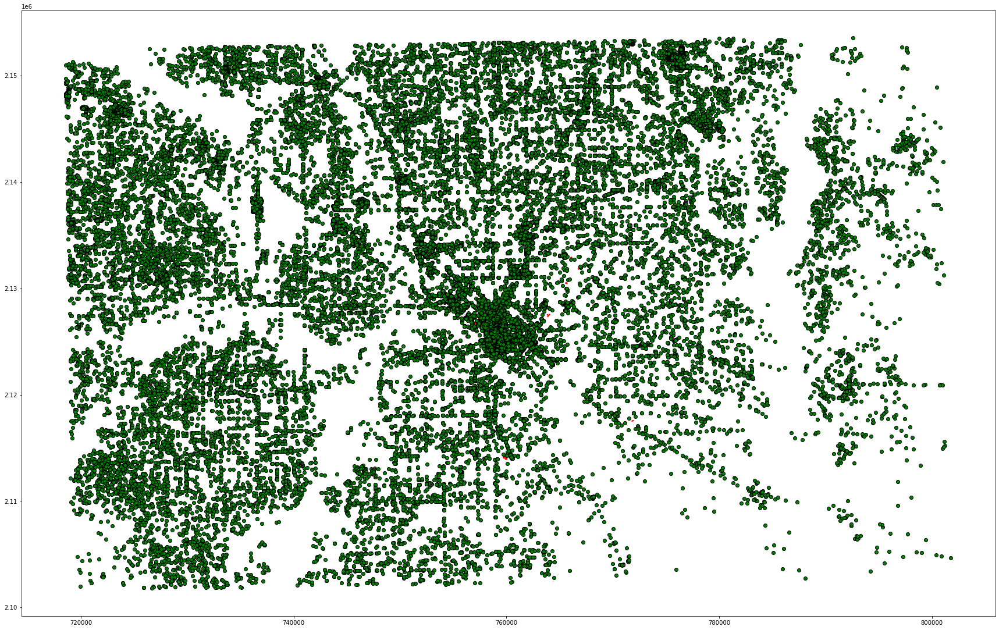

In [117]:
fig, ax = plt.subplots(figsize = (30,25)) 
gdf1.plot(ax=ax,color="red")
pts_proj.plot(color="green",edgecolor='k',ax=ax) #Use your second dataframe

In [118]:
# Clip the data using GeoPandas clip
buffer_clip_pts = gpd.clip(pts_proj, gdf1)
buffer_clip_pts.head(10)

,osm_id,timestamp,name,type,geometry
1408,81702887,None,None,crossing,POINT (760442.919 2130121.902)
2130,81744994,None,None,traffic_signals,POINT (763494.905 2126937.974)
2741,81774403,None,None,traffic_signals,POINT (762081.882 2140110.768)
4420,81859170,None,None,traffic_signals,POINT (763504.208 2126947.445)
5726,81928122,None,None,motorway_junctio,POINT (762113.035 2140022.081)
8621,82116741,None,None,stop,POINT (762031.601 2125507.959)
9831,82223443,None,None,crossing,POINT (760550.947 2130009.402)
18973,1112478453,None,None,crossing,POINT (763497.818 2126954.891)
19689,1369603848,None,None,traffic_signals,POINT (756982.996 2126442.027)
20821,1908753162,None,None,drinking_water,POINT (766718.193 2129175.958)


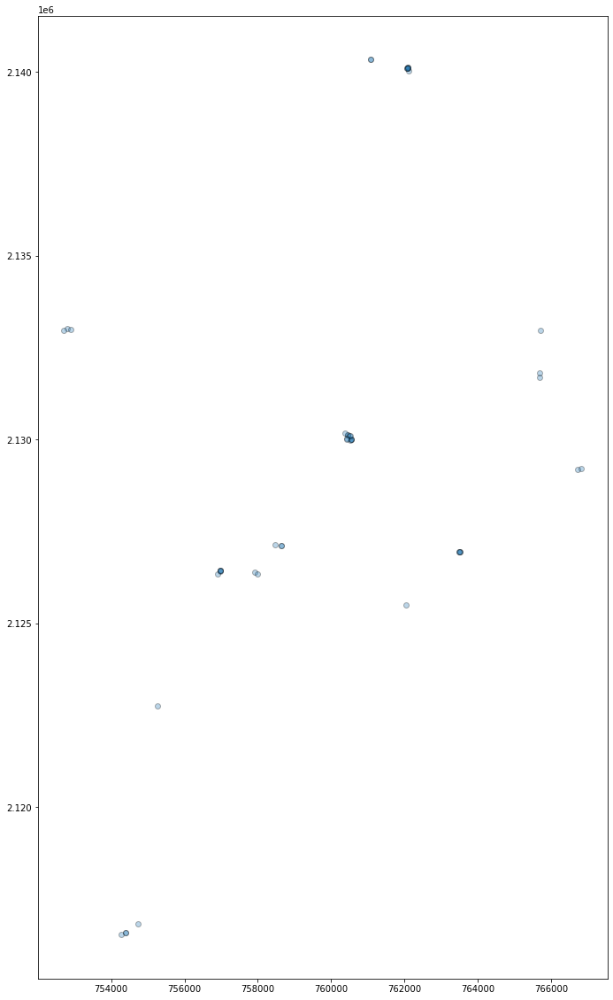

In [119]:
ax = buffer_clip_pts.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [120]:
inter_pts=gpd.overlay(gdf1, buffer_clip_pts, how='intersection', make_valid=True, keep_geom_type=False)
inter_pts.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,buff_dist,buffer_area,osm_id,timestamp,name,type,geometry
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,0.1,0.015957,-677333401,None,None,crossing,POINT (755256.660 2122762.714)
1,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,-96.76442,NaN,493380742.0,0.1,0.016334,81774403,None,None,traffic_signals,POINT (762081.882 2140110.768)
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,-96.76442,NaN,493380742.0,0.1,0.016334,81928122,None,None,motorway_junctio,POINT (762113.035 2140022.081)
3,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,-96.76442,NaN,493380742.0,0.1,0.016334,900071586,None,None,traffic_signals,POINT (762085.448 2140123.126)
4,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,-96.76442,NaN,493380742.0,0.1,0.016334,932073471,None,None,crossing,POINT (762068.499 2140095.253)


# Calculate the bicycle parking

In [121]:
#k1 = df.loc[(df.Product == p_id) & (df.Time >= start_time) & (df.Time < end_time), ['Time', 'Product']]
b_parking = inter_pts[inter_pts['type'].str.contains('bicycle_parking')]
b_parking.head(5)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,buff_dist,buffer_area,osm_id,timestamp,name,type,geometry


In [122]:
output_bparking=b_parking.groupby(by=['osm_id_sensor'])['type'].count().reset_index()
output_bparking.columns=["osm_id","Bicycle Parking"]
output_bparking.head()

,osm_id,Bicycle Parking


# Calculate bus stops

In [123]:
transit_stops= inter_pts[inter_pts['type'].str.contains('bus_stop')]
transit_stops.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,buff_dist,buffer_area,osm_id,timestamp,name,type,geometry


In [124]:
output_bstop=transit_stops.groupby(by=['osm_id_sensor'])['type'].count().reset_index()
output_bstop.columns=["osm_id","Bus Stops"]
output_bstop.head()

,osm_id,Bus Stops


# Calculate school/college/university

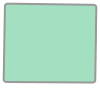

In [125]:
#sc= inter_pts[inter_pts['type'].str.contains('school|college')]
#sc
# convert to unprojected polygon for osmnx data pull
polygon = pba.to_crs(4326).iloc[0]
polygon

In [126]:
# Import school
tags = {'amenity': 'school'}
scl = ox.geometries_from_polygon(polygon, tags)
#scl[['amenity', 'name', 'geometry']]

In [127]:
# set the co-ordinate system first
scl = scl.set_crs("EPSG:4326")
# Let's take a copy of our layer
scl_proj = scl.copy()

# Reproject the geometries by replacing the values with projected ones
scl_proj =scl_proj.to_crs(epsg=2845)
scl_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,unique_id,osmid,element_type,amenity,ele,gnis:county_id,gnis:created,gnis:feature_id,gnis:state_id,name,...,operator:type,denomination,grades,ways,type,isced:level,short_name,capacity,official_name,old_name_1
0,node/356704980,356704980,node,school,147,113,11/30/1979,1334844,48,Eagle Ford School,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,node/356708654,356708654,node,school,152,113,11/30/1979,1338373,48,Immaculate Conception School,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,node/356720564,356720564,node,school,176,113,11/30/1979,1345881,48,Saint Cecilia School,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,node/356720611,356720611,node,school,181,113,11/30/1979,1345919,48,Saint James School,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,node/356793975,356793975,node,school,226,113,10/06/2003,2004097,48,West Intermediate School,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [128]:
scl_proj['geometry']=scl_proj['geometry'].centroid
scl_proj.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,unique_id,osmid,element_type,amenity,ele,gnis:county_id,gnis:created,gnis:feature_id,gnis:state_id,name,...,operator:type,denomination,grades,ways,type,isced:level,short_name,capacity,official_name,old_name_1
0,node/356704980,356704980,node,school,147,113,11/30/1979,1334844,48,Eagle Ford School,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,node/356708654,356708654,node,school,152,113,11/30/1979,1338373,48,Immaculate Conception School,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,node/356720564,356720564,node,school,176,113,11/30/1979,1345881,48,Saint Cecilia School,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,node/356720611,356720611,node,school,181,113,11/30/1979,1345919,48,Saint James School,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,node/356793975,356793975,node,school,226,113,10/06/2003,2004097,48,West Intermediate School,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [129]:
buffer_clip_scl = gpd.clip(scl_proj, gdf1)
inter_scl=gpd.overlay(gdf1, buffer_clip_scl, how='intersection', make_valid=True, keep_geom_type=False)
inter_scl.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,addr:postcode,addr:city,building,old_name3,alt_name1,stv_c_adb,buff_dist,ways,gnis:county_id,capacity,...,short_name,wikipedia,osm_id_sensor,wheelchair,buffer_area,stv_adb,old_name2,element_type,designation,note


In [130]:
scl_proj['geometry']=scl_proj['geometry'].centroid
buffer_clip_scl = gpd.clip(scl_proj, gdf1)
output_school=inter_scl.groupby(by=['osm_id_sensor'])['geometry'].count().reset_index()
output_school.columns=["osm_id","School"]
output_school.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,School


# Closest distance to school

In [131]:
def min_distance_ppoly(point, polygon):
    return polygon.distance(point).min()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [132]:
ecoshort['min_dist_to_school'] = ecoshort.geometry.apply(min_distance_ppoly, args=(scl_proj,))*3.28084
output_school_distance=ecoshort.loc[:,["osm_id_sensor","min_dist_to_school"]]
output_school_distance.columns=["osm_id","min_dist_to_school"]
output_school_distance=output_school_distance.drop_duplicates(subset=['osm_id'],keep='first')
output_school_distance.head()

,osm_id,min_dist_to_school
0,496723098.0,4010.859297
7,356309596.0,2112.838300
14,493380742.0,1681.682738
21,461234382.0,2926.101046
28,472409339.0,3209.924147


In [133]:
# Import college
tags = {'amenity': 'college'}
coll = ox.geometries_from_polygon(polygon, tags)
# set the co-ordinate system first
coll = coll.set_crs("EPSG:4326")
# Let's take a copy of our layer
coll_proj = coll.copy()

# Reproject the geometries by replacing the values with projected ones
coll_proj =coll_proj.to_crs(epsg=2845)
coll_proj['geometry']=coll_proj['geometry'].centroid
buffer_clip_coll = gpd.clip(coll_proj, gdf1)
inter_coll=gpd.overlay(gdf1, buffer_clip_coll, how='intersection', make_valid=True, keep_geom_type=False)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [134]:
output_college=inter_coll.groupby(by=['osm_id_sensor'])['geometry'].count().reset_index()
output_college.columns=["osm_id","college"]
output_college.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,college


# Closest distance to college

In [135]:
ecoshort['min_dist_to_college'] = ecoshort.geometry.apply(min_distance_ppoly, args=(coll_proj,))*3.28084
output_college_distance=ecoshort.loc[:,["osm_id_sensor","min_dist_to_college"]]
output_college_distance.columns=["osm_id","min_dist_to_college"]
output_college_distance=output_college_distance.drop_duplicates(subset=['osm_id'],keep='first')
output_college_distance.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,min_dist_to_college
0,496723098.0,35171.758189
7,356309596.0,12970.284590
14,493380742.0,6991.896593
21,461234382.0,35625.793719
28,472409339.0,23656.239658


In [136]:
# Import college
tags = {'amenity': 'university'}
uni = ox.geometries_from_polygon(polygon, tags)
# set the co-ordinate system first
uni = uni.set_crs("EPSG:4326")
# Let's take a copy of our layer
uni_proj = uni.copy()

# Reproject the geometries by replacing the values with projected ones
uni_proj =uni_proj.to_crs(epsg=2845)
uni_proj['geometry']=uni_proj['geometry'].centroid
buffer_clip_uni = gpd.clip(uni_proj, gdf1)
inter_uni=gpd.overlay(gdf1, buffer_clip_uni, how='intersection', make_valid=True, keep_geom_type=False)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [137]:
output_university=inter_uni.groupby(by=['osm_id_sensor'])['geometry'].count().reset_index()
#output_university.loc[output_university['geometry'] > 0, 'geometry'] = 1
#output_university.loc[output_university['geometry'] ==0, 'geometry'] = 0
output_university.columns=["osm_id","University"]
output_university.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,University


In [138]:
#scu=pd.concat([sc,u],axis=0)
#scu

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Closest distance to university

In [139]:
ecoshort['min_dist_to_university'] = ecoshort.geometry.apply(min_distance_ppoly, args=(uni_proj,))*3.28084
output_university_distance=ecoshort.loc[:,["osm_id_sensor","min_dist_to_university"]]
output_university_distance.columns=["osm_id","min_dist_to_university"]
output_university_distance=output_university_distance.drop_duplicates(subset=['osm_id'],keep='first')
output_university_distance.head()

,osm_id,min_dist_to_university
0,496723098.0,17504.499814
7,356309596.0,16150.771328
14,493380742.0,25103.203284
21,461234382.0,29384.589591
28,472409339.0,23751.485989


# Calculate OSM_node_ density

In [140]:
# lets bring the road shape file node to calculate the intersection density

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [141]:
#!pip install networkx
#!pip install osmnx
import networkx as nx
import osmnx as ox
from shapely.geometry.multipolygon import MultiPolygon
from shapely import wkt


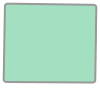

In [142]:
# convert to unprojected polygon for osmnx data pull
polygon = pba.to_crs(4326).iloc[0]
polygon


In [143]:
#!pip install networkx
#!pip install osmnx
import networkx as nx
import osmnx as ox
ox.config(log_file=True,log_console=True,use_cache=True)
#place="Portland,USA"
#Construct the street network
G=ox.graph_from_polygon(polygon,network_type="drive",simplify=False)
#G_projected=ox.project_graph(G)
#fig, ax = ox.plot_graph(G,node_color='yellow',edge_color='blue')

In [144]:
nodes, edges = ox.graph_to_gdfs(G)
nodes.head(5)

,y,x,street_count,highway,ref,geometry
osmid,,,,,,
81538115,32.618647,-96.770977,3,NaN,NaN,POINT (-96.77098 32.61865)
81538167,32.650720,-96.908446,3,NaN,NaN,POINT (-96.90845 32.65072)
81538169,32.650717,-96.909002,2,NaN,NaN,POINT (-96.90900 32.65072)
81538171,32.650703,-96.909191,2,NaN,NaN,POINT (-96.90919 32.65070)
81538173,32.650684,-96.909440,2,NaN,NaN,POINT (-96.90944 32.65068)


In [145]:
# set the co-ordinate system first
node = nodes.set_crs("EPSG:4326")
# Let's take a copy of our layer
node_proj = node.copy()

# Reproject the geometries by replacing the values with projected ones
node_proj = node_proj.to_crs(epsg=2845)
node_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,y,x,street_count,highway,ref,geometry
osmid,,,,,,
81538115,32.618647,-96.770977,3,NaN,NaN,POINT (762251.609 2106899.984)
81538167,32.650720,-96.908446,3,NaN,NaN,POINT (749298.720 2110252.171)
81538169,32.650717,-96.909002,2,NaN,NaN,POINT (749246.602 2110251.005)
81538171,32.650703,-96.909191,2,NaN,NaN,POINT (749228.869 2110249.228)
81538173,32.650684,-96.909440,2,NaN,NaN,POINT (749205.544 2110246.767)


In [146]:
# Clip the data using GeoPandas clip
buffer_clip_node = gpd.clip(node_proj, gdf1)
buffer_clip_node.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,y,x,street_count,highway,ref,geometry
osmid,,,,,,
81820884,32.685034,-96.794639,4,NaN,NaN,POINT (759911.924 2114224.130)
81820886,32.684910,-96.794580,4,NaN,NaN,POINT (759917.632 2114210.537)
81820888,32.684776,-96.794518,2,NaN,NaN,POINT (759923.687 2114195.742)
81820889,32.684669,-96.794453,2,NaN,NaN,POINT (759929.974 2114183.977)
81820891,32.684479,-96.794244,2,NaN,NaN,POINT (759949.912 2114163.230)


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


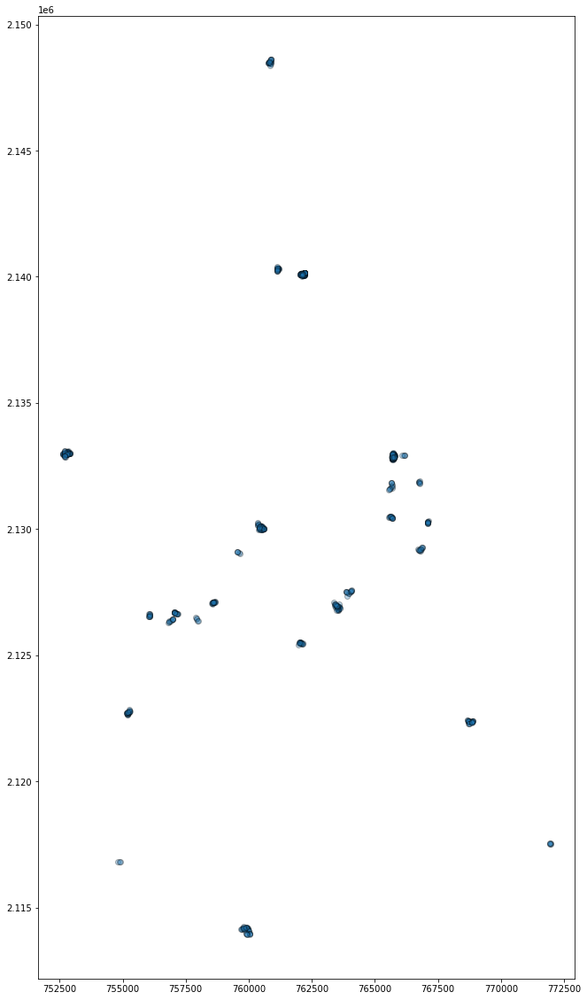

In [147]:
ax = buffer_clip_node.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [148]:
 inter_node=gpd.overlay(gdf1, buffer_clip_node, how='intersection', make_valid=True, keep_geom_type=False)
 inter_node.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,comment,osm_id_sensor,buff_dist,buffer_area,y,x,street_count,highway,ref,geometry
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,Kessler Pkwy (141085) parallel might be steali...,356309596.0,0.1,0.015957,32.763125,-96.842862,2,NaN,NaN,POINT (755253.843 2122809.991)
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,Kessler Pkwy (141085) parallel might be steali...,356309596.0,0.1,0.015957,32.761502,-96.843601,2,NaN,NaN,POINT (755187.423 2122628.973)
2,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,Kessler Pkwy (141085) parallel might be steali...,356309596.0,0.1,0.015957,32.761682,-96.843600,2,NaN,NaN,POINT (755187.221 2122648.932)
3,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,Kessler Pkwy (141085) parallel might be steali...,356309596.0,0.1,0.015957,32.761904,-96.843554,3,NaN,NaN,POINT (755191.085 2122673.635)
4,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,Kessler Pkwy (141085) parallel might be steali...,356309596.0,0.1,0.015957,32.762032,-96.843606,2,NaN,NaN,POINT (755186.028 2122687.728)


In [149]:
output_intersection_density= inter_node.groupby(by=['osm_id_sensor'])['geometry'].count()
output_intersection_density12=output_intersection_density.reset_index()
output_intersection_density12.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,geometry
0,28545390.0,13
1,97891369.0,17
2,170833583.0,5
3,178552402.0,12
4,223881858.0,5


In [150]:
b_area=gdf1.loc[:,['osm_id_sensor','buffer_area']]
b_area.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,buffer_area
13,356309596.0,0.015957
20,493380742.0,0.016334
27,461234382.0,0.010540
34,472409339.0,0.014490
41,469524545.0,0.046159


In [151]:
output_intersection_density1=pd.merge(output_intersection_density12,b_area,left_on="osm_id_sensor",right_on='osm_id_sensor',how="inner")
output_intersection_density1["Intersection Density"]=output_intersection_density1["geometry"]/output_intersection_density1["buffer_area"]
output_intersection_density1=output_intersection_density1.loc[:,['osm_id_sensor','Intersection Density']]
output_intersection_density1.columns=['osm_id','OSM_node_Density']
output_intersection_density1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,OSM_node_Density
0,28545390.0,565.952015
1,97891369.0,1377.888133
2,170833583.0,372.773740
3,178552402.0,820.029728
4,223881858.0,516.350373


In [152]:
# just to produce zero value
#output_intersection_density1=output_intersection_density12
#output_intersection_density1.columns=['osm_id','OSM_node_Density']
#output_intersection_density1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Calculate the intersection density

In [153]:
custom_filter = ox.downloader._get_osm_filter("drive")
custom_filter += '["highway"!~"motor"]'  # filter out freeways
Ga = ox.graph_from_polygon(polygon, custom_filter=custom_filter, simplify=True)

In [154]:
nodesa, edgesa = ox.graph_to_gdfs(Ga)
# set the co-ordinate system first
nodea = nodesa.set_crs("EPSG:4326")
# Let's take a copy of our layer
nodea_proj = nodea.copy()
# Reproject the geometries by replacing the values with projected ones
nodea_proj = nodea_proj.to_crs(epsg=2845)

In [155]:
buffer_clip_nodea = gpd.clip(nodea_proj, gdf1)
inter_nodea=gpd.overlay(gdf1, buffer_clip_nodea, how='intersection', make_valid=True, keep_geom_type=False)
output_intersection_densitya= inter_nodea.groupby(by=['osm_id_sensor'])['geometry'].count()
output_intersection_density12a=output_intersection_densitya.reset_index()
output_intersection_density1a=pd.merge(output_intersection_density12a,b_area,left_on="osm_id_sensor",right_on='osm_id_sensor',how="inner")
output_intersection_density1a["Intersection Density"]=output_intersection_density1a["geometry"]/output_intersection_density1a["buffer_area"]
output_intersection_density1a=output_intersection_density1a.loc[:,['osm_id_sensor','Intersection Density']]
output_intersection_density1a.columns=['osm_id','Intersection_Density']
output_intersection_density1a.head()

,osm_id,Intersection_Density
0,28545390.0,217.673852
1,97891369.0,486.313459
2,178552402.0,273.343243
3,223881858.0,206.540149
4,223881880.0,258.164605


# Calculate the Number of Lanes

In [156]:
edges.head(10)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid                   name      highway  \
u        v          key                                                  
81538115 7373901193 0     39586912  West Wintergreen Road     tertiary   
         7373977034 0     39586912  West Wintergreen Road     tertiary   
         81538113   0      9936847          Rutgers Drive  residential   
81538167 7281969133 0      9936852    West Freeman Street  residential   
         81719249   0    151906871      South Main Street    secondary   
         7052078742 0    151906871      South Main Street    secondary   
81538169 7281969136 0      9936852    West Freeman Street  residential   
         7281969133 0      9936852    West Freeman Street  residential   
81538171 81538173   0      9936852    West Freeman Street  residential   
         7281969136 0      9936852    West Freeman Street  residential   

                         oneway  length lanes  ref maxspeed bridge access  \
u        v          key                                                     
81538115 7373901193 0     False   3.063   NaN  NaN      NaN    NaN    NaN   
         7373977034 0     False  42.250   NaN  NaN      NaN    NaN    NaN   
         81538113   0     False  72.282   NaN  NaN      NaN    NaN    NaN   
81538167 7281969133 0     False  31.936   NaN  NaN      NaN    NaN    NaN   
         81719249   0     False  24.908   NaN  NaN      NaN    NaN    NaN   
         7052078742 0     False  23.006   NaN  NaN      NaN    NaN    NaN   
81538169 7281969136 0     False  14.538   NaN  NaN      NaN    NaN    NaN   
         7281969133 0     False  20.100   NaN  NaN      NaN    NaN    NaN   
81538171 81538173   0     False  23.408   NaN  NaN      NaN    NaN    NaN   
         7281969136 0     False   3.307   NaN  NaN      NaN    NaN    NaN   

                        junction tunnel  \
u        v          key                   
81538115 7373901193 0        NaN    NaN   
         7373977034 0        NaN    NaN   
         81538113   0        NaN    NaN   
81538167 7281969133 0        NaN    NaN   
         81719249   0        NaN    NaN   
         7052078742 0        NaN    NaN   
81538169 7281969136 0        NaN    NaN   
         7281969133 0        NaN    NaN   
81538171 81538173   0        NaN    NaN   
         7281969136 0        NaN    NaN   

                                                                  geometry  
u        v          key                                                     
81538115 7373901193 0    LINESTRING (-96.77098 32.61865, -96.77101 32.6...  
         7373977034 0    LINESTRING (-96.77098 32.61865, -96.77053 32.6...  
         81538113   0    LINESTRING (-96.77098 32.61865, -96.77099 32.6...  
81538167 7281969133 0    LINESTRING (-96.90845 32.65072, -96.90879 32.6...  
         81719249   0    LINESTRING (-96.90845 32.65072, -96.90845 32.6...  
         7052078742 0    LINESTRING (-96.90845 32.65072, -96.90845 32.6...  
81538169 7281969136 0    LINESTRING (-96.90900 32.65072, -96.90916 32.6...  
         7281969133 0    LINESTRING (-96.90900 32.65072, -96.90879 32.6...  
81538171 81538173   0    LINESTRING (-96.90919 32.65070, -96.90944 32.6...  
         7281969136 0    LINESTRING (-96.90919 32.65070, -96.90916 32.6...

In [157]:
print(edges.crs)

epsg:4326


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [158]:
# set the co-ordinate system first
edge = edges.set_crs("EPSG:4326")
# Let's take a copy of our layer
edge_proj = edge.copy()

# Reproject the geometries by replacing the values with projected ones
edge_proj = edge_proj.to_crs(epsg=2845)
edge_proj.head(5)

osmid                   name      highway  \
u        v          key                                                  
81538115 7373901193 0     39586912  West Wintergreen Road     tertiary   
         7373977034 0     39586912  West Wintergreen Road     tertiary   
         81538113   0      9936847          Rutgers Drive  residential   
81538167 7281969133 0      9936852    West Freeman Street  residential   
         81719249   0    151906871      South Main Street    secondary   

                         oneway  length lanes  ref maxspeed bridge access  \
u        v          key                                                     
81538115 7373901193 0     False   3.063   NaN  NaN      NaN    NaN    NaN   
         7373977034 0     False  42.250   NaN  NaN      NaN    NaN    NaN   
         81538113   0     False  72.282   NaN  NaN      NaN    NaN    NaN   
81538167 7281969133 0     False  31.936   NaN  NaN      NaN    NaN    NaN   
         81719249   0     False  24.908   NaN  NaN      NaN    NaN    NaN   

                        junction tunnel  \
u        v          key                   
81538115 7373901193 0        NaN    NaN   
         7373977034 0        NaN    NaN   
         81538113   0        NaN    NaN   
81538167 7281969133 0        NaN    NaN   
         81719249   0        NaN    NaN   

                                                                  geometry  
u        v          key                                                     
81538115 7373901193 0    LINESTRING (762251.609 2106899.984, 762248.540...  
         7373977034 0    LINESTRING (762251.609 2106899.984, 762293.942...  
         81538113   0    LINESTRING (762251.609 2106899.984, 762251.950...  
81538167 7281969133 0    LINESTRING (749298.720 2110252.171, 749266.722...  
         81719249   0    LINESTRING (749298.720 2110252.171, 749298.307...

In [159]:
# Consider rows without NAN
edge_clean = edge_proj[edge_proj['lanes'].notna()]
edge_clean2 = edge_clean [edge_clean.lanes!=0]
edge_clean2.head(10)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid                           name  \
u        v          key                                             
81538180 82077735   0    759044969           South Santa Fe Trail   
         82077732   0    759044969           South Santa Fe Trail   
81538203 82109937   0    367429087               West Main Street   
         81869578   0    367429087               West Main Street   
81538621 3700583568 0    315701237           East Pioneer Parkway   
81539117 4949974111 0      9936907                            NaN   
81539119 81843586   0    122797972  South Walton Walker Boulevard   
         4949974113 0    504903996                            NaN   
81539635 3894617040 0      9939870                            NaN   
81539637 81539639   0      9939870                            NaN   

                               highway  oneway   length lanes       ref  \
u        v          key                                                   
81538180 82077735   0         tertiary   False   60.471     4       NaN   
         82077732   0         tertiary   False   36.220     4       NaN   
81538203 82109937   0          primary   False  101.143     4    TX 180   
         81869578   0          primary   False  100.139     4    TX 180   
81538621 3700583568 0          primary    True    6.532     3  Spur 303   
81539117 4949974111 0    motorway_link    True  101.864     1       NaN   
81539119 81843586   0         motorway    True   49.161     4   Loop 12   
         4949974113 0    motorway_link    True   47.086     1       NaN   
81539635 3894617040 0    motorway_link    True   34.289     1       NaN   
81539637 81539639   0    motorway_link    True   37.131     1       NaN   

                        maxspeed bridge access junction tunnel  \
u        v          key                                          
81538180 82077735   0        NaN    NaN    NaN      NaN    NaN   
         82077732   0        NaN    NaN    NaN      NaN    NaN   
81538203 82109937   0        NaN    NaN    NaN      NaN    NaN   
         81869578   0        NaN    NaN    NaN      NaN    NaN   
81538621 3700583568 0     45 mph    NaN    NaN      NaN    NaN   
81539117 4949974111 0        NaN    NaN    NaN      NaN    NaN   
81539119 81843586   0     70 mph    NaN    NaN      NaN    NaN   
         4949974113 0        NaN    NaN    NaN      NaN    NaN   
81539635 3894617040 0        NaN    NaN    NaN      NaN    NaN   
81539637 81539639   0        NaN    NaN    NaN      NaN    NaN   

                                                                  geometry  
u        v          key                                                     
81538180 82077735   0    LINESTRING (749158.821 2110246.836, 749117.913...  
         82077732   0    LINESTRING (749158.821 2110246.836, 749181.663...  
81538203 82109937   0    LINESTRING (738208.942 2120111.242, 738108.964...  
         81869578   0    LINESTRING (738208.942 2120111.242, 738307.929...  
81538621 3700583568 0    LINESTRING (741157.339 2116633.344, 741163.878...  
81539117 4949974111 0    LINESTRING (748132.706 2119263.040, 748148.190...  
81539119 81843586   0    LINESTRING (748119.432 2119149.789, 748114.236...  
         4949974113 0    LINESTRING (748119.432 2119149.789, 748127.838...  
81539635 3894617040 0    LINESTRING (748139.606 2117962.134, 748127.808...  
81539637 81539639   0    LINESTRING (748036.036 2117720.102, 748018.017...

In [160]:
def nearest_linestring(point, df_lines):
    idx = df_lines.geometry.distance(point).idxmin()
    return df_lines.loc[idx, 'lanes']

ecoshort['lanes'] = ecoshort.geometry.apply(nearest_linestring, df_lines=edge_clean2)
ecoshort
ecoshort_lane=ecoshort.copy()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [161]:
ecoshort_lane

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.707870,-96.708810,NaN,496723098.0,2.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1
7,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.762840,-96.842440,Kessler Pkwy (141085) parallel might be steali...,356309596.0,2.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2
14,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.918850,-96.764420,NaN,493380742.0,2.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1
21,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.713070,-96.667790,NaN,461234382.0,2.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4
28,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,32.757810,-96.700380,NaN,472409339.0,2.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3
35,P007DAL,Glendale Park Loop Trail,permanent,2019,Dallas,3.0,15.088095,0.000000,0.000000,8.0,32.681450,-96.794260,NaN,469524545.0,2.0,POINT (759953.159 2113827.997),2908.174822,23049.434040,8596.239869,3
42,P008DAL,Katy Trail (Houston St / AA Center),permanent,2019,Dallas,3.0,409.750513,42.575342,9.273973,1373.0,32.793570,-96.811820,parallel link (1687094),170833583.0,2.0,POINT (758106.859 2126232.482),4305.670572,5417.707278,6733.949124,6
49,P009DAL,Katy Trail at Cedar Springs Rd,permanent,2019,Dallas,3.0,632.923809,40.821918,9.547945,2624.0,32.802600,-96.804810,parallel link (1447148),223881880.0,2.0,POINT (758747.168 2127244.240),1064.196519,8043.414705,8050.947768,3
56,P010DAL,Katy Trail at Fitzhugh,permanent,2019,Dallas,3.0,521.530357,41.205479,9.876712,2559.0,32.818420,-96.794980,NaN,223881858.0,2.0,POINT (759639.154 2129013.154),1673.316667,9605.870748,9242.108118,3
63,P011DAL,Katy Trail at Harvard Avenue,permanent,2019,Dallas,3.0,304.138095,41.767123,7.972603,1124.0,32.828480,-96.785900,parallel link (1447146),313514317.0,2.0,POINT (760471.028 2130142.374),2652.643525,5048.796223,4866.476013,5


In [162]:
# The above lanes need manual cleaning as current aggregation is odd
#pd.DataFrame.to_csv(ecoshort_lane, 'lane_portland.csv', sep=',', na_rep='.', index=False)
# edit this file manually

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [163]:
# now import again after edit
#lane_modified=pd.read_csv("C:/Users/mxm5116/Desktop/Bike Fusion/lane_portland1.csv")
#lane_modified

In [164]:
output_lane=ecoshort_lane.loc[:,['osm_id_sensor','lanes']]
output_lane.columns=['osm_id','lanes']
output_lane=output_lane.drop_duplicates(subset=['osm_id'],keep='first')
output_lane.head()

,osm_id,lanes
0,496723098.0,1
7,356309596.0,2
14,493380742.0,1
21,461234382.0,4
28,472409339.0,3


# Calculate the cycleway-left, cycleway-right and cycleway from OSM bike Network within the buffer

In [165]:
# This is osmnx's default OSM tag set for links
print(ox.settings.useful_tags_way)

['bridge', 'tunnel', 'oneway', 'lanes', 'ref', 'name', 'highway', 'maxspeed', 'service', 'access', 'area', 'landuse', 'width', 'est_width', 'junction']


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [166]:
### Modify run params here ###
extra_way_tags = ['cycleway', 'cycleway:left', 'cycleway:right']  # add'l OSM tags to keep

In [167]:
# Can add any OSM tag--will be populated if available
useful_tags = ox.settings.useful_tags_way + extra_way_tags
ox.config(use_cache=True, log_console=True, useful_tags_way=useful_tags)
print(ox.settings.useful_tags_way)

['bridge', 'tunnel', 'oneway', 'lanes', 'ref', 'name', 'highway', 'maxspeed', 'service', 'access', 'area', 'landuse', 'width', 'est_width', 'junction', 'cycleway', 'cycleway:left', 'cycleway:right']


In [168]:
Gc=ox.graph_from_polygon(polygon, network_type='bike',simplify=False)
#G = gpd.clip(G, pba)
#G_projected=ox.project_graph(G)
#fig, ax = ox.plot_graph(Gc,node_color='yellow',edge_color='blue')

In [169]:
nodesc, edgesc = ox.graph_to_gdfs(Gc)
edgesc.head(5)

osmid                   name      highway  \
u        v          key                                                  
81538115 7373901193 0     39586912  West Wintergreen Road     tertiary   
         7373977034 0     39586912  West Wintergreen Road     tertiary   
         81538113   0      9936847          Rutgers Drive  residential   
81538167 7281969133 0      9936852    West Freeman Street  residential   
         81719249   0    151906871      South Main Street    secondary   

                         oneway  length lanes service  ref maxspeed  \
u        v          key                                               
81538115 7373901193 0     False   3.063   NaN     NaN  NaN      NaN   
         7373977034 0     False  42.250   NaN     NaN  NaN      NaN   
         81538113   0     False  72.282   NaN     NaN  NaN      NaN   
81538167 7281969133 0     False  31.936   NaN     NaN  NaN      NaN   
         81719249   0     False  24.908   NaN     NaN  NaN      NaN   

                        cycleway:right cycleway access bridge cycleway:left  \
u        v          key                                                       
81538115 7373901193 0              NaN      NaN    NaN    NaN           NaN   
         7373977034 0              NaN      NaN    NaN    NaN           NaN   
         81538113   0              NaN      NaN    NaN    NaN           NaN   
81538167 7281969133 0              NaN      NaN    NaN    NaN           NaN   
         81719249   0              NaN      NaN    NaN    NaN           NaN   

                        junction tunnel width  \
u        v          key                         
81538115 7373901193 0        NaN    NaN   NaN   
         7373977034 0        NaN    NaN   NaN   
         81538113   0        NaN    NaN   NaN   
81538167 7281969133 0        NaN    NaN   NaN   
         81719249   0        NaN    NaN   NaN   

                                                                  geometry  
u        v          key                                                     
81538115 7373901193 0    LINESTRING (-96.77098 32.61865, -96.77101 32.6...  
         7373977034 0    LINESTRING (-96.77098 32.61865, -96.77053 32.6...  
         81538113   0    LINESTRING (-96.77098 32.61865, -96.77099 32.6...  
81538167 7281969133 0    LINESTRING (-96.90845 32.65072, -96.90879 32.6...  
         81719249   0    LINESTRING (-96.90845 32.65072, -96.90845 32.6...

In [170]:
# set the co-ordinate system first
edgesc = edgesc.set_crs("EPSG:4326")
# Let's take a copy of our layer
cycleway_proj = edgesc.copy()

# Reproject the geometries by replacing the values with projected ones
cycleway_proj = cycleway_proj.to_crs(epsg=2845)
cycleway_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid                   name      highway  \
u        v          key                                                  
81538115 7373901193 0     39586912  West Wintergreen Road     tertiary   
         7373977034 0     39586912  West Wintergreen Road     tertiary   
         81538113   0      9936847          Rutgers Drive  residential   
81538167 7281969133 0      9936852    West Freeman Street  residential   
         81719249   0    151906871      South Main Street    secondary   

                         oneway  length lanes service  ref maxspeed  \
u        v          key                                               
81538115 7373901193 0     False   3.063   NaN     NaN  NaN      NaN   
         7373977034 0     False  42.250   NaN     NaN  NaN      NaN   
         81538113   0     False  72.282   NaN     NaN  NaN      NaN   
81538167 7281969133 0     False  31.936   NaN     NaN  NaN      NaN   
         81719249   0     False  24.908   NaN     NaN  NaN      NaN   

                        cycleway:right cycleway access bridge cycleway:left  \
u        v          key                                                       
81538115 7373901193 0              NaN      NaN    NaN    NaN           NaN   
         7373977034 0              NaN      NaN    NaN    NaN           NaN   
         81538113   0              NaN      NaN    NaN    NaN           NaN   
81538167 7281969133 0              NaN      NaN    NaN    NaN           NaN   
         81719249   0              NaN      NaN    NaN    NaN           NaN   

                        junction tunnel width  \
u        v          key                         
81538115 7373901193 0        NaN    NaN   NaN   
         7373977034 0        NaN    NaN   NaN   
         81538113   0        NaN    NaN   NaN   
81538167 7281969133 0        NaN    NaN   NaN   
         81719249   0        NaN    NaN   NaN   

                                                                  geometry  
u        v          key                                                     
81538115 7373901193 0    LINESTRING (762251.609 2106899.984, 762248.540...  
         7373977034 0    LINESTRING (762251.609 2106899.984, 762293.942...  
         81538113   0    LINESTRING (762251.609 2106899.984, 762251.950...  
81538167 7281969133 0    LINESTRING (749298.720 2110252.171, 749266.722...  
         81719249   0    LINESTRING (749298.720 2110252.171, 749298.307...

In [171]:
# Clip the data using GeoPandas clip
buffer_clip_cycleway = gpd.clip(cycleway_proj, gdf1)
buffer_clip_cycleway.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid                  name      highway  oneway  \
u        v        key                                                         
81820883 81820884 0      9965999       Burnside Avenue  residential   False   
81820884 81820886 0      9965999       Burnside Avenue  residential   False   
         81820883 0      9965999       Burnside Avenue  residential   False   
         82127375 0    426973073  East Ledbetter Drive      primary    True   
81820886 81820884 0      9965999       Burnside Avenue  residential   False   

                        length lanes service      ref maxspeed cycleway:right  \
u        v        key                                                           
81820883 81820884 0     62.276   NaN     NaN      NaN      NaN            NaN   
81820884 81820886 0     14.773   NaN     NaN      NaN      NaN            NaN   
         81820883 0     62.276   NaN     NaN      NaN      NaN            NaN   
         82127375 0    104.701   NaN     NaN  Loop 12      NaN            NaN   
81820886 81820884 0     14.773   NaN     NaN      NaN      NaN            NaN   

                      cycleway access bridge cycleway:left junction tunnel  \
u        v        key                                                        
81820883 81820884 0        NaN    NaN    NaN           NaN      NaN    NaN   
81820884 81820886 0        NaN    NaN    NaN           NaN      NaN    NaN   
         81820883 0        NaN    NaN    NaN           NaN      NaN    NaN   
         82127375 0        NaN    NaN    NaN           NaN      NaN    NaN   
81820886 81820884 0        NaN    NaN    NaN           NaN      NaN    NaN   

                      width                                           geometry  
u        v        key                                                           
81820883 81820884 0     NaN  LINESTRING (759896.355 2114266.694, 759911.924...  
81820884 81820886 0     NaN  LINESTRING (759911.924 2114224.130, 759917.632...  
         81820883 0     NaN  LINESTRING (759911.924 2114224.130, 759896.355...  
         82127375 0     NaN  LINESTRING (759911.924 2114224.130, 759812.380...  
81820886 81820884 0     NaN  LINESTRING (759917.632 2114210.537, 759911.924...

In [172]:
 inter_cycleway=gpd.overlay(gdf1, buffer_clip_cycleway, how='intersection', make_valid=True, keep_geom_type=False)
 inter_cycleway.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,maxspeed,cycleway:right,cycleway,access,bridge,cycleway:left,junction,tunnel,width,geometry
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,NaN,lane,NaN,NaN,NaN,lane,NaN,NaN,NaN,"LINESTRING (755253.843 2122809.991, 755253.003..."
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,NaN,lane,NaN,NaN,yes,lane,NaN,NaN,NaN,"LINESTRING (755253.843 2122809.991, 755255.525..."
2,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (755199.251 2122801.755, 755175.092..."
3,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (755199.251 2122801.755, 755216.611..."
4,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (755175.092 2122801.353, 755199.251..."


In [173]:
 inter_cycleway["Length"]= inter_cycleway["geometry"].length*3.28084 # in ft
 inter_cycleway.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,cycleway:right,cycleway,access,bridge,cycleway:left,junction,tunnel,width,geometry,Length
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,lane,NaN,NaN,NaN,lane,NaN,NaN,NaN,"LINESTRING (755253.843 2122809.991, 755253.003...",77.323658
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,lane,NaN,NaN,yes,lane,NaN,NaN,NaN,"LINESTRING (755253.843 2122809.991, 755255.525...",116.039403
2,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (755199.251 2122801.755, 755175.092...",79.270587
3,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (755199.251 2122801.755, 755216.611...",57.878567
4,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (755175.092 2122801.353, 755199.251...",79.270587


In [174]:
inter_cycleway['cycleway:right'].describe()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


count              68
unique              2
top       shared_lane
freq               58
Name: cycleway:right, dtype: object

In [175]:
# Calculate the cycleway left, right and lane length within the buffer
bike_left=inter_cycleway[inter_cycleway['cycleway:left']=='lane']
bike_right=inter_cycleway[inter_cycleway['cycleway:right']=='lane']
bikeway_lane= inter_cycleway[inter_cycleway['cycleway']=='lane']
bikeway_all_lane=pd.concat([bike_left,bike_right,bikeway_lane],axis=0)
#ike_left= inter_cycleway[inter_cycleway['type'].str.contains('cycleway:left')]
output_bikeway_all_lane=bikeway_all_lane.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_bikeway_all_lane.columns=["osm_id","cycleway_lane_all"]
output_bikeway_all_lane.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,cycleway_lane_all
0,356309596.0,1857.039957


In [176]:
cycleway_lane0= cycleway_proj[cycleway_proj['cycleway']=='lane']
cycleway_lane01= cycleway_proj[cycleway_proj['cycleway:left']=='lane']
cycleway_lane011= cycleway_proj[cycleway_proj['cycleway:right']=='lane']
cycleway_lane=pd.concat([cycleway_lane0,cycleway_lane01,cycleway_lane01],axis=0)
lane_merged_inner = pd.merge(right=ecoshort, left=cycleway_lane, left_on='osmid', right_on='osm_id_sensor',how='inner')
lane_merged_inner.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osmid,name,highway,oneway,length,lanes_x,service,ref,maxspeed,cycleway:right,...,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry_y,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes_y


In [177]:
# Convert output_bikeway_all as binary
output_bikeway_all_lane_binary=lane_merged_inner.groupby(by=['osm_id_sensor'])['osmid'].count().reset_index()
output_bikeway_all_lane_binary.loc[output_bikeway_all_lane_binary['osmid'] > 0, 'osmid'] = 1
output_bikeway_all_lane_binary.loc[output_bikeway_all_lane_binary['osmid'] ==0, 'osmid'] = 0
output_bikeway_all_lane_binary.columns=["osm_id","cycleway_lane_binary"]
output_bikeway_all_lane_binary.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,cycleway_lane_binary


In [178]:
# Calculate the cycleway left, right amd track all together
bike_left_track=inter_cycleway[inter_cycleway['cycleway:left']=='track']
bike_right_track=inter_cycleway[inter_cycleway['cycleway:right']=='track']
bikeway_track= inter_cycleway[inter_cycleway['cycleway']=='track']
bikeway_all_track=pd.concat([bike_left_track,bike_right_track,bikeway_track],axis=0)
#ike_left= inter_cycleway[inter_cycleway['type'].str.contains('cycleway:left')]
output_bikeway_all_track=bikeway_all_track.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_bikeway_all_track.columns=["osm_id","cycleway_track_all"]
output_bikeway_all_track.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,cycleway_track_all


In [179]:
cycleway_track0= cycleway_proj[cycleway_proj['cycleway:left']=='track']
cycleway_track01= cycleway_proj[cycleway_proj['cycleway:right']=='track']
cycleway_track011= cycleway_proj[cycleway_proj['cycleway']=='track']
cycleway_track1=pd.concat([cycleway_track0,cycleway_track01,cycleway_track011],axis=0)
cycleway_track1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,,,osmid,name,highway,oneway,length,lanes,service,ref,maxspeed,cycleway:right,cycleway,access,bridge,cycleway:left,junction,tunnel,width,geometry
u,v,key,,,,,,,,,,,,,,,,,,
81805090,4192447785,0,877754075,South Bryan - Belt Line Road,primary,True,52.604,3,NaN,NaN,35 mph,track,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (778274.961 2123505.772, 778273.037..."
81805092,7936460061,0,877754075,South Bryan - Belt Line Road,primary,True,24.675,3,NaN,NaN,35 mph,track,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (778275.464 2123441.789, 778275.271..."
81805096,5395430762,0,877754075,South Bryan - Belt Line Road,primary,True,70.976,3,NaN,NaN,35 mph,track,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (778276.081 2123174.961, 778274.930..."
5322902898,81805092,0,877754075,South Bryan - Belt Line Road,primary,True,2.080,3,NaN,NaN,35 mph,track,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (778275.436 2123439.715, 778275.464..."
5395430754,5395430757,0,877754075,South Bryan - Belt Line Road,primary,True,12.690,3,NaN,NaN,35 mph,track,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (778275.078 2123302.751, 778275.111..."


In [180]:
track_merged_inner = pd.merge(right=ecoshort, left=cycleway_track1, left_on='osmid', right_on='osm_id_sensor',how='inner')
track_merged_inner.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osmid,name,highway,oneway,length,lanes_x,service,ref,maxspeed,cycleway:right,...,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry_y,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes_y


In [181]:
# Convert output_bikeway_track all as binary
output_bikeway_all_track_binary=track_merged_inner.groupby(by=['osm_id_sensor'])['osmid'].count().reset_index()
output_bikeway_all_track_binary.loc[output_bikeway_all_track_binary['osmid'] > 0, 'osmid'] = 1
output_bikeway_all_track_binary.loc[output_bikeway_all_track_binary['osmid'] ==0, 'osmid'] = 0
output_bikeway_all_track_binary.columns=["osm_id","cycleway_track_all_binary"]
output_bikeway_all_track_binary.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,cycleway_track_all_binary


# OSM Functional System Programming

In [182]:
#road = gpd.read_file("../input/osm-data/roads.shp")
road.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,4342988,Sam Rayburn Tollway,SRT,motorway,1,0,70.0,"LINESTRING (-96.99746 32.98827, -97.00047 32.9..."
1,4343083,Sam Rayburn Tollway,SRT,motorway,1,0,70.0,"LINESTRING (-97.00603 32.99058, -97.00568 32.9..."
2,4343084,Sam Rayburn Tollway,SRT,motorway,1,1,70.0,"LINESTRING (-96.99295 32.98645, -96.99329 32.9..."
3,4343087,None,None,motorway_link,1,0,NaN,"LINESTRING (-96.99882 32.98826, -96.99810 32.9..."
4,4343088,None,None,motorway_link,1,0,NaN,"LINESTRING (-96.99669 32.98806, -96.99731 32.9..."


In [183]:
print(road.crs)

EPSG:4326


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [184]:
# set the co-ordinate system first
#road = road.set_crs("EPSG:4326")

In [185]:
# Let's take a copy of our layer
road_proj = road.copy()

# Reproject the geometries by replacing the values with projected ones
road_proj = road_proj.to_crs(epsg=2845)
road_proj.head(5)

,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,4342988,Sam Rayburn Tollway,SRT,motorway,1,0,70.0,"LINESTRING (740413.460 2147555.694, 740130.526..."
1,4343083,Sam Rayburn Tollway,SRT,motorway,1,0,70.0,"LINESTRING (739609.545 2147800.222, 739642.442..."
2,4343084,Sam Rayburn Tollway,SRT,motorway,1,1,70.0,"LINESTRING (740838.215 2147359.506, 740806.022..."
3,4343087,None,None,motorway_link,1,0,NaN,"LINESTRING (740286.517 2147553.170, 740354.837..."
4,4343088,None,None,motorway_link,1,0,NaN,"LINESTRING (740485.951 2147533.420, 740428.081..."


In [186]:
#road_proj.plot()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

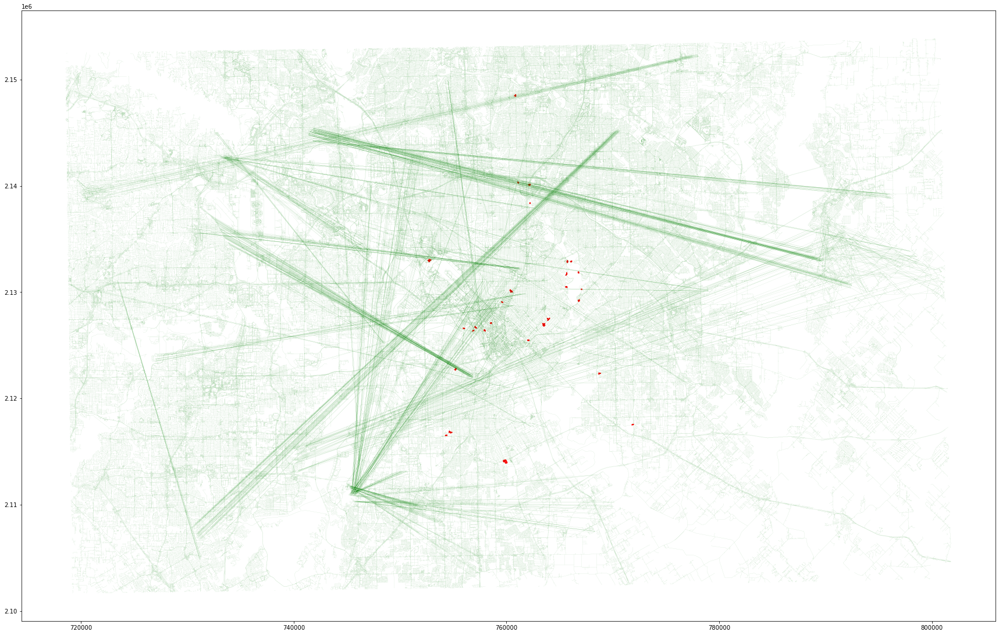

In [187]:
fig, ax = plt.subplots(figsize = (30,25)) 
gdf1.plot(ax=ax,color="red")
road_proj.plot(color="green",edgecolor='k',linewidth = 0.05,ax=ax) #Use your second dataframe

#Clip road file with buffer file

In [188]:
# Clip the data using GeoPandas clip
buffer_clip_road = gpd.clip(road_proj, gdf1)
buffer_clip_road.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
2008,9940271,None,None,secondary_link,1,0,NaN,"LINESTRING (765730.352 2132961.193, 765724.815..."
2438,9941067,None,None,secondary_link,1,0,NaN,"LINESTRING (765818.704 2132920.682, 765779.630..."
3539,9943160,None,None,residential,1,0,NaN,"LINESTRING (763564.115 2126904.745, 763557.200..."
3835,9944059,South Beacon Street,None,residential,1,0,NaN,"LINESTRING (763604.083 2126883.894, 763596.508..."
4009,9944632,None,None,secondary_link,1,0,NaN,"LINESTRING (765735.537 2132820.211, 765745.129..."


In [189]:
#ax = buffer_clip_road.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Intersect

In [190]:
 inter_road=gpd.overlay(gdf1, buffer_clip_road, how='intersection', make_valid=True, keep_geom_type=False)
 inter_road.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,buff_dist,buffer_area,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,0.1,0.015957,9980342,Kessler Court,None,service,0,0,NaN,"LINESTRING (755216.611 2122804.890, 755199.251..."
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,0.1,0.015957,9980363,North Edgefield Avenue,None,tertiary,0,0,NaN,"LINESTRING (755257.351 2122752.167, 755256.660..."
2,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,0.1,0.015957,9980366,North Edgefield Avenue,None,residential,0,0,NaN,"LINESTRING (755191.085 2122673.635, 755200.411..."
3,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,0.1,0.015957,9989287,Kessler Parkway,None,tertiary,0,0,NaN,"LINESTRING (755087.090 2122727.482, 755147.012..."
4,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,0.1,0.015957,25845814,North Edgefield Avenue,None,tertiary,0,0,NaN,"LINESTRING (755253.843 2122809.991, 755253.003..."


# Calculate the length of the road segments

In [191]:
inter_road["Length"]=inter_road["geometry"].length*3.28084 # in ft
inter_road.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,buffer_area,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry,Length
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,0.015957,9980342,Kessler Court,None,service,0,0,NaN,"LINESTRING (755216.611 2122804.890, 755199.251...",137.149154
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,0.015957,9980363,North Edgefield Avenue,None,tertiary,0,0,NaN,"LINESTRING (755257.351 2122752.167, 755256.660...",74.053951
2,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,0.015957,9980366,North Edgefield Avenue,None,residential,0,0,NaN,"LINESTRING (755191.085 2122673.635, 755200.411...",296.501113
3,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,0.015957,9989287,Kessler Parkway,None,tertiary,0,0,NaN,"LINESTRING (755087.090 2122727.482, 755147.012...",525.767925
4,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,0.015957,25845814,North Edgefield Avenue,None,tertiary,0,0,NaN,"LINESTRING (755253.843 2122809.991, 755253.003...",274.166635


# Aggregrate the road functional class

In [192]:
output_roadfc=inter_road.groupby(by=['osm_id_sensor','type'])['Length'].sum()
output_roadfc

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osm_id_sensor  type        
28545390.0     cycleway        1184.541571
               footway         1681.926109
               residential     2791.639199
               service          912.196710
97891369.0     construction     269.799025
                                  ...     
493380742.0    service         1304.854514
               tertiary        4769.419386
547170074.0    footway          455.259285
               residential     2842.042684
               service         6532.232158
Name: Length, Length: 131, dtype: float64

# Calculate the primary road

In [193]:
primary= inter_road[inter_road['type'].str.contains('primary')]
output_primary=primary.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_primary.columns=["osm_id","Primary"]
output_primary.head()

,osm_id,Primary
0,178552402.0,1700.501592
1,419107440.0,2290.633480
2,469524545.0,2095.097798


In [194]:
# Calculate secondary
secondary= inter_road[inter_road['type'].str.contains('secondary')]
output_secondary=secondary.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_secondary.columns=["osm_id","Secondary"]
output_secondary.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Secondary
0,223881880.0,174.015514
1,356309596.0,992.002565
2,444480443.0,979.750289
3,444489305.0,939.390785
4,459209227.0,1128.968931


In [195]:
# Calculate tertiary
tertiary= inter_road[inter_road['type'].str.contains('tertiary')]
output_tertiary=tertiary.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_tertiary.columns=["osm_id","Tertiary"]
output_tertiary.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Tertiary
0,178552402.0,244.505203
1,223881858.0,394.164714
2,313514317.0,2751.710288
3,356118935.0,393.805448
4,356309596.0,2041.962508


In [196]:
# Calculate residential
residential= inter_road[inter_road['type'].str.contains('residential')]
output_residential= residential.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_residential.columns=["osm_id","Residential_Road"]
output_residential.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Residential_Road
0,28545390.0,2791.639199
1,97891369.0,1411.084107
2,170833583.0,806.885918
3,178552402.0,376.307166
4,223881858.0,596.980987


In [197]:
# Calculate path
path= inter_road[inter_road['type'].str.contains('path')]
output_path= path.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_path.columns=["osm_id","Path"]
output_path.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Path
0,170833583.0,1132.411441
1,223881880.0,153.452616
2,356309596.0,788.268234
3,373275516.0,199.967416
4,444480443.0,2223.171166


In [198]:
# calculate cycleway
# Calculate path
cycleway = inter_road[inter_road['type'].str.contains('cycleway')]
output_cycleway = cycleway .groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_cycleway.columns=["osm_id","Cycleway"] 
output_cycleway.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Cycleway
0,28545390.0,1184.541571
1,97891369.0,414.338939
2,170833583.0,226.526553
3,223881858.0,1990.354565
4,223881880.0,665.558788


In [199]:
# Calculate footway
footway = inter_road[inter_road['type'].str.contains('footway')]
output_footway = footway .groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_footway.columns=["osm_id","Footway"] 
output_footway.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Footway
0,28545390.0,1681.926109
1,170833583.0,2038.559713
2,178552402.0,919.583411
3,223881858.0,1080.870483
4,223881880.0,2159.984937


# Calculcate the mean Speed

In [200]:
# Exclude NAN and zero value first then take the mean
inter_road.maxspeed.describe()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


count    30.000000
mean     49.000000
std      16.629844
min      20.000000
25%      40.000000
50%      42.500000
75%      65.000000
max      70.000000
Name: maxspeed, dtype: float64

In [201]:
# Consider rows without NAN
inter_road1 = inter_road[inter_road['maxspeed'].notna()]
inter_road1.head(5) 

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,buffer_area,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry,Length
5,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,0.015957,28214003,None,TX 360,motorway,1,1,65.0,"LINESTRING (755203.819 2122870.654, 755314.249...",425.056970
8,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,0.015957,28214093,None,None,motorway_link,1,0,65.0,"LINESTRING (755215.005 2122880.031, 755313.374...",371.038434
11,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,0.015957,122733021,None,TX 360,motorway,1,0,65.0,"LINESTRING (755313.404 2122823.381, 755214.184...",373.837854
18,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,0.015957,503308230,None,TX 360,motorway,1,0,65.0,"LINESTRING (755202.517 2122869.336, 755314.030...",418.332064
19,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,0.015957,503308233,None,TX 360,motorway,1,0,65.0,"LINESTRING (755314.835 2122790.591, 755191.455...",462.558803


In [202]:
road_proj_type11=inter_road1 [inter_road1 ['type']=='primary']                          
road_proj_type22=inter_road1 [inter_road1 ['type']=='secondary']
road_proj_type33=inter_road1[inter_road1 ['type']=='tertiary']
road_proj_type44=inter_road1 [inter_road1 ['type']=='residential']
road_proj_type55=inter_road1 [inter_road1 ['type']=='path']
road_proj_type66=inter_road1 [inter_road1 ['type']=='cycleway']
road_proj_type77=inter_road1 [inter_road1 ['type']=='footway']
road_proj_types=pd.concat([road_proj_type11,road_proj_type22,road_proj_type33,road_proj_type44,road_proj_type55,road_proj_type66,road_proj_type77],axis=0).reset_index()
road_proj_types.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,index,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,...,buffer_area,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry,Length
0,534,P028DAL,White Rock Lake Trail at Garland,permanent,2019,Dallas,3.0,1134.694417,218.547945,17.876712,...,0.014634,9977332,Garland Road,TX 78,primary,1,0,40.0,"LINESTRING (766765.807 2129088.026, 766798.496...",849.750949
1,537,P028DAL,White Rock Lake Trail at Garland,permanent,2019,Dallas,3.0,1134.694417,218.547945,17.876712,...,0.014634,91362476,Garland Road,TX 78,primary,1,0,40.0,"LINESTRING (766895.571 2129314.006, 766868.987...",850.750644
2,97,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,...,0.014490,9979342,East Warrior Trail,None,secondary,0,0,35.0,"MULTILINESTRING ((768633.402 2122375.009, 7688...",1441.354148
3,348,P020DAL,Trinity strand Trail at Hi Line Dr,permanent,2019,Dallas,3.0,15.883333,5.835616,1.123288,...,0.015569,10009016,Oak Lawn Avenue,None,secondary,0,0,30.0,"MULTILINESTRING ((757055.204 2126828.453, 7570...",979.750289
4,500,P025DAL,White Rock Creek Trail at Mockingbird,permanent,2019,Dallas,3.0,779.527381,183.671233,15.945205,...,0.014888,191039268,East Mockingbird Lane,None,secondary,1,1,40.0,"LINESTRING (765788.954 2132889.983, 765741.752...",470.346734


In [203]:
# Then remove the rows with zero speed
inter_road2 = road_proj_types[road_proj_types.maxspeed != 0]
inter_road2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,index,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,...,buffer_area,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry,Length
0,534,P028DAL,White Rock Lake Trail at Garland,permanent,2019,Dallas,3.0,1134.694417,218.547945,17.876712,...,0.014634,9977332,Garland Road,TX 78,primary,1,0,40.0,"LINESTRING (766765.807 2129088.026, 766798.496...",849.750949
1,537,P028DAL,White Rock Lake Trail at Garland,permanent,2019,Dallas,3.0,1134.694417,218.547945,17.876712,...,0.014634,91362476,Garland Road,TX 78,primary,1,0,40.0,"LINESTRING (766895.571 2129314.006, 766868.987...",850.750644
2,97,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,...,0.014490,9979342,East Warrior Trail,None,secondary,0,0,35.0,"MULTILINESTRING ((768633.402 2122375.009, 7688...",1441.354148
3,348,P020DAL,Trinity strand Trail at Hi Line Dr,permanent,2019,Dallas,3.0,15.883333,5.835616,1.123288,...,0.015569,10009016,Oak Lawn Avenue,None,secondary,0,0,30.0,"MULTILINESTRING ((757055.204 2126828.453, 7570...",979.750289
4,500,P025DAL,White Rock Creek Trail at Mockingbird,permanent,2019,Dallas,3.0,779.527381,183.671233,15.945205,...,0.014888,191039268,East Mockingbird Lane,None,secondary,1,1,40.0,"LINESTRING (765788.954 2132889.983, 765741.752...",470.346734


In [204]:
# Now calculate the mean speed for each count location
output_meanspeed=inter_road2.groupby(by=['osm_id_sensor'])['maxspeed'].agg(pd.Series.mode).reset_index() # revised
output_meanspeed.columns=['osm_id','maxspeed']
output_meanspeed.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,maxspeed
0,178552402.0,40.0
1,444480443.0,30.0
2,459188596.0,25.0
3,459209227.0,40.0
4,472409339.0,35.0


# Calculate the point speed of the link over which count location exist, 
# Intersect or within or overlap function does not work for sjoin unless the count location exactly over the link, in that case zero results willl be produced. To avoid zero output, nearest link from count station has been claculated like ARcGIS spatial GISJOIN.

In [205]:
def min_distance_pline(point, line):
    return line.distance(point).min()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [206]:
ecoshort.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,32.70787,-96.70881,NaN,496723098.0,2.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1
7,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,32.76284,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,2.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2
14,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,32.91885,-96.76442,NaN,493380742.0,2.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1
21,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,32.71307,-96.66779,NaN,461234382.0,2.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4
28,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,32.75781,-96.70038,NaN,472409339.0,2.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3


In [207]:
road_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,4342988,Sam Rayburn Tollway,SRT,motorway,1,0,70.0,"LINESTRING (740413.460 2147555.694, 740130.526..."
1,4343083,Sam Rayburn Tollway,SRT,motorway,1,0,70.0,"LINESTRING (739609.545 2147800.222, 739642.442..."
2,4343084,Sam Rayburn Tollway,SRT,motorway,1,1,70.0,"LINESTRING (740838.215 2147359.506, 740806.022..."
3,4343087,None,None,motorway_link,1,0,NaN,"LINESTRING (740286.517 2147553.170, 740354.837..."
4,4343088,None,None,motorway_link,1,0,NaN,"LINESTRING (740485.951 2147533.420, 740428.081..."


In [208]:
print(road_proj.crs)
print(ecoshort.crs)

epsg:2845
epsg:2845


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [209]:
road_proj_type1=road_proj[road_proj['type']=='primary']                          
road_proj_type2=road_proj[road_proj['type']=='secondary']
road_proj_type3=road_proj[road_proj['type']=='tertiary']
road_proj_type4=road_proj[road_proj['type']=='residential']
road_proj_type5=road_proj[road_proj['type']=='path']
road_proj_type6=road_proj[road_proj['type']=='cycleway']
road_proj_type7=road_proj[road_proj['type']=='footway']
road_proj_type=pd.concat([road_proj_type1,road_proj_type2,road_proj_type3,road_proj_type4,road_proj_type5,road_proj_type6,road_proj_type7],axis=0).reset_index()
road_proj_type.head(5)

,index,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,57,5959308,Texan Trail,TX 26,primary,1,0,NaN,"LINESTRING (734601.175 2140339.510, 734601.195..."
1,334,9937281,North Griffin Street,None,primary,1,0,NaN,"LINESTRING (758929.397 2124893.034, 758928.000..."
2,523,9937606,Harry Hines Boulevard,None,primary,1,0,NaN,"LINESTRING (749647.644 2139485.380, 749663.401..."
3,534,9937629,East R L Thornton Freeway,None,primary,1,0,NaN,"LINESTRING (769618.398 2126708.429, 769667.385..."
4,640,9937823,Dallas-Fort Worth Turnpike,None,primary,1,0,NaN,"LINESTRING (741012.542 2122045.087, 741051.936..."


# In the below pline distance, you can see counter is located little far away from the link

In [210]:
#ecoshort['min_distance_pline'] = ecoshort.geometry.apply(min_distance_pline, args=(road_proj,))*3.28084
#ecoshort

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [211]:
#ecoshort.min_distance_pline.plot(xlabel="Index of Count ID",ylabel="Distance from count station to nearest link in ft")

# we need consider nearest distance link

# Remove the NAN and Zero speed link first from road shape file

In [212]:
road_proj1=road_proj_type[road_proj_type['maxspeed'].notna()]
road_proj2=road_proj1[road_proj1.maxspeed != 0]

In [213]:
#https://gis.stackexchange.com/questions/323884/performing-sjoin-on-polygons-and-lines-without-intersection-using-geopandas
def nearest_linestring(point, df_lines):
    idx = df_lines.geometry.distance(point).idxmin()
    return df_lines.loc[idx, 'maxspeed']

ecoshort['maxspeed'] = ecoshort.geometry.apply(nearest_linestring, df_lines=road_proj2)
ecoshort
ecoshort_speed=ecoshort.copy()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [214]:
# Now merged with road shape file
#pt_speed=pd.merge(ecoshort_speed, road_proj2, right_on='osm_id', left_on='osm_id',how='inner')
pt_speed=ecoshort_speed
pt_speed.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,-96.70881,NaN,496723098.0,2.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1,30.0
7,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,2.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0
14,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,-96.76442,NaN,493380742.0,2.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1,30.0
21,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,-96.66779,NaN,461234382.0,2.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4,35.0
28,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,-96.70038,NaN,472409339.0,2.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3,35.0


In [215]:
# Now merged with road shape file based on OSM ID
pt_speed_v1=pd.merge(ecoshort, road_proj2, right_on='osm_id', left_on='osm_id_sensor',how='inner')
pt_speed_v1

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,maxspeed_x,index,osm_id,name,ref,type,oneway,bridge,maxspeed_y,geometry_y


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

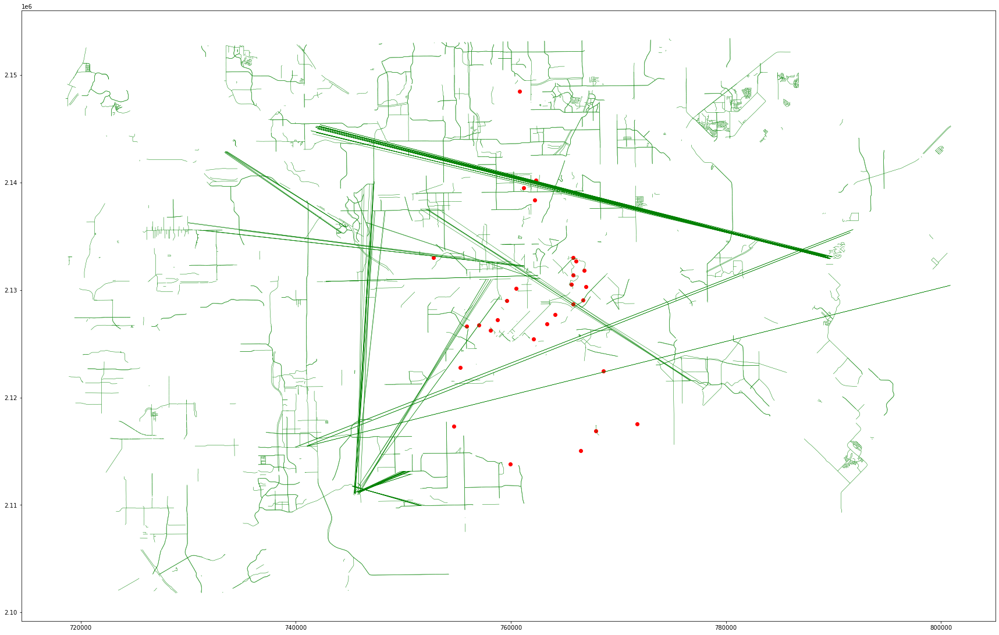

In [216]:
fig, ax = plt.subplots(figsize = (30,25)) 
ecoshort.plot(ax=ax,color="red")
road_proj2.plot(color="green",edgecolor='k',linewidth = 0.5,ax=ax) #Use your second dataframe

In [217]:
# Now calculate the mean speed for each count location
output_pointspeed=pt_speed.groupby(by=['osm_id_sensor'])['maxspeed'].mean().reset_index()
output_pointspeed

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,maxspeed
0,28545390.0,30.0
1,97891369.0,30.0
2,144869316.0,40.0
3,170833583.0,35.0
4,178552402.0,40.0
5,223881858.0,30.0
6,223881880.0,35.0
7,313514317.0,30.0
8,356118935.0,40.0
9,356309596.0,30.0


In [218]:
output_pointspeed.columns=["osm_id","Point Speed"]
output_pointspeed

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Point Speed
0,28545390.0,30.0
1,97891369.0,30.0
2,144869316.0,40.0
3,170833583.0,35.0
4,178552402.0,40.0
5,223881858.0,30.0
6,223881880.0,35.0
7,313514317.0,30.0
8,356118935.0,40.0
9,356309596.0,30.0


In [219]:
pt_speed_v1.columns

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['site_id', 'site_name', 'sensor_type', 'year', 'region',
       'travel_pattern', 'AADBT', 'stv_adb', 'stv_c_adb', 'stl_raw',
       'latitude', 'longitude', 'comment', 'osm_id_sensor', 'buff_dist',
       'geometry_x', 'min_dist_to_school', 'min_dist_to_college',
       'min_dist_to_university', 'lanes', 'maxspeed_x', 'index', 'osm_id',
       'name', 'ref', 'type', 'oneway', 'bridge', 'maxspeed_y', 'geometry_y'],
      dtype='object')

In [220]:
# Now calculate the mean speed for each count location
output_pointspeed_v2=pt_speed_v1.groupby(by=['osm_id_sensor'])['maxspeed_x'].mean().reset_index()
output_pointspeed_v2.columns=['osm_id','maxspeed']
output_pointspeed_v2

,osm_id,maxspeed


# Calculate the road type of the closest link of count station

In [221]:
# Keep only functional class of road that we considered in our study to create catagorical varaibale

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [222]:
road_proj_type1=road_proj[road_proj['type']=='primary']                          
road_proj_type2=road_proj[road_proj['type']=='secondary']
road_proj_type3=road_proj[road_proj['type']=='tertiary']
road_proj_type4=road_proj[road_proj['type']=='residential']
road_proj_type5=road_proj[road_proj['type']=='path']
road_proj_type6=road_proj[road_proj['type']=='cycleway']
road_proj_type7=road_proj[road_proj['type']=='footway']
road_proj_type=pd.concat([road_proj_type1,road_proj_type2,road_proj_type3,road_proj_type4,road_proj_type5,road_proj_type6,road_proj_type7],axis=0).reset_index()
road_proj_type.head(5)

,index,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,57,5959308,Texan Trail,TX 26,primary,1,0,NaN,"LINESTRING (734601.175 2140339.510, 734601.195..."
1,334,9937281,North Griffin Street,None,primary,1,0,NaN,"LINESTRING (758929.397 2124893.034, 758928.000..."
2,523,9937606,Harry Hines Boulevard,None,primary,1,0,NaN,"LINESTRING (749647.644 2139485.380, 749663.401..."
3,534,9937629,East R L Thornton Freeway,None,primary,1,0,NaN,"LINESTRING (769618.398 2126708.429, 769667.385..."
4,640,9937823,Dallas-Fort Worth Turnpike,None,primary,1,0,NaN,"LINESTRING (741012.542 2122045.087, 741051.936..."


In [223]:
#def nearest_linestring(point, df_lines):
#    idx = df_lines.geometry.distance(point).idxmin()
#    return df_lines.loc[idx, 'type']

#ecoshort['type'] = ecoshort.geometry.apply(nearest_linestring, df_lines=road_proj_type)
#ecoshort
#ecoshort_rt=ecoshort.copy()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [224]:
# Now merged with road shape file
#road_merged_inner=pd.merge(ecoshort_speed, road_proj_type, right_on='osm_id', left_on='osm_id',how='inner')
#ecoshort_rt

In [225]:
road_merged_inner = pd.merge(left=road_proj_type, right=ecoshort, left_on='osm_id', right_on='osm_id_sensor',how='inner')
road_merged_inner.head()

,index,osm_id,name,ref,type,oneway,bridge,maxspeed_x,geometry_x,site_id,...,longitude,comment,osm_id_sensor,buff_dist,geometry_y,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed_y
0,90760,419107440,West Northwest Highway,Loop 12,primary,1,0,NaN,"LINESTRING (753148.004 2133160.291, 753120.953...",P023DAL,...,-96.86743,strava-osm divided 1676157 (as primary) & 1194253,419107440.0,2.0,POINT (752792.765 2132993.353),2047.986092,11749.756249,14874.402141,3,35.0
1,107293,492413557,East Lawther Drive,None,tertiary,0,0,NaN,"LINESTRING (767720.304 2131470.625, 767697.870...",P031DAL,...,-96.71805,Sidewalk + bike lane,492413557.0,2.0,POINT (766796.078 2131801.387),2938.260248,18449.755665,19810.486171,2,20.0
2,82760,356309596,None,None,path,0,0,NaN,"LINESTRING (754571.892 2122470.501, 754588.555...",P002DAL,...,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,2.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0
3,99554,444480443,Trinity Strand Trail,None,path,0,0,NaN,"LINESTRING (756963.689 2126459.131, 756956.659...",P020DAL,...,-96.82301,NaN,444480443.0,2.0,POINT (757050.698 2126732.368),3954.639809,8655.926310,7572.166900,3,30.0
4,99558,444489305,Trinity Strand Trail,None,path,0,0,NaN,"LINESTRING (755943.260 2126602.934, 755935.830...",P022DAL,...,-96.83536,NaN,444489305.0,2.0,POINT (755895.496 2126633.035),4714.556238,11277.126535,5573.834690,3,40.0


In [226]:
# First identify the closest link from count station
#https://gis.stackexchange.com/questions/323884/performing-sjoin-on-polygons-and-lines-without-intersection-using-geopandas
#def nearest_linestring(point, df_lines):
#    idx = df_lines.geometry.distance(point).idxmin()
#    return df_lines.loc[idx, 'osm_id']

#ecoshort['osm_id'] = ecoshort.geometry.apply(nearest_linestring, df_lines=road_proj_type)
#ecoshort


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [227]:
# Now merge with road shape file with OSM ID
#closest_road_type=pd.merge(ecoshort, road_proj_type, right_on='osm_id', left_on='osm_id',how='inner')
#closest_road_type
road_merged_inner.columns


Index(['index', 'osm_id', 'name', 'ref', 'type', 'oneway', 'bridge',
       'maxspeed_x', 'geometry_x', 'site_id', 'site_name', 'sensor_type',
       'year', 'region', 'travel_pattern', 'AADBT', 'stv_adb', 'stv_c_adb',
       'stl_raw', 'latitude', 'longitude', 'comment', 'osm_id_sensor',
       'buff_dist', 'geometry_y', 'min_dist_to_school', 'min_dist_to_college',
       'min_dist_to_university', 'lanes', 'maxspeed_y'],
      dtype='object')

In [228]:
pt_road_type1=road_merged_inner.loc[:,['osm_id_sensor','type']]
pt_road_type1.columns=['osm_id','road_type']
pt_road_type1.head()

,osm_id,road_type
0,419107440.0,primary
1,492413557.0,tertiary
2,356309596.0,path
3,444480443.0,path
4,444489305.0,path


# Convert this road catagory to binary as follows- 0 and 1

In [229]:
import numpy as np
pt_road_type1['primary_binary'] = np.where(pt_road_type1['road_type'] == 'primary', 1, 0)
pt_road_type1['secondary_binary'] = np.where(pt_road_type1['road_type'] == 'secondary', 1, 0)
pt_road_type1['tertiary_binary'] = np.where(pt_road_type1['road_type'] == 'tertiary', 1, 0)
pt_road_type1['residential_binary'] = np.where(pt_road_type1['road_type'] == 'residential', 1, 0)
pt_road_type1['path_binary'] = np.where(pt_road_type1['road_type'] == 'path', 1, 0)
pt_road_type1['cycleway_binary'] = np.where(pt_road_type1['road_type'] == 'cycleway', 1, 0)
pt_road_type1['footway_binary'] = np.where(pt_road_type1['road_type'] == 'footway', 1, 0)
pt_road_type1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,road_type,primary_binary,secondary_binary,tertiary_binary,residential_binary,path_binary,cycleway_binary,footway_binary
0,419107440.0,primary,1,0,0,0,0,0,0
1,492413557.0,tertiary,0,0,1,0,0,0,0
2,356309596.0,path,0,0,0,0,1,0,0
3,444480443.0,path,0,0,0,0,1,0,0
4,444489305.0,path,0,0,0,0,1,0,0


In [230]:
pt_road_type2=pt_road_type1.drop(['road_type'],axis=1)
pt_road_type2=pt_road_type2.drop_duplicates(subset=['osm_id'],keep='first')
pt_road_type2.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,primary_binary,secondary_binary,tertiary_binary,residential_binary,path_binary,cycleway_binary,footway_binary
0,419107440.0,1,0,0,0,0,0,0
1,492413557.0,0,0,1,0,0,0,0
2,356309596.0,0,0,0,0,1,0,0
3,444480443.0,0,0,0,0,1,0,0
4,444489305.0,0,0,0,0,1,0,0


# Calculate the Bridges

In [231]:
bridge=inter_road.copy()
output_bridge=bridge.groupby(by=['osm_id_sensor'])['bridge'].sum().reset_index()
# Convert binary, presence of bridge=1, absence of bridge=0
output_bridge.loc[output_bridge['bridge'] > 0, 'bridge'] = 1
output_bridge.loc[output_bridge['bridge'] ==0, 'bridge'] = 2
output_bridge.columns=['osm_id','bridge']
output_bridge.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,bridge
0,28545390.0,2
1,97891369.0,1
2,170833583.0,2
3,178552402.0,1
4,223881858.0,2


# Calculate the bridge from spatial join of count location and bridge line shape file

In [232]:
bridge_only=road_proj
bridge_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,4342988,Sam Rayburn Tollway,SRT,motorway,1,0,70.0,"LINESTRING (740413.460 2147555.694, 740130.526..."
1,4343083,Sam Rayburn Tollway,SRT,motorway,1,0,70.0,"LINESTRING (739609.545 2147800.222, 739642.442..."
2,4343084,Sam Rayburn Tollway,SRT,motorway,1,1,70.0,"LINESTRING (740838.215 2147359.506, 740806.022..."
3,4343087,None,None,motorway_link,1,0,NaN,"LINESTRING (740286.517 2147553.170, 740354.837..."
4,4343088,None,None,motorway_link,1,0,NaN,"LINESTRING (740485.951 2147533.420, 740428.081..."


In [233]:
#count_station
bridge_only.columns

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['osm_id', 'name', 'ref', 'type', 'oneway', 'bridge', 'maxspeed',
       'geometry'],
      dtype='object')

In [234]:
# Join count location file with road file
pointInline_bridge =pd.merge (left=ecoshort, right=bridge_only, left_on='osm_id_sensor', right_on='osm_id',how='inner')
pointInline_bridge.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,lanes,maxspeed_x,osm_id,name,ref,type,oneway,bridge,maxspeed_y,geometry_y
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,1,30.0,496723098,Trinity Forest Trail,None,cycleway,0,0,NaN,"LINESTRING (768587.951 2115996.687, 768608.508..."
1,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,2,30.0,356309596,None,None,path,0,0,NaN,"LINESTRING (754571.892 2122470.501, 754588.555..."
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,1,30.0,493380742,Cottonwood Trail,None,footway,0,0,NaN,"LINESTRING (762445.986 2138988.431, 762445.648..."
3,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,4,35.0,461234382,Crawford Memorial Park Loop Trail,None,footway,0,0,NaN,"LINESTRING (771717.859 2118245.487, 771724.754..."
4,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,3,35.0,472409339,None,None,footway,0,0,NaN,"LINESTRING (768518.879 2122403.054, 768558.690..."


In [235]:
# Join by OSM ID
#pointInline_bridge_v2 = pd.merge(left=bridge_only, right=count_station, left_on='osm_id', right_on='OSM_ID',how='inner')
#pointInline_bridge_v2


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [236]:
output_point_bridge=pointInline_bridge.groupby(by=['osm_id_sensor'])['bridge'].sum().reset_index()
output_point_bridge.head()

,osm_id_sensor,bridge
0,28545390.0,0
1,97891369.0,0
2,144869316.0,0
3,170833583.0,0
4,178552402.0,0


In [237]:
output_point_bridge.loc[output_point_bridge['bridge'] > 0, 'bridge'] = 1
output_point_bridge.loc[output_point_bridge['bridge'] ==0, 'bridge'] = 2
output_point_bridge.columns=["osm_id","Point Bridge"]
output_point_bridge.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Point Bridge
0,28545390.0,2
1,97891369.0,2
2,144869316.0,2
3,170833583.0,2
4,178552402.0,2


# Calculate the Distance from count station to land use:Distance to water body, Distance to park,Distance to green space area,Distance to commercial,Distance to industrial area,Distance to residential area ,Distance to Retail area,Distance to Residential area



# Distance to park

In [238]:
def min_distance_ppoly(point, polygon):
    return polygon.distance(point).min()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [239]:
nature_proj1.head(5)

,osm_id,name,type,geometry
0,5687271,Richfield Park,park,"POLYGON ((719074.657 2133881.539, 719427.923 2..."
1,6091409,North Lake,water,"MULTIPOLYGON (((741291.476 2142254.186, 741262..."
2,10067542,None,water,"POLYGON ((728687.286 2146638.727, 728699.768 2..."
3,13991735,Dick Faram Park,park,"POLYGON ((721186.165 2133875.704, 721184.426 2..."
4,13992439,Northfield Park,park,"POLYGON ((721602.867 2136354.443, 721602.398 2..."


In [240]:
park_only=nature_proj1[nature_proj1['type'].str.contains('park')]
park_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
0,5687271,Richfield Park,park,"POLYGON ((719074.657 2133881.539, 719427.923 2..."
3,13991735,Dick Faram Park,park,"POLYGON ((721186.165 2133875.704, 721184.426 2..."
4,13992439,Northfield Park,park,"POLYGON ((721602.867 2136354.443, 721602.398 2..."
5,14071359,Hurst Athletic Complex,park,"POLYGON ((722985.265 2132583.173, 723029.412 2..."
14,25605587,None,park,"POLYGON ((758509.903 2125863.758, 758510.503 2..."


In [241]:
ecoshort.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,-96.70881,NaN,496723098.0,2.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1,30.0
7,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,-96.84244,Kessler Pkwy (141085) parallel might be steali...,356309596.0,2.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0
14,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,-96.76442,NaN,493380742.0,2.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1,30.0
21,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,-96.66779,NaN,461234382.0,2.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4,35.0
28,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,-96.70038,NaN,472409339.0,2.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3,35.0


In [242]:
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(park_only,))*3.28084
ecoshort.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,comment,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,496723098.0,2.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1,30.0,2865.444865
7,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,Kessler Pkwy (141085) parallel might be steali...,356309596.0,2.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0,290.275785
14,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,NaN,493380742.0,2.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1,30.0,0.000000
21,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,NaN,461234382.0,2.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4,35.0,0.000000
28,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,NaN,472409339.0,2.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3,35.0,0.000000


In [243]:
Park_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
Park_distance1.columns=["osm_id","Distance to Park"]
Park_distance1=Park_distance1.drop_duplicates(subset=['osm_id'],keep='first')
Park_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Park
0,496723098.0,2865.444865
7,356309596.0,290.275785
14,493380742.0,0.000000
21,461234382.0,0.000000
28,472409339.0,0.000000


# cc distance to park

In [244]:
parkcc=park_only.copy()
parkcc['geometry']=parkcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(parkcc,))*3.28084
parkcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
parkcc_distance1.columns=["osm_id","Distance to Park Center"]
parkcc_distance1=parkcc_distance1.drop_duplicates(subset=['osm_id'],keep='first')
parkcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Park Center
0,496723098.0,3713.110779
7,356309596.0,397.308399
14,493380742.0,501.161426
21,461234382.0,579.268452
28,472409339.0,935.413490


# Distance to water body

In [245]:
water_only=nature_proj1[nature_proj1['type'].str.contains('water')]
water_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
1,6091409,North Lake,water,"MULTIPOLYGON (((741291.476 2142254.186, 741262..."
2,10067542,None,water,"POLYGON ((728687.286 2146638.727, 728699.768 2..."
9,25494092,None,water,"POLYGON ((733993.444 2137940.887, 733990.588 2..."
10,25494093,None,water,"POLYGON ((734023.423 2137987.164, 734022.663 2..."
20,25662645,Bachman Lake,water,"POLYGON ((753700.304 2133466.871, 753760.431 2..."


In [246]:
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(water_only,))*3.28084
ecoshort.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,comment,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,496723098.0,2.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1,30.0,132.128805
7,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,Kessler Pkwy (141085) parallel might be steali...,356309596.0,2.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0,2649.234231
14,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,NaN,493380742.0,2.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1,30.0,2881.901507
21,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,NaN,461234382.0,2.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4,35.0,8566.030521
28,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,NaN,472409339.0,2.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3,35.0,2388.632421


In [247]:
water_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
water_distance1.columns=["osm_id","Distance to Water Body"]
water_distance1=water_distance1.drop_duplicates(subset=['osm_id'],keep='first')
water_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Water Body
0,496723098.0,132.128805
7,356309596.0,2649.234231
14,493380742.0,2881.901507
21,461234382.0,8566.030521
28,472409339.0,2388.632421


In [248]:
watercc=water_only.copy()
watercc['geometry']=watercc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(watercc,))*3.28084
watercc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
watercc_distance1.columns=["osm_id","Distance to Water Center"]
watercc_distance1=watercc_distance1.drop_duplicates(subset=['osm_id'],keep='first')
watercc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Water Center
0,496723098.0,389.728219
7,356309596.0,2683.078976
14,493380742.0,3029.625659
21,461234382.0,8930.111785
28,472409339.0,2497.597080


# Distance To  Forest

In [249]:
forest_only=nature_proj1[nature_proj1['type'].str.contains('forest')]
forest_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
6,25493636,None,forest,"POLYGON ((734809.814 2134910.410, 734811.176 2..."
7,25493638,None,forest,"POLYGON ((734915.952 2134907.275, 735001.187 2..."
8,25493693,None,forest,"POLYGON ((735150.525 2134692.159, 735161.491 2..."
11,25552761,None,forest,"POLYGON ((735603.438 2132951.693, 735590.487 2..."
12,25552762,None,forest,"POLYGON ((735896.820 2131620.310, 736455.180 2..."


In [250]:
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(forest_only,))*3.28084
ecoshort.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,comment,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,496723098.0,2.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1,30.0,233.848140
7,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,Kessler Pkwy (141085) parallel might be steali...,356309596.0,2.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0,5407.992048
14,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,NaN,493380742.0,2.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1,30.0,30.788199
21,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,NaN,461234382.0,2.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4,35.0,59.491484
28,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,NaN,472409339.0,2.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3,35.0,594.853292


In [251]:
forest_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
forest_distance1.columns=["osm_id","Distance to forest"]
forest_distance1=forest_distance1.drop_duplicates(subset=['osm_id'],keep='first')
forest_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to forest
0,496723098.0,233.848140
7,356309596.0,5407.992048
14,493380742.0,30.788199
21,461234382.0,59.491484
28,472409339.0,594.853292


In [252]:
forestcc=forest_only.copy()
forestcc['geometry']=forestcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(forestcc,))*3.28084
forestcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
forestcc_distance1.columns=["osm_id","Distance to Forest Center"]
forestcc_distance1=forestcc_distance1.drop_duplicates(subset=['osm_id'],keep='first')
forestcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Forest Center
0,496723098.0,2743.173277
7,356309596.0,6170.142400
14,493380742.0,357.539293
21,461234382.0,1052.731985
28,472409339.0,1264.261886


# Distance to green space area

In [253]:
grass_only=luse_proj[luse_proj['type'].str.contains('grass')]
grass_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
10,29186461,None,grass,"POLYGON ((746860.052 2116303.318, 746937.829 2..."
11,29191160,None,grass,"POLYGON ((758191.133 2124526.816, 758255.977 2..."
12,29191170,None,grass,"POLYGON ((758132.196 2124667.745, 758132.213 2..."
13,29191222,None,grass,"POLYGON ((758123.383 2124388.863, 758152.120 2..."
21,32490476,None,grass,"POLYGON ((753455.154 2120767.565, 753458.330 2..."


In [254]:
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(grass_only,))*3.28084
ecoshort.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,comment,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,496723098.0,2.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1,30.0,58.042113
7,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,Kessler Pkwy (141085) parallel might be steali...,356309596.0,2.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0,898.654405
14,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,NaN,493380742.0,2.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1,30.0,371.038587
21,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,NaN,461234382.0,2.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4,35.0,3646.932425
28,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,NaN,472409339.0,2.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3,35.0,1602.358212


In [255]:
grass_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
grass_distance1.columns=["osm_id","Distance to Grass"]
grass_distance1=grass_distance1.drop_duplicates(subset=['osm_id'],keep='first')
grass_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Grass
0,496723098.0,58.042113
7,356309596.0,898.654405
14,493380742.0,371.038587
21,461234382.0,3646.932425
28,472409339.0,1602.358212


In [256]:
grasscc=grass_only.copy()
grasscc['geometry']=grasscc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(grasscc,))*3.28084
grasscc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
grasscc_distance1.columns=["osm_id","Distance to Grass Center"]
grasscc_distance1=grasscc_distance1.drop_duplicates(subset=['osm_id'],keep='first')
grasscc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Grass Center
0,496723098.0,202.811011
7,356309596.0,921.484254
14,493380742.0,482.392579
21,461234382.0,4203.724074
28,472409339.0,1742.614556


# Distance to commercial

In [257]:
commercial_only=luse_proj[luse_proj['type'].str.contains('commercial')]
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(commercial_only,))*3.28084
commercial_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
commercial_distance1.columns=["osm_id","Distance to Commercial Area"]
commercial_distance1=commercial_distance1.drop_duplicates(subset=['osm_id'],keep='first')
commercial_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Commercial Area
0,496723098.0,8295.206494
7,356309596.0,2648.126813
14,493380742.0,777.677838
21,461234382.0,3598.210466
28,472409339.0,5450.289833


In [258]:
commercialcc=commercial_only.copy()
commercialcc['geometry']=commercialcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(commercialcc,))*3.28084
commercialcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
commercialcc_distance1.columns=["osm_id","Distance to Commercial Area Center"]
commercialcc_distance1=commercialcc_distance1.drop_duplicates(subset=['osm_id'],keep='first')
commercialcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Commercial Area Center
0,496723098.0,8769.777085
7,356309596.0,3446.389523
14,493380742.0,1197.191805
21,461234382.0,4168.030547
28,472409339.0,5540.351898


# Distance to industrial area

In [259]:
industrial_only=luse_proj[luse_proj['type'].str.contains('industrial')]
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(industrial_only,))*3.28084
industrial_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
industrial_distance1.columns=["osm_id","Distance to Industrial Area"]
industrial_distance1=industrial_distance1.drop_duplicates(subset=['osm_id'],keep='first')
industrial_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Industrial Area
0,496723098.0,1177.825126
7,356309596.0,5022.382691
14,493380742.0,2625.882273
21,461234382.0,2451.344867
28,472409339.0,6358.174558


In [260]:
industrialcc=industrial_only.copy()
industrialcc['geometry']=industrialcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(industrialcc,))*3.28084
industrialcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
industrialcc_distance1.columns=["osm_id","Distance to Industrial Center"]
industrialcc_distance1=industrialcc_distance1.drop_duplicates(subset=['osm_id'],keep='first')
industrialcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Industrial Center
0,496723098.0,1431.220601
7,356309596.0,5282.052023
14,493380742.0,5074.001595
21,461234382.0,2699.318182
28,472409339.0,6532.521450


# Distance to Retail area

In [261]:
retail_only=luse_proj[luse_proj['type'].str.contains('retail')]
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(retail_only,))*3.28084
retail_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
retail_distance1.columns=["osm_id","Distance to Retail Area"]
retail_distance1=retail_distance1.drop_duplicates(subset=['osm_id'],keep='first')
retail_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Retail Area
0,496723098.0,9840.040603
7,356309596.0,6689.962864
14,493380742.0,707.203212
21,461234382.0,6649.161902
28,472409339.0,4775.472819


In [262]:
retailcc=retail_only.copy()
retailcc['geometry']=retailcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(retailcc,))*3.28084
retailcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
retailcc_distance1.columns=["osm_id","Distance to Retail Center"]
retailcc_distance1=retailcc_distance1.drop_duplicates(subset=['osm_id'],keep='first')
retailcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Retail Center
0,496723098.0,10028.639706
7,356309596.0,7133.916094
14,493380742.0,1062.613841
21,461234382.0,7000.161032
28,472409339.0,5090.465363


# Distance to Residential

In [263]:
residential_only=luse_proj[luse_proj['type'].str.contains('residential')]
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(residential_only,))*3.28084
residential_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
residential_distance1.columns=["osm_id","Distance to Residential Area"]
residential_distance1=residential_distance1.drop_duplicates(subset=['osm_id'],keep='first')
residential_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Residential Area
0,496723098.0,369.547646
7,356309596.0,168.767603
14,493380742.0,836.134846
21,461234382.0,702.751801
28,472409339.0,136.205652


In [264]:
residentialcc=residential_only.copy()
residentialcc['geometry']=residentialcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(residentialcc,))*3.28084
residentialcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
residentialcc_distance1.columns=["osm_id","Distance to Residential Center"]
residentialcc_distance1=residentialcc_distance1.drop_duplicates(subset=['osm_id'],keep='first')
residentialcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Residential Center
0,496723098.0,1416.286315
7,356309596.0,966.507266
14,493380742.0,1842.555130
21,461234382.0,803.735072
28,472409339.0,218.202498


# Import the OSM Building file and use Portland City Hall as the CBD, then calculate the distance from CBD

In [265]:
building1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
0,9940535,None,None,"POLYGON ((-96.55965 32.85357, -96.55965 32.853..."
1,9950509,None,industrial,"POLYGON ((-96.98419 33.02686, -96.98437 33.026..."
2,13990575,North Richland Hills Library,library,"POLYGON ((-97.19288 32.85488, -97.19278 32.854..."
3,25312698,American Airlines Center,commercial,"POLYGON ((-96.81024 32.79138, -96.80997 32.791..."
4,25470104,None,garage,"POLYGON ((-97.03883 32.89944, -97.03839 32.899..."


In [266]:
# Reproject the geometries by replacing the values with projected ones
bld_proj = building1.to_crs(epsg=2845)
bld_proj.head(10)
bld_proj1=bld_proj.loc[(bld_proj.name=='Dallas City Hall')]
bld_proj1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
217,27129838,Dallas City Hall,civic,"POLYGON ((759612.242 2124327.140, 759596.565 2..."


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

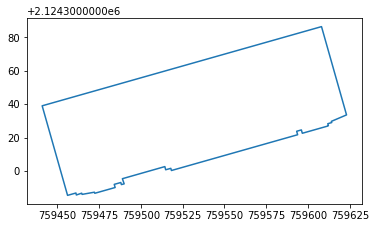

In [267]:
bld_proj1.geometry.boundary.plot()

In [268]:
# copy GeoDataFrame
bld_proj2 = bld_proj1.copy()
# change geometry 
bld_proj2['geometry'] = bld_proj2['geometry'].centroid
bld_proj2

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
217,27129838,Dallas City Hall,civic,POINT (759532.530 2124335.210)


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

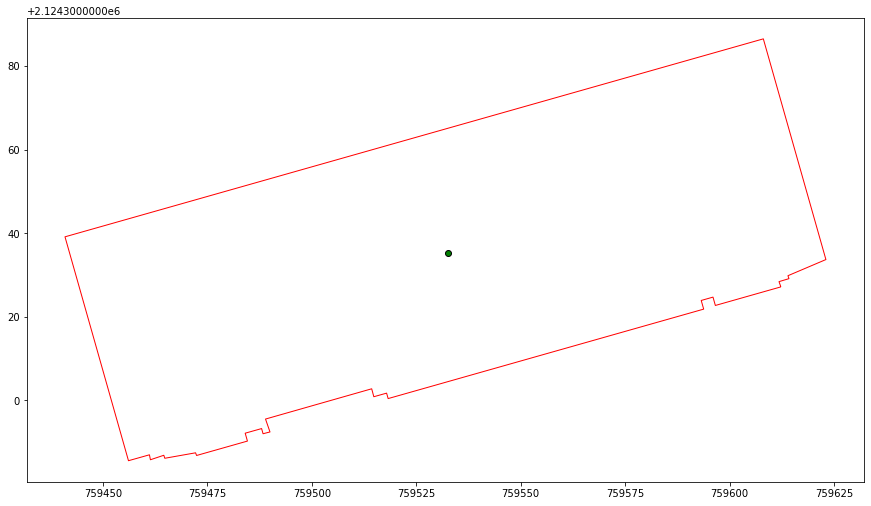

In [269]:
fig, ax = plt.subplots(figsize = (15,10)) 
bld_proj2.plot(ax=ax,color="green",edgecolor='k')
bld_proj1.geometry.boundary.plot(color="red",edgecolor='k',linewidth = 1,ax=ax) #Use your second dataframe

In [270]:
# Calculate the distance from CBD to all count locations
ecoshort['min_dist_to_CBD'] = ecoshort.geometry.apply(min_distance_ppoly, args=(bld_proj2,))*3.28084
ecoshort.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon,min_dist_to_CBD
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,496723098.0,2.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1,30.0,1416.286315,36782.751742
7,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,356309596.0,2.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0,966.507266,14815.512107
14,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,493380742.0,2.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1,30.0,1842.555130,52828.936547
21,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,461234382.0,2.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4,35.0,803.735072,45877.867288
28,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,472409339.0,2.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3,35.0,218.202498,30425.587446


In [271]:
CBD_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_CBD']]
CBD_distance1.columns=["osm_id","Distance to CBD"]

CBD_distance1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to CBD
0,496723098.0,36782.751742
7,356309596.0,14815.512107
14,493380742.0,52828.936547
21,461234382.0,45877.867288
28,472409339.0,30425.587446


# End of Distance calculation

# Now write coding for socio-demographic variable extraction

1. Population density
2. Employment density
3. Household Density
4. Number of students (student access)
5. Median age
6. Percentage of female
7. Percentage of male
8. Percentage of African American population
9. Percentage of white population
10. Median Household Income
11. Education (% of population having at least college education)

In [779]:
# Read the Block group 
#bg=gpd.read_file("../input/oregon-sd-data/OR_blck_grp_2017.shp")
bg.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,Shape_Area,geometry,wktcolumn
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,134009.0,+32.0605626,-095.4960702,21507.629535,1.521346e+07,"POLYGON ((50399.526 -607563.809, 50320.786 -60...",POLYGON ((50399.526299998164 -607563.808500000...
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,5866624.0,+31.9532088,-095.4932299,91952.048794,2.340889e+08,"POLYGON ((53916.253 -605431.909, 53967.236 -60...","POLYGON ((53916.25329999998 -605431.909, 53967..."
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,1863680.0,+31.9800959,-095.6230974,78877.041446,2.418686e+08,"POLYGON ((44426.240 -607223.004, 44421.949 -60...",POLYGON ((44426.23999999836 -607223.0040999996...
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,296734.0,+31.7346372,-095.8157096,24234.376576,1.684673e+07,"POLYGON ((17420.769 -641639.860, 17426.775 -64...",POLYGON ((17420.769400000572 -641639.859699999...
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,2627857.0,+31.8000515,-095.9131097,60528.213234,7.509989e+07,"POLYGON ((9903.482 -632316.102, 9938.024 -6323...",POLYGON ((9903.482400000095 -632316.1017000005...


In [780]:
bg.shape

(15799, 17)

In [781]:
print(bg.crs)

PROJCS["USA_Contiguous_Albers_Equal_Area_Conic",GEOGCS["NAD83",DATUM["North_American_Datum_1983",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6269"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4269"]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",37.5],PARAMETER["longitude_of_center",-96],PARAMETER["standard_parallel_1",29.5],PARAMETER["standard_parallel_2",45.5],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["ESRI","102003"]]


In [782]:
from geopandas import GeoDataFrame
from shapely.geometry import Point
import shapely.wkt
bg["wktcolumn"]= bg.apply(lambda row:row['geometry'].wkt, axis=1)
bg
geometry = bg['wktcolumn'].map(shapely.wkt.loads)
bg1 = bg.drop('wktcolumn', axis=1)
bg2 = gpd.GeoDataFrame(bg1, crs='esri:102003', geometry=geometry)
bg2.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,Shape_Area,geometry
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,134009.0,+32.0605626,-095.4960702,21507.629535,1.521346e+07,"POLYGON ((50399.526 -607563.809, 50320.786 -60..."
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,5866624.0,+31.9532088,-095.4932299,91952.048794,2.340889e+08,"POLYGON ((53916.253 -605431.909, 53967.236 -60..."
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,1863680.0,+31.9800959,-095.6230974,78877.041446,2.418686e+08,"POLYGON ((44426.240 -607223.004, 44421.949 -60..."
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,296734.0,+31.7346372,-095.8157096,24234.376576,1.684673e+07,"POLYGON ((17420.769 -641639.860, 17426.775 -64..."
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,2627857.0,+31.8000515,-095.9131097,60528.213234,7.509989e+07,"POLYGON ((9903.482 -632316.102, 9938.024 -6323..."


In [783]:
# set the co-ordinate system first
#bg2 = bg.set_crs("EPSG:102003")

#bg2 = gpd.GeoSeries(bg['geometry'], crs={'init': 'epsg:102003'})

# Let's take a copy of our layer
bg_proj = bg2.copy()

# Reproject the geometries by replacing the values with projected ones
bg_proj = bg_proj.to_crs('epsg:2845')
bg_proj.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,Shape_Area,geometry
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,134009.0,+32.0605626,-095.4960702,21507.629535,1.521346e+07,"POLYGON ((886676.701 2048371.497, 886597.614 2..."
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,5866624.0,+31.9532088,-095.4932299,91952.048794,2.340889e+08,"POLYGON ((890160.632 2050574.764, 890213.170 2..."
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,1863680.0,+31.9800959,-095.6230974,78877.041446,2.418686e+08,"POLYGON ((880667.779 2048570.454, 880663.612 2..."
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,296734.0,+31.7346372,-095.8157096,24234.376576,1.684673e+07,"POLYGON ((854345.039 2013682.437, 854351.831 2..."
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,2627857.0,+31.8000515,-095.9131097,60528.213234,7.509989e+07,"POLYGON ((846576.043 2022784.458, 846611.902 2..."


In [784]:
bg_proj["Total block Area"]=bg_proj.area
bg_proj.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,Shape_Area,geometry,Total block Area
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,134009.0,+32.0605626,-095.4960702,21507.629535,1.521346e+07,"POLYGON ((886676.701 2048371.497, 886597.614 2...",1.521411e+07
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,5866624.0,+31.9532088,-095.4932299,91952.048794,2.340889e+08,"POLYGON ((890160.632 2050574.764, 890213.170 2...",2.341138e+08
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,1863680.0,+31.9800959,-095.6230974,78877.041446,2.418686e+08,"POLYGON ((880667.779 2048570.454, 880663.612 2...",2.418926e+08
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,296734.0,+31.7346372,-095.8157096,24234.376576,1.684673e+07,"POLYGON ((854345.039 2013682.437, 854351.831 2...",1.685126e+07
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,2627857.0,+31.8000515,-095.9131097,60528.213234,7.509989e+07,"POLYGON ((846576.043 2022784.458, 846611.902 2...",7.511659e+07


In [785]:
#race=pd.read_csv("../input/oregon-sd-data/race.csv")
race.head(5)

,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,ALUCM001,ALUCM002,ALUCM003,ALUCM004,ALUCM005,ALUCM006,ALUCM007,ALUCM008,ALUCM009,ALUCM010
0,G48000109501001,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,296,291,75,13,27,14,14,51,14,51
1,G48000109501002,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,419,421,16,14,14,14,96,42,14,42
2,G48000109501003,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,365,338,105,20,14,14,14,29,14,29
3,G48000109504011,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,235,212,176,21,14,14,20,33,14,33
4,G48000109504021,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,398,348,313,21,14,16,19,19,19,19


In [786]:
race1=pd.merge(bg_proj, race, left_on='GISJOIN', right_on='GISJOIN', how='left')
race1.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALUCM001,ALUCM002,ALUCM003,ALUCM004,ALUCM005,ALUCM006,ALUCM007,ALUCM008,ALUCM009,ALUCM010
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,...,296,291,75,13,27,14,14,51,14,51
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,...,419,421,16,14,14,14,96,42,14,42
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,...,365,338,105,20,14,14,14,29,14,29
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,...,235,212,176,21,14,14,20,33,14,33
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,...,398,348,313,21,14,16,19,19,19,19


In [612]:
race2=race1[['INTPTLAT','INTPTLON','GISJOIN','Shape_Leng','Shape_Area','geometry','ALUCE001','ALUCE002','ALUCE003','Total block Area']]
race2.head(5)

,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,geometry,ALUCE001,ALUCE002,ALUCE003,Total block Area
0,+32.0605626,-095.4960702,G48000109501001,21507.629535,1.521346e+07,"POLYGON ((886676.701 2048371.497, 886597.614 2...",1296,1074,119,1.521411e+07
1,+31.9532088,-095.4932299,G48000109501002,91952.048794,2.340889e+08,"POLYGON ((890160.632 2050574.764, 890213.170 2...",2051,1951,15,2.341138e+08
2,+31.9800959,-095.6230974,G48000109501003,78877.041446,2.418686e+08,"POLYGON ((880667.779 2048570.454, 880663.612 2...",1497,1316,150,2.418926e+08
3,+31.7346372,-095.8157096,G48000109504011,24234.376576,1.684673e+07,"POLYGON ((854345.039 2013682.437, 854351.831 2...",4838,2872,1890,1.685126e+07
4,+31.8000515,-095.9131097,G48000109504021,60528.213234,7.509989e+07,"POLYGON ((846576.043 2022784.458, 846611.902 2...",7511,4400,3063,7.511659e+07


In [613]:
#race2["Total block Area"]=race2.area
#race2

In [614]:
# Clip the data using GeoPandas clip
buffer_clip_race = gpd.clip(race2, gdf1)
buffer_clip_race.head(5)

,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,geometry,ALUCE001,ALUCE002,ALUCE003,Total block Area
3555,+32.7452063,-096.6960624,G48011300091041,3126.106091,606779.405184,"POLYGON ((769413.369 2121428.349, 769413.748 2...",1841,1315,477,606642.660993
3556,+32.7457308,-096.6874376,G48011300091042,3105.536068,581076.474726,"POLYGON ((769413.369 2121428.349, 769425.724 2...",1803,1426,335,580945.489937
3552,+32.7532506,-096.6870684,G48011300091014,3557.487784,816620.640321,"POLYGON ((769541.383 2121456.062, 769425.724 2...",2146,1713,414,816435.438598
3550,+32.7530827,-096.6984639,G48011300091012,4950.619912,988706.530072,"POLYGON ((768721.672 2122660.808, 768657.374 2...",1358,1079,216,988482.400793
3551,+32.7570631,-096.6956012,G48011300091013,2587.967446,329869.817044,"POLYGON ((769531.604 2122355.767, 769509.318 2...",1062,656,389,329794.778886


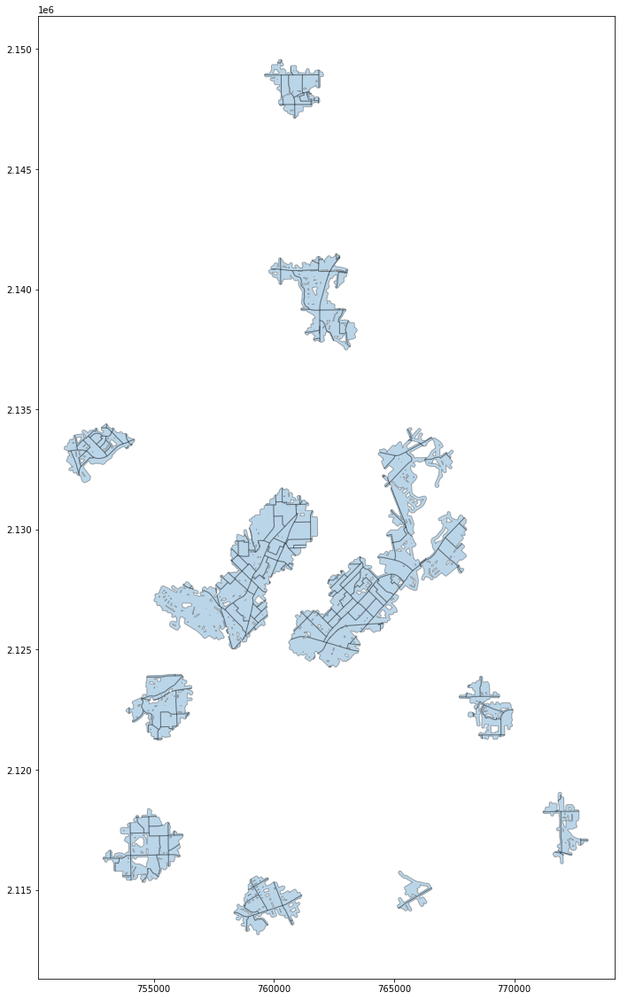

In [615]:
ax = buffer_clip_race.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [284]:
 inter_race=gpd.overlay(gdf1, buffer_clip_race, how='intersection', make_valid=True, keep_geom_type=False)
 inter_race.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,ALUCE001,ALUCE002,ALUCE003,Total block Area,geometry
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,+32.7630250,-096.8402135,G48011300044002,5722.687925,1.164112e+06,1687,1284,223,1.163845e+06,"POLYGON ((755107.565 2122679.293, 755106.670 2..."
1,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,+32.9153941,-096.7631134,G48011300078043,5734.168004,1.169604e+06,1244,371,809,1.169313e+06,"POLYGON ((762284.375 2140151.695, 762285.142 2..."
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,+32.9172555,-096.7709381,G48011300132002,5681.022979,1.488342e+06,2890,1914,546,1.487972e+06,"POLYGON ((762092.339 2140043.398, 762091.932 2..."
3,P026DAL,White Rock Creek Trail at Park Central,permanent,2019,Dallas,3.0,237.269643,37.000000,6.369863,536.0,...,+32.9172555,-096.7709381,G48011300132002,5681.022979,1.488342e+06,2890,1914,546,1.487972e+06,"POLYGON ((761182.635 2140263.301, 761182.119 2..."
4,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,+32.7119955,-096.6620633,G48011300117012,5249.553963,1.456378e+06,2453,1502,679,1.456060e+06,"POLYGON ((771937.390 2117617.977, 771943.261 2..."


In [285]:
inter_race["buffered area"]=inter_race.area
inter_race['area factor']=inter_race['buffered area']/inter_race["Total block Area"]
inter_race.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,GISJOIN,Shape_Leng,Shape_Area,ALUCE001,ALUCE002,ALUCE003,Total block Area,geometry,buffered area,area factor
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,G48011300044002,5722.687925,1.164112e+06,1687,1284,223,1.163845e+06,"POLYGON ((755107.565 2122679.293, 755106.670 2...",41328.809377,0.035511
1,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,G48011300078043,5734.168004,1.169604e+06,1244,371,809,1.169313e+06,"POLYGON ((762284.375 2140151.695, 762285.142 2...",32341.334094,0.027658
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,G48011300132002,5681.022979,1.488342e+06,2890,1914,546,1.487972e+06,"POLYGON ((762092.339 2140043.398, 762091.932 2...",9962.575953,0.006695
3,P026DAL,White Rock Creek Trail at Park Central,permanent,2019,Dallas,3.0,237.269643,37.000000,6.369863,536.0,...,G48011300132002,5681.022979,1.488342e+06,2890,1914,546,1.487972e+06,"POLYGON ((761182.635 2140263.301, 761182.119 2...",7262.469837,0.004881
4,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,G48011300117012,5249.553963,1.456378e+06,2453,1502,679,1.456060e+06,"POLYGON ((771937.390 2117617.977, 771943.261 2...",5740.642865,0.003943


In [286]:
output_pct_race= inter_race.loc[:, ['osm_id_sensor', 'ALUCE001','ALUCE002','ALUCE003','area factor']]
output_pct_race.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALUCE001,ALUCE002,ALUCE003,area factor
0,356309596.0,1687,1284,223,0.035511
1,493380742.0,1244,371,809,0.027658
2,493380742.0,2890,1914,546,0.006695
3,492447672.0,2890,1914,546,0.004881
4,461234382.0,2453,1502,679,0.003943


In [287]:
output_pct_race.iloc[:, 1:4] = output_pct_race.iloc[:, 1:4].mul(output_pct_race['area factor'],axis=0)
output_pct_race=output_pct_race.drop(['area factor'],axis=1)
output_pct_race.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALUCE001,ALUCE002,ALUCE003
0,356309596.0,59.906351,45.595587,7.918860
1,493380742.0,34.407063,10.261270,22.375654
2,493380742.0,19.349721,12.815006,3.655691
3,492447672.0,14.105465,9.341820,2.664908
4,461234382.0,9.671168,5.921767,2.677017


# Aggregate by ID

In [288]:
output_pct_race=output_pct_race.groupby('osm_id_sensor', as_index=False).sum()
output_pct_race.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALUCE001,ALUCE002,ALUCE003
0,28545390.0,209.531040,186.288609,2.681517
1,97891369.0,29.093376,23.254758,1.955035
2,170833583.0,192.730198,144.853997,28.835227
3,178552402.0,34.146805,28.828846,2.330415
4,223881858.0,55.968432,47.341359,0.543421


# Percentange of White and African American

In [289]:
# Calculate percentage of white and percentage of Black or African American 
output_pct_race['pct_white']=(output_pct_race['ALUCE002']/output_pct_race['ALUCE001'])*100
output_pct_race['pct_African_American']=(output_pct_race['ALUCE003']/output_pct_race['ALUCE001'])*100
output_pct_race.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALUCE001,ALUCE002,ALUCE003,pct_white,pct_African_American
0,28545390.0,209.531040,186.288609,2.681517,88.907404,1.279771
1,97891369.0,29.093376,23.254758,1.955035,79.931452,6.719864
2,170833583.0,192.730198,144.853997,28.835227,75.158952,14.961447
3,178552402.0,34.146805,28.828846,2.330415,84.426188,6.824693
4,223881858.0,55.968432,47.341359,0.543421,84.585823,0.970942


In [290]:
output_pct_race1=output_pct_race.drop(['ALUCE001','ALUCE002','ALUCE003'],axis=1)
output_pct_race1.columns=['osm_id','pct_white','pct_African_American']
output_pct_race1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,pct_white,pct_African_American
0,28545390.0,88.907404,1.279771
1,97891369.0,79.931452,6.719864
2,170833583.0,75.158952,14.961447
3,178552402.0,84.426188,6.824693
4,223881858.0,84.585823,0.970942


# Percentage of Male and Female

In [291]:
#gender=pd.read_csv("../input/oregon-sd-data/age by sex.csv")
gender.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,ALT0M040,ALT0M041,ALT0M042,ALT0M043,ALT0M044,ALT0M045,ALT0M046,ALT0M047,ALT0M048,ALT0M049
0,G48000109501001,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,22,7,13,20,14,23,31,29,20,42
1,G48000109501002,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,44,32,33,29,17,54,40,27,9,11
2,G48000109501003,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,24,59,24,15,23,28,71,25,5,14
3,G48000109504011,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,9,14,14,14,14,14,9,14,14,14
4,G48000109504021,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,19,17,19,19,19,19,19,19,19,19


In [292]:
gender1=pd.merge(bg_proj, gender, left_on='GISJOIN', right_on='GISJOIN', how='left')
gender1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALT0M040,ALT0M041,ALT0M042,ALT0M043,ALT0M044,ALT0M045,ALT0M046,ALT0M047,ALT0M048,ALT0M049
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,...,22,7,13,20,14,23,31,29,20,42
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,...,44,32,33,29,17,54,40,27,9,11
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,...,24,59,24,15,23,28,71,25,5,14
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,...,9,14,14,14,14,14,9,14,14,14
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,...,19,17,19,19,19,19,19,19,19,19


In [293]:
# Clip the data using GeoPandas clip
buffer_clip_gender = gpd.clip(gender1, gdf1)
buffer_clip_gender.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALT0M040,ALT0M041,ALT0M042,ALT0M043,ALT0M044,ALT0M045,ALT0M046,ALT0M047,ALT0M048,ALT0M049
2857,G48008500317192,48,085,031719,2,480850317192,Block Group 2,G5030,S,464162.0,...,24,23,11,14,17,30,17,34,15,14
3143,G48011300004063,48,113,000406,3,481130004063,Block Group 3,G5030,S,2039692.0,...,75,65,110,35,14,115,14,14,23,25
3147,G48011300005002,48,113,000500,2,481130005002,Block Group 2,G5030,S,936132.0,...,57,125,14,14,19,14,27,14,19,46
3161,G48011300006061,48,113,000606,1,481130006061,Block Group 1,G5030,S,649796.0,...,40,66,26,67,18,36,58,45,22,23
3166,G48011300007021,48,113,000702,1,481130007021,Block Group 1,G5030,S,357428.0,...,101,14,28,36,14,14,107,14,125,79


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


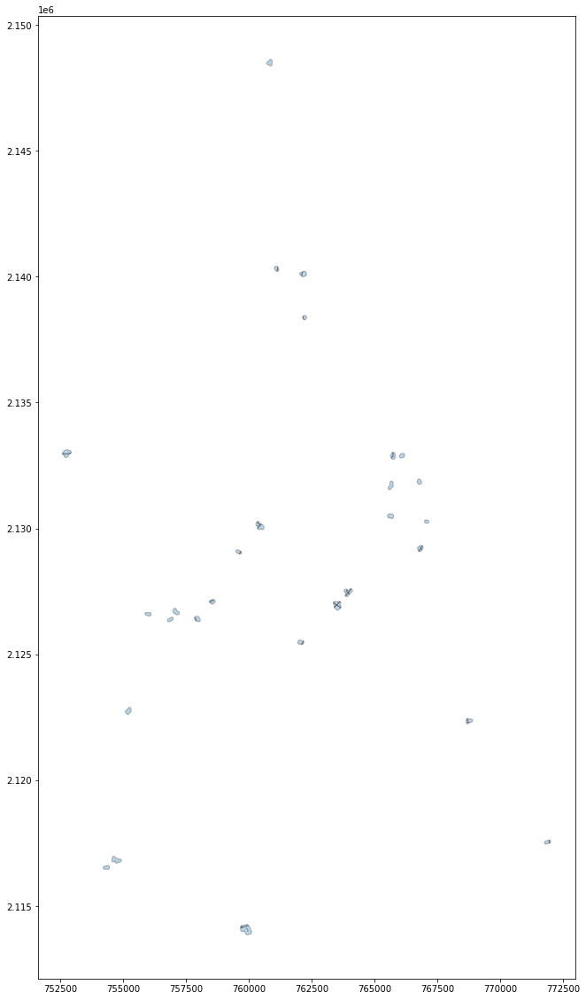

In [294]:
ax = buffer_clip_gender.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [295]:
 inter_gender=gpd.overlay(gdf1, buffer_clip_gender, how='intersection', make_valid=True, keep_geom_type=False)
 inter_gender.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALT0M041,ALT0M042,ALT0M043,ALT0M044,ALT0M045,ALT0M046,ALT0M047,ALT0M048,ALT0M049,geometry
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,50,22,30,14,32,54,19,14,30,"POLYGON ((755107.565 2122679.293, 755106.670 2..."
1,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,51,25,26,14,14,26,14,14,14,"POLYGON ((762284.375 2140151.695, 762285.142 2..."
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,32,21,14,25,28,82,23,43,56,"POLYGON ((762092.339 2140043.398, 762091.932 2..."
3,P026DAL,White Rock Creek Trail at Park Central,permanent,2019,Dallas,3.0,237.269643,37.000000,6.369863,536.0,...,32,21,14,25,28,82,23,43,56,"POLYGON ((761182.635 2140263.301, 761182.119 2..."
4,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,34,14,33,14,14,29,41,14,14,"POLYGON ((771937.390 2117617.977, 771943.261 2..."


In [296]:
inter_gender["buffered area"]=inter_gender.area
inter_gender['area factor']=inter_gender['buffered area']/inter_gender["Total block Area"]
inter_gender.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALT0M043,ALT0M044,ALT0M045,ALT0M046,ALT0M047,ALT0M048,ALT0M049,geometry,buffered area,area factor
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,30,14,32,54,19,14,30,"POLYGON ((755107.565 2122679.293, 755106.670 2...",41328.809377,0.035511
1,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,26,14,14,26,14,14,14,"POLYGON ((762284.375 2140151.695, 762285.142 2...",32341.334094,0.027658
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,14,25,28,82,23,43,56,"POLYGON ((762092.339 2140043.398, 762091.932 2...",9962.575953,0.006695
3,P026DAL,White Rock Creek Trail at Park Central,permanent,2019,Dallas,3.0,237.269643,37.000000,6.369863,536.0,...,14,25,28,82,23,43,56,"POLYGON ((761182.635 2140263.301, 761182.119 2...",7262.469837,0.004881
4,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,33,14,14,29,41,14,14,"POLYGON ((771937.390 2117617.977, 771943.261 2...",5740.642865,0.003943


In [297]:
#'AHYQE001',=total, 'AHYQE002'=male,AHYQE026=female
gender_filter=inter_gender.loc[:, ['osm_id_sensor', 'ALT0E001', 'ALT0E002', 'ALT0E026','area factor']]
gender_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALT0E001,ALT0E002,ALT0E026,area factor
0,356309596.0,1687,929,758,0.035511
1,493380742.0,1244,646,598,0.027658
2,493380742.0,2890,1191,1699,0.006695
3,492447672.0,2890,1191,1699,0.004881
4,461234382.0,2453,1284,1169,0.003943


In [298]:
gender_filter.iloc[:, 1:4] = gender_filter.iloc[:, 1:4].mul(gender_filter['area factor'],axis=0)
gender_filter=gender_filter.drop(['area factor'],axis=1)
gender_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALT0E001,ALT0E002,ALT0E026
0,356309596.0,59.906351,32.989330,26.917021
1,493380742.0,34.407063,17.867333,16.539730
2,493380742.0,19.349721,7.974228,11.375494
3,492447672.0,14.105465,5.813013,8.292452
4,461234382.0,9.671168,5.062283,4.608885


In [299]:
# Aggregate by ID
output_pct_gender=gender_filter.groupby('osm_id_sensor', as_index=False).sum()
output_pct_gender.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALT0E001,ALT0E002,ALT0E026
0,28545390.0,209.531040,102.689731,106.841309
1,97891369.0,29.093376,15.453432,13.639945
2,170833583.0,192.730198,100.955122,91.775076
3,178552402.0,34.146805,17.308888,16.837917
4,223881858.0,55.968432,26.391247,29.577185


In [300]:
# Calculate percentage of white and percentage of Black or African American 
output_pct_gender['pct_male']=(output_pct_gender['ALT0E002']/output_pct_gender['ALT0E001'])*100
output_pct_gender['pct_female']=(output_pct_gender['ALT0E026']/output_pct_gender['ALT0E001'])*100
output_pct_gender.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALT0E001,ALT0E002,ALT0E026,pct_male,pct_female
0,28545390.0,209.531040,102.689731,106.841309,49.009317,50.990683
1,97891369.0,29.093376,15.453432,13.639945,53.116666,46.883334
2,170833583.0,192.730198,100.955122,91.775076,52.381580,47.618420
3,178552402.0,34.146805,17.308888,16.837917,50.689626,49.310374
4,223881858.0,55.968432,26.391247,29.577185,47.153808,52.846192


In [301]:
output_pct_gender1=output_pct_gender.drop(['ALT0E001', 'ALT0E002', 'ALT0E026'],axis=1)
output_pct_gender1.columns=['osm_id','pct_male','pct_female']
output_pct_gender1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,pct_male,pct_female
0,28545390.0,49.009317,50.990683
1,97891369.0,53.116666,46.883334
2,170833583.0,52.381580,47.618420
3,178552402.0,50.689626,49.310374
4,223881858.0,47.153808,52.846192


# Number of Student (student access) and Education (pct of at least college education population)

In [302]:
#edu=pd.read_csv("../input/oregon-sd-data/education.csv")
edu.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,ALWGM016,ALWGM017,ALWGM018,ALWGM019,ALWGM020,ALWGM021,ALWGM022,ALWGM023,ALWGM024,ALWGM025
0,G48000109501001,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,5,98,36,32,100,34,28,30,14,14
1,G48000109501002,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,8,162,51,54,116,57,78,64,5,4
2,G48000109501003,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,14,89,27,46,159,52,74,42,21,7
3,G48000109504011,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,41,124,124,95,140,76,62,14,18,14
4,G48000109504021,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,40,177,219,113,206,106,62,42,27,15


In [303]:
edu1=pd.merge(bg_proj, edu, left_on='GISJOIN', right_on='GISJOIN', how='left')
edu1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALWGM016,ALWGM017,ALWGM018,ALWGM019,ALWGM020,ALWGM021,ALWGM022,ALWGM023,ALWGM024,ALWGM025
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,...,5,98,36,32,100,34,28,30,14,14
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,...,8,162,51,54,116,57,78,64,5,4
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,...,14,89,27,46,159,52,74,42,21,7
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,...,41,124,124,95,140,76,62,14,18,14
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,...,40,177,219,113,206,106,62,42,27,15


In [304]:
# Clip the data using GeoPandas clip
buffer_clip_edu = gpd.clip(edu1, gdf1)
buffer_clip_edu.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALWGM016,ALWGM017,ALWGM018,ALWGM019,ALWGM020,ALWGM021,ALWGM022,ALWGM023,ALWGM024,ALWGM025
2857,G48008500317192,48,085,031719,2,480850317192,Block Group 2,G5030,S,464162.0,...,19,52,14,18,49,21,79,35,59,20
3143,G48011300004063,48,113,000406,3,481130004063,Block Group 3,G5030,S,2039692.0,...,63,182,40,14,66,35,14,14,14,14
3147,G48011300005002,48,113,000500,2,481130005002,Block Group 2,G5030,S,936132.0,...,34,67,5,75,85,64,364,131,193,83
3161,G48011300006061,48,113,000606,1,481130006061,Block Group 1,G5030,S,649796.0,...,28,60,14,57,108,49,134,79,62,44
3166,G48011300007021,48,113,000702,1,481130007021,Block Group 1,G5030,S,357428.0,...,14,98,14,31,53,37,170,146,111,14


In [305]:
#ax = buffer_clip_edu.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [306]:
inter_edu=gpd.overlay(gdf1, buffer_clip_edu, how='intersection', make_valid=True, keep_geom_type=False)
inter_edu.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALWGM017,ALWGM018,ALWGM019,ALWGM020,ALWGM021,ALWGM022,ALWGM023,ALWGM024,ALWGM025,geometry
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,32,17,42,71,50,138,81,58,17,"POLYGON ((755107.565 2122679.293, 755106.670 2..."
1,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,61,14,62,144,85,97,90,49,14,"POLYGON ((762284.375 2140151.695, 762285.142 2..."
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,123,35,66,185,116,226,147,82,22,"POLYGON ((762092.339 2140043.398, 762091.932 2..."
3,P026DAL,White Rock Creek Trail at Park Central,permanent,2019,Dallas,3.0,237.269643,37.000000,6.369863,536.0,...,123,35,66,185,116,226,147,82,22,"POLYGON ((761182.635 2140263.301, 761182.119 2..."
4,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,221,79,95,75,144,94,14,14,14,"POLYGON ((771937.390 2117617.977, 771943.261 2..."


In [307]:
inter_edu["buffered area"]=inter_edu.area
inter_edu['area factor']=inter_edu['buffered area']/inter_edu["Total block Area"]
inter_edu.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALWGM019,ALWGM020,ALWGM021,ALWGM022,ALWGM023,ALWGM024,ALWGM025,geometry,buffered area,area factor
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,42,71,50,138,81,58,17,"POLYGON ((755107.565 2122679.293, 755106.670 2...",41328.809377,0.035511
1,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,62,144,85,97,90,49,14,"POLYGON ((762284.375 2140151.695, 762285.142 2...",32341.334094,0.027658
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,66,185,116,226,147,82,22,"POLYGON ((762092.339 2140043.398, 762091.932 2...",9962.575953,0.006695
3,P026DAL,White Rock Creek Trail at Park Central,permanent,2019,Dallas,3.0,237.269643,37.000000,6.369863,536.0,...,66,185,116,226,147,82,22,"POLYGON ((761182.635 2140263.301, 761182.119 2...",7262.469837,0.004881
4,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,95,75,144,94,14,14,14,"POLYGON ((771937.390 2117617.977, 771943.261 2...",5740.642865,0.003943


In [308]:
edu_filter=inter_edu.loc[:, ['osm_id_sensor', 'ALWGE001', 'ALWGE019','ALWGE020','ALWGE021', 'ALWGE022','ALWGE023','ALWGE024','ALWGE025','area factor']]
edu_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALWGE001,ALWGE019,ALWGE020,ALWGE021,ALWGE022,ALWGE023,ALWGE024,ALWGE025,area factor
0,356309596.0,1391,54,103,95,724,232,101,11,0.035511
1,493380742.0,653,74,144,81,75,111,41,0,0.027658
2,493380742.0,2014,90,344,174,624,352,116,14,0.006695
3,492447672.0,2014,90,344,174,624,352,116,14,0.004881
4,461234382.0,1521,139,103,136,69,0,0,0,0.003943


In [309]:
edu_filter.iloc[:, 1:9] = edu_filter.iloc[:, 1:9].mul(edu_filter['area factor'],axis=0)
edu_filter=edu_filter.drop(['area factor'],axis=1)
edu_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALWGE001,ALWGE019,ALWGE020,ALWGE021,ALWGE022,ALWGE023,ALWGE024,ALWGE025
0,356309596.0,49.395219,1.917571,3.657590,3.373505,25.709661,8.238455,3.586569,0.390616
1,493380742.0,18.060942,2.046722,3.982811,2.240331,2.074381,3.070084,1.133995,0.000000
2,493380742.0,13.484546,0.602586,2.303219,1.165001,4.177933,2.356783,0.776667,0.093736
3,492447672.0,9.829898,0.439271,1.678990,0.849256,3.045609,1.718036,0.566171,0.068331
4,461234382.0,5.996676,0.548020,0.406087,0.536192,0.272039,0.000000,0.000000,0.000000


In [310]:
# Aggregate by ID
output_pct_edu=edu_filter.groupby('osm_id_sensor', as_index=False).sum()
output_pct_edu.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALWGE001,ALWGE019,ALWGE020,ALWGE021,ALWGE022,ALWGE023,ALWGE024,ALWGE025
0,28545390.0,143.837299,3.977478,24.192438,5.773858,25.512425,9.179713,1.540770,1.956615
1,97891369.0,23.716885,0.764154,3.615253,0.552005,6.162203,5.495063,1.944703,0.424299
2,170833583.0,147.465476,3.193807,8.179583,5.045385,78.154215,24.383905,12.622416,4.959387
3,178552402.0,28.499169,1.474498,5.111350,1.487869,10.399363,4.428383,1.471837,1.038364
4,223881858.0,51.164815,1.791637,8.414415,3.459300,16.357747,9.949632,4.765620,2.009709


# Number of students 

In [311]:
scll.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,ALV5M010,ALV5M011,ALV5M012,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019
0,G37000100201001,2015-2019,NC,NaN,NaN,North Carolina,37,Alamance County,1,NaN,...,17,12,15,37,15,50,12,38,12,182
1,G37000100201002,2015-2019,NC,NaN,NaN,North Carolina,37,Alamance County,1,NaN,...,12,12,21,12,16,14,12,41,50,154
2,G37000100201003,2015-2019,NC,NaN,NaN,North Carolina,37,Alamance County,1,NaN,...,56,12,40,14,12,12,6,32,12,156
3,G37000100201004,2015-2019,NC,NaN,NaN,North Carolina,37,Alamance County,1,NaN,...,12,12,12,12,22,24,12,28,12,155
4,G37000100202001,2015-2019,NC,NaN,NaN,North Carolina,37,Alamance County,1,NaN,...,2,32,12,27,35,12,12,17,12,309


In [312]:
scl1=pd.merge(bg_proj, scll, left_on='GISJOIN', right_on='GISJOIN', how='left')
scl1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALV5M010,ALV5M011,ALV5M012,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [313]:
# Clip the data using GeoPandas clip
buffer_clip_scl = gpd.clip(scl1, gdf1)
buffer_clip_scl.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALV5M010,ALV5M011,ALV5M012,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019
2857,G48008500317192,48,085,031719,2,480850317192,Block Group 2,G5030,S,464162.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3143,G48011300004063,48,113,000406,3,481130004063,Block Group 3,G5030,S,2039692.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3147,G48011300005002,48,113,000500,2,481130005002,Block Group 2,G5030,S,936132.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3161,G48011300006061,48,113,000606,1,481130006061,Block Group 1,G5030,S,649796.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3166,G48011300007021,48,113,000702,1,481130007021,Block Group 1,G5030,S,357428.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [314]:
inter_scl=gpd.overlay(gdf1, buffer_clip_scl, how='intersection', make_valid=True, keep_geom_type=False)
inter_scl.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALV5M011,ALV5M012,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019,geometry
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((755107.565 2122679.293, 755106.670 2..."
1,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((762284.375 2140151.695, 762285.142 2..."
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((762092.339 2140043.398, 762091.932 2..."
3,P026DAL,White Rock Creek Trail at Park Central,permanent,2019,Dallas,3.0,237.269643,37.000000,6.369863,536.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((761182.635 2140263.301, 761182.119 2..."
4,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((771937.390 2117617.977, 771943.261 2..."


In [315]:
inter_scl["buffered area"]=inter_scl.area
inter_scl['area factor']=inter_scl['buffered area']/inter_scl["Total block Area"]
inter_scl.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019,geometry,buffered area,area factor
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((755107.565 2122679.293, 755106.670 2...",41328.809377,0.035511
1,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((762284.375 2140151.695, 762285.142 2...",32341.334094,0.027658
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((762092.339 2140043.398, 762091.932 2...",9962.575953,0.006695
3,P026DAL,White Rock Creek Trail at Park Central,permanent,2019,Dallas,3.0,237.269643,37.000000,6.369863,536.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((761182.635 2140263.301, 761182.119 2...",7262.469837,0.004881
4,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((771937.390 2117617.977, 771943.261 2...",5740.642865,0.003943


In [316]:
scl_filter=inter_scl.loc[:, ['osm_id_sensor', 'ALV5E001', 'ALV5E017', 'ALV5E018','area factor']]
scl_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALV5E001,ALV5E017,ALV5E018,area factor
0,356309596.0,NaN,NaN,NaN,0.035511
1,493380742.0,NaN,NaN,NaN,0.027658
2,493380742.0,NaN,NaN,NaN,0.006695
3,492447672.0,NaN,NaN,NaN,0.004881
4,461234382.0,NaN,NaN,NaN,0.003943


In [317]:
scl_filter.iloc[:, 1:4] = scl_filter.iloc[:, 1:4].mul(scl_filter['area factor'],axis=0)
scl_filter=scl_filter.drop(['area factor'],axis=1)
scl_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALV5E001,ALV5E017,ALV5E018
0,356309596.0,NaN,NaN,NaN
1,493380742.0,NaN,NaN,NaN
2,493380742.0,NaN,NaN,NaN
3,492447672.0,NaN,NaN,NaN
4,461234382.0,NaN,NaN,NaN


In [318]:
scl_filter['total student']=scl_filter['ALV5E017']+scl_filter['ALV5E018']
output_student=scl_filter.loc[:,['osm_id_sensor','total student']]
output_student.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,total student
0,356309596.0,NaN
1,493380742.0,NaN
2,493380742.0,NaN
3,492447672.0,NaN
4,461234382.0,NaN


In [319]:
output_student=output_student.groupby('osm_id_sensor', as_index=False).sum()
output_student.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,total student
0,28545390.0,0.0
1,97891369.0,0.0
2,170833583.0,0.0
3,178552402.0,0.0
4,223881858.0,0.0


In [320]:
output_student.columns=['osm_id', 'Student Access']
output_student.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Student Access
0,28545390.0,0.0
1,97891369.0,0.0
2,170833583.0,0.0
3,178552402.0,0.0
4,223881858.0,0.0


# Education ( pct of at least college population)

In [321]:
# Calculate percentage of education 
output_pct_edu['total_at_least_college_education']=output_pct_edu.iloc[:,2:9].sum(axis=1)
output_pct_edu.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALWGE001,ALWGE019,ALWGE020,ALWGE021,ALWGE022,ALWGE023,ALWGE024,ALWGE025,total_at_least_college_education
0,28545390.0,143.837299,3.977478,24.192438,5.773858,25.512425,9.179713,1.540770,1.956615,72.133297
1,97891369.0,23.716885,0.764154,3.615253,0.552005,6.162203,5.495063,1.944703,0.424299,18.957679
2,170833583.0,147.465476,3.193807,8.179583,5.045385,78.154215,24.383905,12.622416,4.959387,136.538698
3,178552402.0,28.499169,1.474498,5.111350,1.487869,10.399363,4.428383,1.471837,1.038364,25.411665
4,223881858.0,51.164815,1.791637,8.414415,3.459300,16.357747,9.949632,4.765620,2.009709,46.748060


In [322]:
output_pct_edu['pct_at_least_college_education']=(output_pct_edu['total_at_least_college_education']/output_pct_edu['ALWGE001'])*100
output_pct_edu.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALWGE001,ALWGE019,ALWGE020,ALWGE021,ALWGE022,ALWGE023,ALWGE024,ALWGE025,total_at_least_college_education,pct_at_least_college_education
0,28545390.0,143.837299,3.977478,24.192438,5.773858,25.512425,9.179713,1.540770,1.956615,72.133297,50.149230
1,97891369.0,23.716885,0.764154,3.615253,0.552005,6.162203,5.495063,1.944703,0.424299,18.957679,79.933261
2,170833583.0,147.465476,3.193807,8.179583,5.045385,78.154215,24.383905,12.622416,4.959387,136.538698,92.590281
3,178552402.0,28.499169,1.474498,5.111350,1.487869,10.399363,4.428383,1.471837,1.038364,25.411665,89.166336
4,223881858.0,51.164815,1.791637,8.414415,3.459300,16.357747,9.949632,4.765620,2.009709,46.748060,91.367594


In [323]:
output_pct_edu1=output_pct_edu.loc[:,['osm_id_sensor','pct_at_least_college_education']]
output_pct_edu1.columns=['osm_id','pct_at_least_college_education']
output_pct_edu1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,pct_at_least_college_education
0,28545390.0,50.149230
1,97891369.0,79.933261
2,170833583.0,92.590281
3,178552402.0,89.166336
4,223881858.0,91.367594


# Median Age

In [787]:
#age=pd.read_csv("../input/oregon-sd-data/median_age.csv")
age.head(5)

,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,BTTRA,BTBGA,NAME_E,ALT1E001,ALT1E002,ALT1E003,NAME_M,ALT1M001,ALT1M002,ALT1M003
0,G48000109501001,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,"Block Group 1, Census Tract 9501, Anderson Cou...",42.2,42.2,42.5,"Block Group 1, Census Tract 9501, Anderson Cou...",9.9,6.6,19.2
1,G48000109501002,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,"Block Group 2, Census Tract 9501, Anderson Cou...",37.8,37.7,39.0,"Block Group 2, Census Tract 9501, Anderson Cou...",9.9,11.6,9.0
2,G48000109501003,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,"Block Group 3, Census Tract 9501, Anderson Cou...",53.9,51.6,58.3,"Block Group 3, Census Tract 9501, Anderson Cou...",4.8,6.1,5.5
3,G48000109504011,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,"Block Group 1, Census Tract 9504.01, Anderson ...",34.6,34.8,14.1,"Block Group 1, Census Tract 9504.01, Anderson ...",0.8,0.9,23.4
4,G48000109504021,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,"Block Group 1, Census Tract 9504.02, Anderson ...",40.7,40.7,39.5,"Block Group 1, Census Tract 9504.02, Anderson ...",0.8,0.7,9.3


In [788]:
age1=pd.merge(bg_proj, age, left_on='GISJOIN', right_on='GISJOIN', how='left')
age1.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,BTTRA,BTBGA,NAME_E,ALT1E001,ALT1E002,ALT1E003,NAME_M,ALT1M001,ALT1M002,ALT1M003
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,...,NaN,NaN,"Block Group 1, Census Tract 9501, Anderson Cou...",42.2,42.2,42.5,"Block Group 1, Census Tract 9501, Anderson Cou...",9.9,6.6,19.2
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,...,NaN,NaN,"Block Group 2, Census Tract 9501, Anderson Cou...",37.8,37.7,39.0,"Block Group 2, Census Tract 9501, Anderson Cou...",9.9,11.6,9.0
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,...,NaN,NaN,"Block Group 3, Census Tract 9501, Anderson Cou...",53.9,51.6,58.3,"Block Group 3, Census Tract 9501, Anderson Cou...",4.8,6.1,5.5
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,...,NaN,NaN,"Block Group 1, Census Tract 9504.01, Anderson ...",34.6,34.8,14.1,"Block Group 1, Census Tract 9504.01, Anderson ...",0.8,0.9,23.4
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,...,NaN,NaN,"Block Group 1, Census Tract 9504.02, Anderson ...",40.7,40.7,39.5,"Block Group 1, Census Tract 9504.02, Anderson ...",0.8,0.7,9.3


In [789]:
# Clip the data using GeoPandas clip
buffer_clip_age = gpd.clip(age1, gdf1)
buffer_clip_age.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,BTTRA,BTBGA,NAME_E,ALT1E001,ALT1E002,ALT1E003,NAME_M,ALT1M001,ALT1M002,ALT1M003
3559,G48011300091053,48,113,009105,3,481130091053,Block Group 3,G5030,S,620708.0,...,NaN,NaN,"Block Group 3, Census Tract 91.05, Dallas Coun...",26.5,26.7,23.0,"Block Group 3, Census Tract 91.05, Dallas Coun...",9.0,7.6,18.2
3562,G48011300092013,48,113,009201,3,481130092013,Block Group 3,G5030,S,687401.0,...,NaN,NaN,"Block Group 3, Census Tract 92.01, Dallas Coun...",37.2,37.5,36.2,"Block Group 3, Census Tract 92.01, Dallas Coun...",10.1,13.0,14.3
3729,G48011300119004,48,113,011900,4,481130119004,Block Group 4,G5030,S,724344.0,...,NaN,NaN,"Block Group 4, Census Tract 119, Dallas County...",35.9,40.5,35.1,"Block Group 4, Census Tract 119, Dallas County...",13.5,16.4,21.3
3563,G48011300092014,48,113,009201,4,481130092014,Block Group 4,G5030,S,611392.0,...,NaN,NaN,"Block Group 4, Census Tract 92.01, Dallas Coun...",30.1,29.7,30.3,"Block Group 4, Census Tract 92.01, Dallas Coun...",4.5,9.6,5.1
3728,G48011300119003,48,113,011900,3,481130119003,Block Group 3,G5030,S,787337.0,...,NaN,NaN,"Block Group 3, Census Tract 119, Dallas County...",24.7,26.0,24.6,"Block Group 3, Census Tract 119, Dallas County...",3.6,8.6,8.3


In [790]:
inter_age=gpd.overlay(gdf1, buffer_clip_age, how='intersection', make_valid=True, keep_geom_type=False)
inter_age.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,BTBGA,NAME_E,ALT1E001,ALT1E002,ALT1E003,NAME_M,ALT1M001,ALT1M002,ALT1M003,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,"Block Group 1, Census Tract 86.03, Dallas Coun...",34.5,24.5,39.7,"Block Group 1, Census Tract 86.03, Dallas Coun...",13.2,14.3,21.0,"POLYGON ((763996.050 2116150.845, 763995.608 2..."
1,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,NaN,"Block Group 1, Census Tract 86.03, Dallas Coun...",34.5,24.5,39.7,"Block Group 1, Census Tract 86.03, Dallas Coun...",13.2,14.3,21.0,"POLYGON ((763996.050 2116150.845, 763995.608 2..."
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,"Block Group 2, Census Tract 202, Dallas County...",40.1,40.0,40.2,"Block Group 2, Census Tract 202, Dallas County...",14.8,16.4,17.3,"POLYGON ((764270.617 2113320.427, 764266.633 2..."
3,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,NaN,"Block Group 2, Census Tract 202, Dallas County...",40.1,40.0,40.2,"Block Group 2, Census Tract 202, Dallas County...",14.8,16.4,17.3,"POLYGON ((764270.617 2113320.427, 764266.633 2..."
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,"Block Group 3, Census Tract 202, Dallas County...",46.8,44.2,62.1,"Block Group 3, Census Tract 202, Dallas County...",16.1,25.9,23.9,"POLYGON ((766512.852 2113768.560, 766511.974 2..."


In [791]:
inter_age["buffered area"]=inter_age.area
inter_age['area factor']=inter_age['buffered area']/inter_age["Total block Area"]
inter_age.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALT1E001,ALT1E002,ALT1E003,NAME_M,ALT1M001,ALT1M002,ALT1M003,geometry,buffered area,area factor
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,34.5,24.5,39.7,"Block Group 1, Census Tract 86.03, Dallas Coun...",13.2,14.3,21.0,"POLYGON ((763996.050 2116150.845, 763995.608 2...",7.857717e+04,0.010574
1,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,34.5,24.5,39.7,"Block Group 1, Census Tract 86.03, Dallas Coun...",13.2,14.3,21.0,"POLYGON ((763996.050 2116150.845, 763995.608 2...",7.857717e+04,0.010574
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,40.1,40.0,40.2,"Block Group 2, Census Tract 202, Dallas County...",14.8,16.4,17.3,"POLYGON ((764270.617 2113320.427, 764266.633 2...",6.802643e+04,0.050878
3,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,40.1,40.0,40.2,"Block Group 2, Census Tract 202, Dallas County...",14.8,16.4,17.3,"POLYGON ((764270.617 2113320.427, 764266.633 2...",6.802643e+04,0.050878
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,46.8,44.2,62.1,"Block Group 3, Census Tract 202, Dallas County...",16.1,25.9,23.9,"POLYGON ((766512.852 2113768.560, 766511.974 2...",1.149686e+06,0.070179


In [792]:
#    Table 1:     Median Age by Sex
#    Universe:    Total population
#    Source code: B01002
#    NHGIS code:  ALT1
#        ALT1E001:    Median age: Total
#        ALT1E002:    Median age: Male
#        ALT1E003:    Median age: Female
age_filter=inter_age.loc[:, ['osm_id_sensor','GEOID_x','ALT1E001']]
age_filter.columns=['osm_id_sensor','GEOID','ALT1E001']
age_filter.head()

,osm_id_sensor,GEOID,ALT1E001
0,496723098.0,481130086031,34.5
1,496723099.0,481130086031,34.5
2,496723098.0,481130202002,40.1
3,496723099.0,481130202002,40.1
4,496723098.0,481130202003,46.8


In [793]:
#age_filter.iloc[:, 1:2] = age_filter.iloc[:, 1:2].mul(age_filter['area factor'],axis=0)
#age_filter=age_filter.drop(['area factor'],axis=1)
#age_filter

In [794]:
# Aggregate by ID
#output_median_age=age_filter.groupby('ID', as_index=False).mean()
#output_median_age

In [795]:
#output_median_age.columns=['ID', 'Median_Age']
#output_median_age

# Median HH_income

In [796]:
#income=pd.read_csv("../input/oregon-sd-data/median_hh_income.csv")
income.head(5)

,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,UR,PCI,PUMA5A,GEOID,BTTRA,BTBGA,NAME_E,ALW1E001,NAME_M,ALW1M001
0,G48000109501001,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,NaN,15000US480019501001,NaN,NaN,"Block Group 1, Census Tract 9501, Anderson Cou...",41927.0,"Block Group 1, Census Tract 9501, Anderson Cou...",13151.0
1,G48000109501002,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,NaN,15000US480019501002,NaN,NaN,"Block Group 2, Census Tract 9501, Anderson Cou...",81786.0,"Block Group 2, Census Tract 9501, Anderson Cou...",16870.0
2,G48000109501003,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,NaN,15000US480019501003,NaN,NaN,"Block Group 3, Census Tract 9501, Anderson Cou...",57692.0,"Block Group 3, Census Tract 9501, Anderson Cou...",19396.0
3,G48000109504011,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,NaN,15000US480019504011,NaN,NaN,"Block Group 1, Census Tract 9504.01, Anderson ...",75938.0,"Block Group 1, Census Tract 9504.01, Anderson ...",49363.0
4,G48000109504021,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,NaN,NaN,NaN,15000US480019504021,NaN,NaN,"Block Group 1, Census Tract 9504.02, Anderson ...",85921.0,"Block Group 1, Census Tract 9504.02, Anderson ...",3945.0


In [797]:
income1=pd.merge(bg_proj, income, left_on='GISJOIN', right_on='GISJOIN', how='left')
income1.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,UR,PCI,PUMA5A,GEOID_y,BTTRA,BTBGA,NAME_E,ALW1E001,NAME_M,ALW1M001
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,...,NaN,NaN,NaN,15000US480019501001,NaN,NaN,"Block Group 1, Census Tract 9501, Anderson Cou...",41927.0,"Block Group 1, Census Tract 9501, Anderson Cou...",13151.0
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,...,NaN,NaN,NaN,15000US480019501002,NaN,NaN,"Block Group 2, Census Tract 9501, Anderson Cou...",81786.0,"Block Group 2, Census Tract 9501, Anderson Cou...",16870.0
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,...,NaN,NaN,NaN,15000US480019501003,NaN,NaN,"Block Group 3, Census Tract 9501, Anderson Cou...",57692.0,"Block Group 3, Census Tract 9501, Anderson Cou...",19396.0
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,...,NaN,NaN,NaN,15000US480019504011,NaN,NaN,"Block Group 1, Census Tract 9504.01, Anderson ...",75938.0,"Block Group 1, Census Tract 9504.01, Anderson ...",49363.0
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,...,NaN,NaN,NaN,15000US480019504021,NaN,NaN,"Block Group 1, Census Tract 9504.02, Anderson ...",85921.0,"Block Group 1, Census Tract 9504.02, Anderson ...",3945.0


In [798]:
# Clip the data using GeoPandas clip
buffer_clip_income = gpd.clip(income1, gdf1)
buffer_clip_income.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,UR,PCI,PUMA5A,GEOID_y,BTTRA,BTBGA,NAME_E,ALW1E001,NAME_M,ALW1M001
3559,G48011300091053,48,113,009105,3,481130091053,Block Group 3,G5030,S,620708.0,...,NaN,NaN,NaN,15000US481130091053,NaN,NaN,"Block Group 3, Census Tract 91.05, Dallas Coun...",40082.0,"Block Group 3, Census Tract 91.05, Dallas Coun...",12334.0
3562,G48011300092013,48,113,009201,3,481130092013,Block Group 3,G5030,S,687401.0,...,NaN,NaN,NaN,15000US481130092013,NaN,NaN,"Block Group 3, Census Tract 92.01, Dallas Coun...",38036.0,"Block Group 3, Census Tract 92.01, Dallas Coun...",30409.0
3729,G48011300119004,48,113,011900,4,481130119004,Block Group 4,G5030,S,724344.0,...,NaN,NaN,NaN,15000US481130119004,NaN,NaN,"Block Group 4, Census Tract 119, Dallas County...",42177.0,"Block Group 4, Census Tract 119, Dallas County...",24945.0
3563,G48011300092014,48,113,009201,4,481130092014,Block Group 4,G5030,S,611392.0,...,NaN,NaN,NaN,15000US481130092014,NaN,NaN,"Block Group 4, Census Tract 92.01, Dallas Coun...",51146.0,"Block Group 4, Census Tract 92.01, Dallas Coun...",23660.0
3728,G48011300119003,48,113,011900,3,481130119003,Block Group 3,G5030,S,787337.0,...,NaN,NaN,NaN,15000US481130119003,NaN,NaN,"Block Group 3, Census Tract 119, Dallas County...",50380.0,"Block Group 3, Census Tract 119, Dallas County...",36361.0


In [799]:
inter_income=gpd.overlay(gdf1, buffer_clip_income, how='intersection', make_valid=True, keep_geom_type=False)
inter_income.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,PCI,PUMA5A,GEOID_y,BTTRA,BTBGA,NAME_E,ALW1E001,NAME_M,ALW1M001,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,15000US481130086031,NaN,NaN,"Block Group 1, Census Tract 86.03, Dallas Coun...",28000.0,"Block Group 1, Census Tract 86.03, Dallas Coun...",23300.0,"POLYGON ((763996.050 2116150.845, 763995.608 2..."
1,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,NaN,NaN,15000US481130086031,NaN,NaN,"Block Group 1, Census Tract 86.03, Dallas Coun...",28000.0,"Block Group 1, Census Tract 86.03, Dallas Coun...",23300.0,"POLYGON ((763996.050 2116150.845, 763995.608 2..."
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,15000US481130202002,NaN,NaN,"Block Group 2, Census Tract 202, Dallas County...",31354.0,"Block Group 2, Census Tract 202, Dallas County...",15291.0,"POLYGON ((764270.617 2113320.427, 764266.633 2..."
3,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,NaN,NaN,15000US481130202002,NaN,NaN,"Block Group 2, Census Tract 202, Dallas County...",31354.0,"Block Group 2, Census Tract 202, Dallas County...",15291.0,"POLYGON ((764270.617 2113320.427, 764266.633 2..."
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,15000US481130202003,NaN,NaN,"Block Group 3, Census Tract 202, Dallas County...",27831.0,"Block Group 3, Census Tract 202, Dallas County...",12372.0,"POLYGON ((766512.852 2113768.560, 766511.974 2..."


In [800]:
inter_income["buffered area"]=inter_income.area
inter_income['area factor']=inter_income['buffered area']/inter_income["Total block Area"]
inter_income.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,GEOID_y,BTTRA,BTBGA,NAME_E,ALW1E001,NAME_M,ALW1M001,geometry,buffered area,area factor
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,15000US481130086031,NaN,NaN,"Block Group 1, Census Tract 86.03, Dallas Coun...",28000.0,"Block Group 1, Census Tract 86.03, Dallas Coun...",23300.0,"POLYGON ((763996.050 2116150.845, 763995.608 2...",7.857717e+04,0.010574
1,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,15000US481130086031,NaN,NaN,"Block Group 1, Census Tract 86.03, Dallas Coun...",28000.0,"Block Group 1, Census Tract 86.03, Dallas Coun...",23300.0,"POLYGON ((763996.050 2116150.845, 763995.608 2...",7.857717e+04,0.010574
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,15000US481130202002,NaN,NaN,"Block Group 2, Census Tract 202, Dallas County...",31354.0,"Block Group 2, Census Tract 202, Dallas County...",15291.0,"POLYGON ((764270.617 2113320.427, 764266.633 2...",6.802643e+04,0.050878
3,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,15000US481130202002,NaN,NaN,"Block Group 2, Census Tract 202, Dallas County...",31354.0,"Block Group 2, Census Tract 202, Dallas County...",15291.0,"POLYGON ((764270.617 2113320.427, 764266.633 2...",6.802643e+04,0.050878
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,15000US481130202003,NaN,NaN,"Block Group 3, Census Tract 202, Dallas County...",27831.0,"Block Group 3, Census Tract 202, Dallas County...",12372.0,"POLYGON ((766512.852 2113768.560, 766511.974 2...",1.149686e+06,0.070179


In [801]:
income_filter=inter_income.loc[:, ['osm_id_sensor','GEOID_x', 'ALW1M001','area factor']]
income_filter.columns=['osm_id_sensor','GEOID', 'ALW1M001','area factor']
income_filter.head(5)

,osm_id_sensor,GEOID,ALW1M001,area factor
0,496723098.0,481130086031,23300.0,0.010574
1,496723099.0,481130086031,23300.0,0.010574
2,496723098.0,481130202002,15291.0,0.050878
3,496723099.0,481130202002,15291.0,0.050878
4,496723098.0,481130202003,12372.0,0.070179


In [802]:
#income_filter.iloc[:, 2:3] = income_filter.iloc[:, 2:3].mul(income_filter['area factor'],axis=0)
#income_filter.head(5)

# HH_density

In [803]:
#hhdensity=pd.read_csv("../input/oregon-sd-data/household_type.csv")
hhdensity.head(5)

,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,NAME_M,ALU9M001,ALU9M002,ALU9M003,ALU9M004,ALU9M005,ALU9M006,ALU9M007,ALU9M008,ALU9M009
0,G48000109501001,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,"Block Group 1, Census Tract 9501, Anderson Cou...",102,88,52,72,25,72,60,53,19
1,G48000109501002,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,"Block Group 2, Census Tract 9501, Anderson Cou...",116,110,107,22,4,22,53,54,14
2,G48000109501003,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,"Block Group 3, Census Tract 9501, Anderson Cou...",136,128,119,64,39,50,75,74,6
3,G48000109504011,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,"Block Group 1, Census Tract 9504.01, Anderson ...",32,28,26,11,14,11,25,25,14
4,G48000109504021,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,"Block Group 1, Census Tract 9504.02, Anderson ...",58,53,39,48,48,19,20,20,19


In [804]:
hhdensity1=pd.merge(bg_proj, hhdensity, left_on='GISJOIN', right_on='GISJOIN', how='left')
hhdensity1.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,NAME_M,ALU9M001,ALU9M002,ALU9M003,ALU9M004,ALU9M005,ALU9M006,ALU9M007,ALU9M008,ALU9M009
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,...,"Block Group 1, Census Tract 9501, Anderson Cou...",102,88,52,72,25,72,60,53,19
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,...,"Block Group 2, Census Tract 9501, Anderson Cou...",116,110,107,22,4,22,53,54,14
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,...,"Block Group 3, Census Tract 9501, Anderson Cou...",136,128,119,64,39,50,75,74,6
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,...,"Block Group 1, Census Tract 9504.01, Anderson ...",32,28,26,11,14,11,25,25,14
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,...,"Block Group 1, Census Tract 9504.02, Anderson ...",58,53,39,48,48,19,20,20,19


In [805]:
hhdensity1['Total Block HH']=hhdensity1.ALU9E001
hhdensity1.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALU9M001,ALU9M002,ALU9M003,ALU9M004,ALU9M005,ALU9M006,ALU9M007,ALU9M008,ALU9M009,Total Block HH
0,G48000109501001,48,001,950100,1,480019501001,Block Group 1,G5030,S,15079445.0,...,102,88,52,72,25,72,60,53,19,498
1,G48000109501002,48,001,950100,2,480019501002,Block Group 2,G5030,S,228222249.0,...,116,110,107,22,4,22,53,54,14,674
2,G48000109501003,48,001,950100,3,480019501003,Block Group 3,G5030,S,240004925.0,...,136,128,119,64,39,50,75,74,6,618
3,G48000109504011,48,001,950401,1,480019504011,Block Group 1,G5030,S,16549991.0,...,32,28,26,11,14,11,25,25,14,95
4,G48000109504021,48,001,950402,1,480019504021,Block Group 1,G5030,S,72472039.0,...,58,53,39,48,48,19,20,20,19,112


In [806]:
# Clip the data using GeoPandas clip
buffer_clip_hhdensity1 = gpd.clip(hhdensity1, gdf1)
buffer_clip_hhdensity1.head(5)

,GISJOIN,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,...,ALU9M001,ALU9M002,ALU9M003,ALU9M004,ALU9M005,ALU9M006,ALU9M007,ALU9M008,ALU9M009,Total Block HH
3559,G48011300091053,48,113,009105,3,481130091053,Block Group 3,G5030,S,620708.0,...,95,84,71,60,25,56,57,57,14,269
3562,G48011300092013,48,113,009201,3,481130092013,Block Group 3,G5030,S,687401.0,...,105,102,90,50,32,42,72,72,14,321
3729,G48011300119004,48,113,011900,4,481130119004,Block Group 4,G5030,S,724344.0,...,164,142,102,94,80,70,90,90,14,322
3563,G48011300092014,48,113,009201,4,481130092014,Block Group 4,G5030,S,611392.0,...,115,115,118,71,14,70,54,53,13,543
3728,G48011300119003,48,113,011900,3,481130119003,Block Group 3,G5030,S,787337.0,...,139,137,108,113,33,106,124,124,14,547


In [807]:
inter_hhdensity=gpd.overlay(gdf1, buffer_clip_hhdensity1, how='intersection', make_valid=True, keep_geom_type=False)
inter_hhdensity.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALU9M002,ALU9M003,ALU9M004,ALU9M005,ALU9M006,ALU9M007,ALU9M008,ALU9M009,Total Block HH,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,39,24,41,14,41,42,42,14,168,"POLYGON ((763996.050 2116150.845, 763995.608 2..."
1,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,39,24,41,14,41,42,42,14,168,"POLYGON ((763996.050 2116150.845, 763995.608 2..."
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,175,109,128,80,108,102,102,14,753,"POLYGON ((764270.617 2113320.427, 764266.633 2..."
3,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,175,109,128,80,108,102,102,14,753,"POLYGON ((764270.617 2113320.427, 764266.633 2..."
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,110,44,101,60,73,68,57,50,399,"POLYGON ((766512.852 2113768.560, 766511.974 2..."


In [808]:
inter_hhdensity["buffered area"]=inter_hhdensity.area
inter_hhdensity['area factor']=inter_hhdensity['buffered area']/inter_hhdensity["Total block Area"]
inter_hhdensity.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALU9M004,ALU9M005,ALU9M006,ALU9M007,ALU9M008,ALU9M009,Total Block HH,geometry,buffered area,area factor
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,41,14,41,42,42,14,168,"POLYGON ((763996.050 2116150.845, 763995.608 2...",7.857717e+04,0.010574
1,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,41,14,41,42,42,14,168,"POLYGON ((763996.050 2116150.845, 763995.608 2...",7.857717e+04,0.010574
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,128,80,108,102,102,14,753,"POLYGON ((764270.617 2113320.427, 764266.633 2...",6.802643e+04,0.050878
3,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,128,80,108,102,102,14,753,"POLYGON ((764270.617 2113320.427, 764266.633 2...",6.802643e+04,0.050878
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,101,60,73,68,57,50,399,"POLYGON ((766512.852 2113768.560, 766511.974 2...",1.149686e+06,0.070179


In [809]:
# Aggregate by ID
hh=inter_hhdensity.loc[:,['osm_id_sensor',"GEOID_x","Total Block HH",'buffered area']]
hh.columns=['osm_id_sensor',"GEOID","Total Block HH",'buffered area']
hh.head(5)

,osm_id_sensor,GEOID,Total Block HH,buffered area
0,496723098.0,481130086031,168,7.857717e+04
1,496723099.0,481130086031,168,7.857717e+04
2,496723098.0,481130202002,753,6.802643e+04
3,496723099.0,481130202002,753,6.802643e+04
4,496723098.0,481130202003,399,1.149686e+06


In [810]:
#    Table 1:     Household Type (Including Living Alone)
#    Universe:    Households
#    Source code: B11001
#    NHGIS code:  AHZZ
#        AHZZE001:    Total
#        AHZZE002:    Family households
#        AHZZE003:    Family households: Married-couple family
#        AHZZE004:    Family households: Other family
#        AHZZE005:    Family households: Other family: Male householder, no wife present
#        AHZZE006:    Family households: Other family: Female householder, no husband present
#        AHZZE007:    Nonfamily households
#        AHZZE008:    Nonfamily households: Householder living alone
#        AHZZE009:    Nonfamily households: Householder not living alone
hhdensity_filter=inter_hhdensity.loc[:, ['osm_id_sensor', 'GEOID_x','ALU9E001','area factor']]
hhdensity_filter.columns=['osm_id_sensor', 'GEOID','ALU9E001','area factor']
hh_factor=hhdensity_filter.copy()
hh_factor.head()

,osm_id_sensor,GEOID,ALU9E001,area factor
0,496723098.0,481130086031,168,0.010574
1,496723099.0,481130086031,168,0.010574
2,496723098.0,481130202002,753,0.050878
3,496723099.0,481130202002,753,0.050878
4,496723098.0,481130202003,399,0.070179


In [811]:
hh_factor["buffered_hh"]=hh_factor['ALU9E001']*hh_factor['area factor']
hh_factor['hh factor']=hh_factor['buffered_hh']/hh_factor['ALU9E001']
hh_factor.head() # factor is basically same

,osm_id_sensor,GEOID,ALU9E001,area factor,buffered_hh,hh factor
0,496723098.0,481130086031,168,0.010574,1.776369,0.010574
1,496723099.0,481130086031,168,0.010574,1.776369,0.010574
2,496723098.0,481130202002,753,0.050878,38.311228,0.050878
3,496723099.0,481130202002,753,0.050878,38.311228,0.050878
4,496723098.0,481130202003,399,0.070179,28.001251,0.070179


In [812]:
hh_factor1=hh_factor.loc[:,["osm_id_sensor","GEOID","buffered_hh"]]
hh_factor1.head()

,osm_id_sensor,GEOID,buffered_hh
0,496723098.0,481130086031,1.776369
1,496723099.0,481130086031,1.776369
2,496723098.0,481130202002,38.311228
3,496723099.0,481130202002,38.311228
4,496723098.0,481130202003,28.001251


In [813]:
hhdensity_filter.iloc[:, 2:3] = hhdensity_filter.iloc[:, 2:3].mul(hhdensity_filter['area factor'],axis=0)
hhdensity_filter=hhdensity_filter.drop(['area factor'],axis=1)
hhf=hhdensity_filter.copy()
hhdensity_filter.head()


,osm_id_sensor,GEOID,ALU9E001
0,496723098.0,481130086031,1.776369
1,496723099.0,481130086031,1.776369
2,496723098.0,481130202002,38.311228
3,496723099.0,481130202002,38.311228
4,496723098.0,481130202003,28.001251


In [814]:
# Aggregate by ID
hhdensity_filter=hhdensity_filter.drop(["GEOID"],axis=1)
output_hhdensity=hhdensity_filter.groupby('osm_id_sensor', as_index=False).sum()
output_hhdensity.head()

,osm_id_sensor,ALU9E001
0,28545390.0,18091.758658
1,97891369.0,21949.948353
2,144869316.0,8606.857459
3,170833583.0,33246.877312
4,178552402.0,8573.132875


In [815]:
# Aggregate by ID
output_hhdensity=pd.merge(output_hhdensity,gdf1,left_on="osm_id_sensor",right_on="osm_id_sensor")
output_hhdensity=output_hhdensity.loc[:,['osm_id_sensor','ALU9E001','buffer_area']]

In [816]:
output_hhdensity['HH_density']=output_hhdensity.ALU9E001/output_hhdensity.buffer_area
output_hhdensity.head()

,osm_id_sensor,ALU9E001,buffer_area,HH_density
0,28545390.0,18091.758658,7.307049,2475.932403
1,97891369.0,21949.948353,8.397998,2613.712098
2,144869316.0,8606.857459,4.729260,1819.916313
3,170833583.0,33246.877312,6.655320,4995.534049
4,178552402.0,8573.132875,5.086608,1685.432352


In [817]:
output_hhdensity1=output_hhdensity.loc[:, ['osm_id_sensor', 'HH_density']]
output_hhdensity1.columns=['osm_id', 'HH_density']
output_hhdensity1.head()

,osm_id,HH_density
0,28545390.0,2475.932403
1,97891369.0,2613.712098
2,144869316.0,1819.916313
3,170833583.0,4995.534049
4,178552402.0,1685.432352


# Weighted HH_income

In [818]:
whh_income=pd.merge(income_filter, hh_factor1, on=['osm_id_sensor', 'GEOID'])
whh_income.head()

,osm_id_sensor,GEOID,ALW1M001,area factor,buffered_hh
0,496723098.0,481130086031,23300.0,0.010574,1.776369
1,496723099.0,481130086031,23300.0,0.010574,1.776369
2,496723098.0,481130202002,15291.0,0.050878,38.311228
3,496723099.0,481130202002,15291.0,0.050878,38.311228
4,496723098.0,481130202003,12372.0,0.070179,28.001251


In [819]:
whh_income['wt_incme']=whh_income['ALW1M001'].mul(whh_income['buffered_hh'])
whh_income.head()

,osm_id_sensor,GEOID,ALW1M001,area factor,buffered_hh,wt_incme
0,496723098.0,481130086031,23300.0,0.010574,1.776369,41389.408589
1,496723099.0,481130086031,23300.0,0.010574,1.776369,41389.408589
2,496723098.0,481130202002,15291.0,0.050878,38.311228,585816.986452
3,496723099.0,481130202002,15291.0,0.050878,38.311228,585816.986452
4,496723098.0,481130202003,12372.0,0.070179,28.001251,346431.480769


In [820]:
income_filter=whh_income.drop(['GEOID','ALW1M001','area factor'],axis=1)
income_filter.head()

,osm_id_sensor,buffered_hh,wt_incme
0,496723098.0,1.776369,41389.408589
1,496723099.0,1.776369,41389.408589
2,496723098.0,38.311228,585816.986452
3,496723099.0,38.311228,585816.986452
4,496723098.0,28.001251,346431.480769


In [821]:
# Aggregate by ID
income_filter=income_filter.groupby('osm_id_sensor', as_index=False).sum()
income_filter.head()

,osm_id_sensor,buffered_hh,wt_incme
0,28545390.0,18091.758658,4.391857e+08
1,97891369.0,21949.948353,3.589151e+08
2,144869316.0,8606.857459,3.042273e+08
3,170833583.0,33246.877312,6.257136e+08
4,178552402.0,8573.132875,2.677712e+08


In [822]:
income_filter['HH weighted income']=income_filter['wt_incme']/income_filter['buffered_hh']
income_filter.head()

,osm_id_sensor,buffered_hh,wt_incme,HH weighted income
0,28545390.0,18091.758658,4.391857e+08,24275.455619
1,97891369.0,21949.948353,3.589151e+08,16351.523379
2,144869316.0,8606.857459,3.042273e+08,35347.083650
3,170833583.0,33246.877312,6.257136e+08,18820.221078
4,178552402.0,8573.132875,2.677712e+08,31233.765092


In [823]:
output_income=income_filter.drop(['buffered_hh','wt_incme'],axis=1)
output_income.columns=['osm_id', 'Median_HH_income']
output_income.head()

,osm_id,Median_HH_income
0,28545390.0,24275.455619
1,97891369.0,16351.523379
2,144869316.0,35347.083650
3,170833583.0,18820.221078
4,178552402.0,31233.765092


# Population Density

In [824]:
#pdensity=pd.read_csv("../input/oregon-sd-data/population.csv")
pdensity1=pd.merge(bg_proj, pdensity, left_on='GISJOIN', right_on='GISJOIN', how='left')
buffer_clip_pdensity1 = gpd.clip(pdensity1, gdf1)
inter_pdensity=gpd.overlay(gdf1, buffer_clip_pdensity1, how='intersection', make_valid=True, keep_geom_type=False)
inter_pdensity.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,PCI,PUMA5A,GEOID_y,BTTRA,BTBGA,NAME_E,ALUBE001,NAME_M,ALUBM001,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,15000US481130086031,NaN,NaN,"Block Group 1, Census Tract 86.03, Dallas Coun...",471,"Block Group 1, Census Tract 86.03, Dallas Coun...",182,"POLYGON ((763996.050 2116150.845, 763995.608 2..."
1,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,NaN,NaN,15000US481130086031,NaN,NaN,"Block Group 1, Census Tract 86.03, Dallas Coun...",471,"Block Group 1, Census Tract 86.03, Dallas Coun...",182,"POLYGON ((763996.050 2116150.845, 763995.608 2..."
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,15000US481130202002,NaN,NaN,"Block Group 2, Census Tract 202, Dallas County...",1926,"Block Group 2, Census Tract 202, Dallas County...",523,"POLYGON ((764270.617 2113320.427, 764266.633 2..."
3,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,NaN,NaN,15000US481130202002,NaN,NaN,"Block Group 2, Census Tract 202, Dallas County...",1926,"Block Group 2, Census Tract 202, Dallas County...",523,"POLYGON ((764270.617 2113320.427, 764266.633 2..."
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,15000US481130202003,NaN,NaN,"Block Group 3, Census Tract 202, Dallas County...",1124,"Block Group 3, Census Tract 202, Dallas County...",424,"POLYGON ((766512.852 2113768.560, 766511.974 2..."


In [825]:
inter_pdensity["buffered area"]=inter_pdensity.area
inter_pdensity['area factor']=inter_pdensity['buffered area']/inter_pdensity["Total block Area"]
inter_pdensity.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,GEOID_y,BTTRA,BTBGA,NAME_E,ALUBE001,NAME_M,ALUBM001,geometry,buffered area,area factor
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,15000US481130086031,NaN,NaN,"Block Group 1, Census Tract 86.03, Dallas Coun...",471,"Block Group 1, Census Tract 86.03, Dallas Coun...",182,"POLYGON ((763996.050 2116150.845, 763995.608 2...",7.857717e+04,0.010574
1,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,15000US481130086031,NaN,NaN,"Block Group 1, Census Tract 86.03, Dallas Coun...",471,"Block Group 1, Census Tract 86.03, Dallas Coun...",182,"POLYGON ((763996.050 2116150.845, 763995.608 2...",7.857717e+04,0.010574
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,15000US481130202002,NaN,NaN,"Block Group 2, Census Tract 202, Dallas County...",1926,"Block Group 2, Census Tract 202, Dallas County...",523,"POLYGON ((764270.617 2113320.427, 764266.633 2...",6.802643e+04,0.050878
3,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,15000US481130202002,NaN,NaN,"Block Group 2, Census Tract 202, Dallas County...",1926,"Block Group 2, Census Tract 202, Dallas County...",523,"POLYGON ((764270.617 2113320.427, 764266.633 2...",6.802643e+04,0.050878
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,15000US481130202003,NaN,NaN,"Block Group 3, Census Tract 202, Dallas County...",1124,"Block Group 3, Census Tract 202, Dallas County...",424,"POLYGON ((766512.852 2113768.560, 766511.974 2...",1.149686e+06,0.070179


In [826]:
pdensity_filter=inter_pdensity.loc[:, ['osm_id_sensor', 'ALUBE001','area factor']]
pdensity_filter.head()

,osm_id_sensor,ALUBE001,area factor
0,496723098.0,471,0.010574
1,496723099.0,471,0.010574
2,496723098.0,1926,0.050878
3,496723099.0,1926,0.050878
4,496723098.0,1124,0.070179


In [827]:
age_pop=inter_pdensity.loc[:, ['osm_id_sensor', 'GEOID_x','ALUBE001','area factor']]
age_pop.columns=['osm_id_sensor', 'GEOID','ALUBE001','area factor']
age_pop.iloc[:, 2:3]=age_pop.iloc[:, 2:3].mul(age_pop['area factor'],axis=0)
age_pop.head()

,osm_id_sensor,GEOID,ALUBE001,area factor
0,496723098.0,481130086031,4.980179,0.010574
1,496723099.0,481130086031,4.980179,0.010574
2,496723098.0,481130202002,97.991268,0.050878
3,496723099.0,481130202002,97.991268,0.050878
4,496723098.0,481130202003,78.880718,0.070179


In [828]:
pp=inter_pdensity.loc[:, ['osm_id_sensor','GEOID_x', 'ALUBE001','area factor']]
pp.columns=['osm_id_sensor','GEOID', 'ALUBE001','area factor']
pp.columns=['osm_id','GEOID', 'ALUBE001','pp factor']
pp1=pp.loc[:,["osm_id",'GEOID',"pp factor"]]
pp1.head()

,osm_id,GEOID,pp factor
0,496723098.0,481130086031,0.010574
1,496723099.0,481130086031,0.010574
2,496723098.0,481130202002,0.050878
3,496723099.0,481130202002,0.050878
4,496723098.0,481130202003,0.070179


In [829]:
pdensity_filter.iloc[:, 1:2] = pdensity_filter.iloc[:, 1:2].mul(pdensity_filter['area factor'],axis=0)
pdensity_filter=pdensity_filter.drop(['area factor'],axis=1)
pdensity_filter.head()

,osm_id_sensor,ALUBE001
0,496723098.0,4.980179
1,496723099.0,4.980179
2,496723098.0,97.991268
3,496723099.0,97.991268
4,496723098.0,78.880718


In [830]:
# Aggregate by ID
output_pdensity=pdensity_filter.groupby('osm_id_sensor', as_index=False).sum()
output_pdensity=pd.merge(output_pdensity,gdf1,left_on="osm_id_sensor",right_on="osm_id_sensor")
output_pdensity=output_pdensity.loc[:,['osm_id_sensor','ALUBE001','buffer_area']]

In [831]:
output_pdensity['population_density']=output_pdensity.ALUBE001/output_pdensity.buffer_area
output_pdensity.head()

,osm_id_sensor,ALUBE001,buffer_area,population_density
0,28545390.0,44507.081011,7.307049,6090.979109
1,97891369.0,49501.697723,8.397998,5894.464266
2,144869316.0,20561.719939,4.729260,4347.766849
3,170833583.0,56506.828585,6.655320,8490.475167
4,178552402.0,19150.800236,5.086608,3764.945529


In [832]:
output_pdensity1=output_pdensity.loc[:, ['osm_id_sensor', 'population_density']]
output_pdensity1.columns=['osm_id', 'population_density']
output_pdensity1.head()

,osm_id,population_density
0,28545390.0,6090.979109
1,97891369.0,5894.464266
2,144869316.0,4347.766849
3,170833583.0,8490.475167
4,178552402.0,3764.945529


# Weighted Median Age

In [833]:
w_age=pd.merge(age_pop,age_filter,on=["osm_id_sensor","GEOID"])
w_age.head()

,osm_id_sensor,GEOID,ALUBE001,area factor,ALT1E001
0,496723098.0,481130086031,4.980179,0.010574,34.5
1,496723099.0,481130086031,4.980179,0.010574,34.5
2,496723098.0,481130202002,97.991268,0.050878,40.1
3,496723099.0,481130202002,97.991268,0.050878,40.1
4,496723098.0,481130202003,78.880718,0.070179,46.8


In [834]:
w_age['w_age']=(w_age['ALUBE001'].mul(w_age['ALT1E001'],axis=0))
w_age.head()

,osm_id_sensor,GEOID,ALUBE001,area factor,ALT1E001,w_age
0,496723098.0,481130086031,4.980179,0.010574,34.5,171.816165
1,496723099.0,481130086031,4.980179,0.010574,34.5,171.816165
2,496723098.0,481130202002,97.991268,0.050878,40.1,3929.449858
3,496723099.0,481130202002,97.991268,0.050878,40.1,3929.449858
4,496723098.0,481130202003,78.880718,0.070179,46.8,3691.617597


In [835]:
#w_age.iloc[:, 3:4] = w_age.iloc[:, 3:4].mul(w_age['pp factor'],axis=0)
age_filter1=w_age.drop(['GEOID','ALT1E001','area factor'],axis=1)
age_filter1.head()

,osm_id_sensor,ALUBE001,w_age
0,496723098.0,4.980179,171.816165
1,496723099.0,4.980179,171.816165
2,496723098.0,97.991268,3929.449858
3,496723099.0,97.991268,3929.449858
4,496723098.0,78.880718,3691.617597


In [836]:
# Aggregate by ID
output_median_age=age_filter1.groupby('osm_id_sensor', as_index=False).sum()
output_median_age.head()

,osm_id_sensor,ALUBE001,w_age
0,28545390.0,44507.081011,1.543887e+06
1,97891369.0,49501.697723,1.692376e+06
2,144869316.0,20561.719939,7.915143e+05
3,170833583.0,56506.828585,1.899617e+06
4,178552402.0,19150.800236,7.606148e+05


In [837]:
output_median_age['median weighted age']=output_median_age['w_age']/output_median_age['ALUBE001']
output_median_age=output_median_age.drop(['ALUBE001','w_age'],axis=1)
output_median_age.head()

,osm_id_sensor,median weighted age
0,28545390.0,34.688566
1,97891369.0,34.188235
2,144869316.0,38.494559
3,170833583.0,33.617470
4,178552402.0,39.717127


In [838]:
output_median_age.columns=["osm_id","Median Age"]
output_median_age.shape

(29, 2)

In [839]:
data=[[496723098,'P001DAL'],[356309596,'P002DAL'],[493380742,'P003DAL'],[461234382,'P004DAL'],[472409339,'P005DAL'],
      [469524545,'P006DAL'],[170833583,'P007DAL'],[223881880,'P008DAL'],[223881858,'P009DAL'],[313514317,'P010DAL'],
      [356118935,'P011DAL'],[356118935,'P012DAL'],[547170074,'P013DAL'],[492484764,'P014DAL'],[28545390,'P015DAL'],
      [97891369,'P016DAL'],[144869316,'P017DAL'],[496723099,'P018DAL'],[444480443,'P019DAL'],[444480443,'P020DAL'],
      [444489305,'P021DAL'],[419107440,'P022DAL'],[449047423,'P023DAL'],[492408761,'P024DAL'],[492447672,'P025DAL'],
      [459188596,'P026DAL'],[178552402,'P027DAL'],[485232341,'P028DAL'],[373275516,'P029DAL'],[492413557,'P030DAL'],
      [459209227,'P031DAL']]
d1=pd.DataFrame(data,columns=['id','site'])
d1

,id,site
0,496723098,P001DAL
1,356309596,P002DAL
2,493380742,P003DAL
3,461234382,P004DAL
4,472409339,P005DAL
5,469524545,P006DAL
6,170833583,P007DAL
7,223881880,P008DAL
8,223881858,P009DAL
9,313514317,P010DAL


In [840]:
cd=pd.merge(d1,output_median_age,left_on='id',right_on='osm_id',how='inner')
cd

,id,site,osm_id,Median Age
0,496723098,P001DAL,496723098.0,39.996793
1,356309596,P002DAL,356309596.0,34.019082
2,493380742,P003DAL,493380742.0,32.888173
3,461234382,P004DAL,461234382.0,29.088579
4,472409339,P005DAL,472409339.0,29.709380
5,469524545,P006DAL,469524545.0,37.106760
6,170833583,P007DAL,170833583.0,33.617470
7,223881880,P008DAL,223881880.0,33.914524
8,223881858,P009DAL,223881858.0,35.359331
9,313514317,P010DAL,313514317.0,35.587634


# Employment Density

In [329]:
#edensity=pd.read_csv("../input/employment/nhgis0012_ds233_20175_2017_blck_grp.csv")
edensity.head(5)

,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,ALY6M064,ALY6M065,ALY6M066,ALY6M067,ALY6M068,ALY6M069,ALY6M070,ALY6M071,ALY6M072,ALY6M073
0,G48000109501001,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,9,18,14,14,14,14,12,14,4,11
1,G48000109501002,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,25,51,14,14,14,14,7,14,14,7
2,G48000109501003,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,33,37,14,14,14,14,14,14,14,14
3,G48000109504011,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,23,14,14,14,14,14,14,14,14,14
4,G48000109504021,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,19,20,19,19,19,19,19,19,19,19


In [330]:

edensity1=pd.merge(bg_proj, edensity, left_on='GISJOIN', right_on='GISJOIN', how='left')
buffer_clip_edensity1 = gpd.clip(edensity1, gdf1)
inter_edensity=gpd.overlay(gdf1, buffer_clip_edensity1, how='intersection', make_valid=True, keep_geom_type=False)
inter_edensity.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALY6M065,ALY6M066,ALY6M067,ALY6M068,ALY6M069,ALY6M070,ALY6M071,ALY6M072,ALY6M073,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,24,14,14,14,14,73,14,73,14,"POLYGON ((765880.881 2114636.791, 765878.419 2..."
1,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,24,14,14,14,14,73,14,73,14,"POLYGON ((765880.881 2114636.791, 765878.419 2..."
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,28,19,14,19,14,22,13,9,14,"POLYGON ((765841.878 2114669.105, 765841.739 2..."
3,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,28,19,14,19,14,22,13,9,14,"POLYGON ((765841.878 2114669.105, 765841.739 2..."
4,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,16,14,14,14,14,7,14,14,7,"POLYGON ((754899.503 2122158.601, 754899.309 2..."


In [331]:
inter_edensity["buffered area"]=inter_edensity.area
inter_edensity['area factor']=inter_edensity['buffered area']/inter_edensity["Total block Area"]
inter_edensity.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALY6M067,ALY6M068,ALY6M069,ALY6M070,ALY6M071,ALY6M072,ALY6M073,geometry,buffered area,area factor
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,14,14,73,14,73,14,"POLYGON ((765880.881 2114636.791, 765878.419 2...",62986.020155,0.003845
1,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,14,14,14,73,14,73,14,"POLYGON ((765880.881 2114636.791, 765878.419 2...",62986.020155,0.003845
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,14,19,14,22,13,9,14,"POLYGON ((765841.878 2114669.105, 765841.739 2...",73918.413780,0.008752
3,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,14,19,14,22,13,9,14,"POLYGON ((765841.878 2114669.105, 765841.739 2...",73918.413780,0.008752
4,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,14,14,14,7,14,14,7,"POLYGON ((754899.503 2122158.601, 754899.309 2...",22863.679598,0.033101


In [332]:
filtered_columns=['osm_id_sensor','ALY6E001','area factor']
edensity_filter=inter_edensity.reindex(columns = filtered_columns)
edensity_filter.head()

,osm_id_sensor,ALY6E001,area factor
0,496723098.0,284,0.003845
1,496723099.0,284,0.003845
2,496723098.0,312,0.008752
3,496723099.0,312,0.008752
4,356309596.0,251,0.033101


In [333]:
edensity_filter.iloc[:, 1:2] = edensity_filter.iloc[:, 1:2].mul(edensity_filter['area factor'],axis=0)
edensity_filter=edensity_filter.drop(['area factor'],axis=1)
edensity_filter.head()

,osm_id_sensor,ALY6E001
0,496723098.0,1.091912
1,496723099.0,1.091912
2,496723098.0,2.730686
3,496723099.0,2.730686
4,356309596.0,8.308441


In [334]:
# Aggregate by ID
output_edensity=edensity_filter.groupby('osm_id_sensor', as_index=False).sum()
output_edensity=pd.merge(output_edensity,gdf1,left_on="osm_id_sensor",right_on="osm_id_sensor")
output_edensity=output_edensity.loc[:,['osm_id_sensor','ALY6E001','buffer_area']]

In [335]:
output_edensity['employment_density']=output_edensity.ALY6E001/output_edensity.buffer_area
output_edensity.head()

,osm_id_sensor,ALY6E001,buffer_area,employment_density
0,28545390.0,2189.228394,0.468378,4674.063581
1,97891369.0,802.329091,0.405731,1977.488484
2,144869316.0,330.046362,0.193896,1702.184877
3,170833583.0,1441.468737,0.194599,7407.374981
4,178552402.0,491.381755,0.281958,1742.747564


In [336]:
output_edensity1=output_edensity.loc[:, ['osm_id_sensor', 'employment_density']]
output_edensity1.columns=['osm_id', 'employment_density']
output_edensity1.head()

,osm_id,employment_density
0,28545390.0,4674.063581
1,97891369.0,1977.488484
2,144869316.0,1702.184877
3,170833583.0,7407.374981
4,178552402.0,1742.747564


# Number of Jobs within the Buffer (LEHD data)

In [337]:
# Number of Jobs within buffer
Number_job.head(5)

,w_geocode,C000,CA01,CA02,CA03,CE01,CE02,CE03,CNS01,CNS02,...,CFA02,CFA03,CFA04,CFA05,CFS01,CFS02,CFS03,CFS04,CFS05,createdate
0,480019501001001,5,0,3,2,0,1,4,0,0,...,0,0,0,0,0,0,0,0,0,20201120
1,480019501001007,20,3,7,10,1,10,9,0,0,...,0,0,0,0,0,0,0,0,0,20201120
2,480019501001014,87,13,53,21,6,39,42,0,0,...,0,0,0,0,0,0,0,0,0,20201120
3,480019501001015,26,10,13,3,14,12,0,0,0,...,0,0,0,0,0,0,0,0,0,20201120
4,480019501001018,184,14,105,65,49,68,67,0,0,...,0,0,0,0,0,0,0,0,0,20201120


In [338]:
bg_lehd1=bg_lehd.drop_duplicates(subset='BLOCKID10')
bg_lehd1['BLOCKID10'] = pd.to_numeric(bg_lehd1['BLOCKID10'])
bg_lehd1.dtypes

STATEFP10       object
COUNTYFP10      object
TRACTCE10       object
BLOCKCE         object
BLOCKID10        int64
PARTFLG         object
HOUSING10        int64
POP10            int64
geometry      geometry
dtype: object

In [339]:
print(bg_lehd1.crs)

epsg:4269


In [340]:
# set the co-ordinate system first
bg_lehd2 = bg_lehd1.set_crs("EPSG:4269")

#bg2 = gpd.GeoSeries(bg['geometry'], crs={'init': 'epsg:102003'})

# Let's take a copy of our layer
bg_lehd2_proj = bg_lehd2.copy()

# Reproject the geometries by replacing the values with projected ones
bg_lehd2_proj = bg_lehd2_proj.to_crs('epsg:2845')
bg_lehd2_proj.head(5)

,STATEFP10,COUNTYFP10,TRACTCE10,BLOCKCE,BLOCKID10,PARTFLG,HOUSING10,POP10,geometry
0,48,001,950902,3013,480019509023013,N,26,42,"POLYGON ((866211.989 2023498.986, 866212.441 2..."
1,48,001,951100,1022,480019511001022,N,10,18,"POLYGON ((862575.512 2040295.372, 862564.554 2..."
2,48,001,951100,2121,480019511002121,N,40,48,"POLYGON ((841863.893 2025832.787, 841691.659 2..."
3,48,001,950901,3002,480019509013002,N,26,68,"POLYGON ((864541.232 2011710.370, 864568.315 2..."
4,48,001,950902,2147,480019509022147,N,0,0,"POLYGON ((880623.513 2012947.733, 880562.386 2..."


In [341]:
bg_lehd2_proj["Total block Area"]=bg_lehd2_proj.area
bg_lehd2_proj.head(5)

,STATEFP10,COUNTYFP10,TRACTCE10,BLOCKCE,BLOCKID10,PARTFLG,HOUSING10,POP10,geometry,Total block Area
0,48,001,950902,3013,480019509023013,N,26,42,"POLYGON ((866211.989 2023498.986, 866212.441 2...",6.386139e+06
1,48,001,951100,1022,480019511001022,N,10,18,"POLYGON ((862575.512 2040295.372, 862564.554 2...",5.216410e+06
2,48,001,951100,2121,480019511002121,N,40,48,"POLYGON ((841863.893 2025832.787, 841691.659 2...",6.611003e+06
3,48,001,950901,3002,480019509013002,N,26,68,"POLYGON ((864541.232 2011710.370, 864568.315 2...",6.834664e+06
4,48,001,950902,2147,480019509022147,N,0,0,"POLYGON ((880623.513 2012947.733, 880562.386 2...",4.833077e+04


In [342]:
job1=pd.merge(bg_lehd2_proj, Number_job, left_on='BLOCKID10', right_on='w_geocode', how='left')
buffer_clip_job1 = gpd.clip(job1, gdf1)
buffer_clip_job1.head(5)

,STATEFP10,COUNTYFP10,TRACTCE10,BLOCKCE,BLOCKID10,PARTFLG,HOUSING10,POP10,geometry,Total block Area,...,CFA02,CFA03,CFA04,CFA05,CFS01,CFS02,CFS03,CFS04,CFS05,createdate
150679,48,085,031709,3024,480850317093024,N,29,58,"POLYGON ((760783.987 2148939.517, 760784.278 2...",60749.716146,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0
150099,48,085,031709,1011,480850317091011,N,1049,1793,"MULTIPOLYGON (((761410.100 2148925.170, 761410...",425978.574403,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0
147609,48,085,031709,3000,480850317093000,N,148,368,"POLYGON ((760600.510 2148975.219, 760600.651 2...",264814.696491,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0
145479,48,085,031718,2013,480850317182013,N,0,0,"POLYGON ((760297.676 2148788.607, 760297.716 2...",1162.867146,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158384,48,085,031718,1003,480850317181003,N,12,39,"POLYGON ((760426.081 2148754.660, 760417.359 2...",18419.609505,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [343]:
inter_job=gpd.overlay(gdf1, buffer_clip_job1, how='intersection', make_valid=True, keep_geom_type=False)
inter_job.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,CFA03,CFA04,CFA05,CFS01,CFS02,CFS03,CFS04,CFS05,createdate,geometry
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((765880.881 2114636.791, 765878.419 2..."
1,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((765880.881 2114636.791, 765878.419 2..."
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((765843.098 2114666.829, 765841.878 2..."
3,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((765843.098 2114666.829, 765841.878 2..."
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((765791.170 2114803.009, 765788.412 2..."


In [344]:
inter_job["buffered area"]=inter_job.area
inter_job['area factor']=inter_job['buffered area']/inter_job["Total block Area"]
inter_job.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,CFA05,CFS01,CFS02,CFS03,CFS04,CFS05,createdate,geometry,buffered area,area factor
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((765880.881 2114636.791, 765878.419 2...",61716.656108,0.007188
1,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((765880.881 2114636.791, 765878.419 2...",61716.656108,0.007188
2,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((765843.098 2114666.829, 765841.878 2...",19923.915281,0.204034
3,P019DAL,Trinity Forest Trail at Simpson Stuart,permanent,2019,Dallas,3.0,15.896429,0.986301,0.013699,35.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((765843.098 2114666.829, 765841.878 2...",19923.915281,0.204034
4,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"POLYGON ((765791.170 2114803.009, 765788.412 2...",9471.701825,0.349250


In [345]:
 # columns to keep
filtered_columns=['osm_id_sensor','C000','area factor']
job_filter=inter_job.reindex(columns = filtered_columns)
job_filter.head(5)

,osm_id_sensor,C000,area factor
0,496723098.0,NaN,0.007188
1,496723099.0,NaN,0.007188
2,496723098.0,NaN,0.204034
3,496723099.0,NaN,0.204034
4,496723098.0,NaN,0.349250


In [393]:
job_filter.iloc[:, 1:2] = job_filter.iloc[:, 1:2].mul(job_filter['area factor'],axis=0)
job_filter=job_filter.drop(['area factor'],axis=1)
job_filter.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,C000
0,356309596.0,NaN
1,356309596.0,0.324727
2,356309596.0,NaN
3,356309596.0,NaN
4,356309596.0,NaN


In [394]:
# Aggregate by ID
output_job=job_filter.groupby('osm_id_sensor', as_index=False).sum()
output_job.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,C000
0,28545390.0,2.135479
1,97891369.0,59.476409
2,170833583.0,12.826676
3,178552402.0,15.218993
4,223881858.0,2.490165


In [395]:
output_job.columns=['osm_id', 'Number of jobs']
output_job1=output_job
output_job1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Number of jobs
0,28545390.0,2.135479
1,97891369.0,59.476409
2,170833583.0,12.826676
3,178552402.0,15.218993
4,223881858.0,2.490165


# percentage of bike commute or Bike commute per Square miles

In [396]:
bike_commute.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,ALU1M012,ALU1M013,ALU1M014,ALU1M015,ALU1M016,ALU1M017,ALU1M018,ALU1M019,ALU1M020,ALU1M021
0,G48000109501001,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,14,14,14,14,14,14,14,10,14,28
1,G48000109501002,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,14,14,14,14,14,14,14,20,14,30
2,G48000109501003,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,14,14,14,14,14,14,14,14,14,46
3,G48000109504011,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,14,14,14,14,14,14,14,14,14,14
4,G48000109504021,2015-2019,TX,NaN,NaN,Texas,48,Anderson County,1,NaN,...,19,19,19,19,19,19,19,19,19,19


In [397]:
bikecom1=pd.merge(bg_proj, bike_commute, left_on='GISJOIN', right_on='GISJOIN', how='left')
buffer_clip_bikecom1 = gpd.clip(bikecom1, gdf1)
inter_bikecom1=gpd.overlay(gdf1, buffer_clip_bikecom1, how='intersection', make_valid=True, keep_geom_type=False)
inter_bikecom1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALU1M013,ALU1M014,ALU1M015,ALU1M016,ALU1M017,ALU1M018,ALU1M019,ALU1M020,ALU1M021,geometry
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,14,14,14,14,14,14,17,14,76,"POLYGON ((755107.565 2122679.293, 755106.670 2..."
1,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,95,35,14,14,14,14,14,14,91,"POLYGON ((762284.375 2140151.695, 762285.142 2..."
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,14,14,14,31,14,24,99,14,117,"POLYGON ((762092.339 2140043.398, 762091.932 2..."
3,P026DAL,White Rock Creek Trail at Park Central,permanent,2019,Dallas,3.0,237.269643,37.000000,6.369863,536.0,...,14,14,14,31,14,24,99,14,117,"POLYGON ((761182.635 2140263.301, 761182.119 2..."
4,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,14,14,14,14,14,14,14,14,30,"POLYGON ((771937.390 2117617.977, 771943.261 2..."


In [398]:
inter_bikecom1["buffered area"]=inter_bikecom1.area
inter_bikecom1['area factor']=inter_bikecom1['buffered area']/inter_bikecom1["Total block Area"]
inter_bikecom1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALU1M015,ALU1M016,ALU1M017,ALU1M018,ALU1M019,ALU1M020,ALU1M021,geometry,buffered area,area factor
0,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,14,14,14,14,17,14,76,"POLYGON ((755107.565 2122679.293, 755106.670 2...",41328.809377,0.035511
1,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,14,14,14,14,14,14,91,"POLYGON ((762284.375 2140151.695, 762285.142 2...",32341.334094,0.027658
2,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,14,31,14,24,99,14,117,"POLYGON ((762092.339 2140043.398, 762091.932 2...",9962.575953,0.006695
3,P026DAL,White Rock Creek Trail at Park Central,permanent,2019,Dallas,3.0,237.269643,37.000000,6.369863,536.0,...,14,31,14,24,99,14,117,"POLYGON ((761182.635 2140263.301, 761182.119 2...",7262.469837,0.004881
4,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,14,14,14,14,14,14,30,"POLYGON ((771937.390 2117617.977, 771943.261 2...",5740.642865,0.003943


In [399]:
#Table 1:     Means of Transportation to Work
#    Universe:    Workers 16 years and over
#    Source code: B08301
#    NHGIS code:  ALU1
#        ALU1E001:    Total
#        ALU1E002:    Car, truck, or van
#        ALU1E003:    Car, truck, or van: Drove alone
#        ALU1E004:    Car, truck, or van: Carpooled
#        ALU1E005:    Car, truck, or van: Carpooled: In 2-person carpool
#        ALU1E006:    Car, truck, or van: Carpooled: In 3-person carpool
#        ALU1E007:    Car, truck, or van: Carpooled: In 4-person carpool
#        ALU1E008:    Car, truck, or van: Carpooled: In 5- or 6-person carpool
#        ALU1E009:    Car, truck, or van: Carpooled: In 7-or-more-person carpool
 #       ALU1E010:    Public transportation (excluding taxicab)
#        ALU1E011:    Public transportation (excluding taxicab): Bus
#        ALU1E012:    Public transportation (excluding taxicab): Subway or elevated rail
#        ALU1E013:    Public transportation (excluding taxicab): Long-distance train or commuter rail
#        ALU1E014:    Public transportation (excluding taxicab): Light rail, streetcar or trolley (carro público in Puerto Rico)
#       ALU1E015:    Public transportation (excluding taxicab): Ferryboat
#        ALU1E016:    Taxicab
#        ALU1E017:    Motorcycle
#        ALU1E018:    Bicycle
#        ALU1E019:    Walked
#        ALU1E020:    Other means
#        ALU1E021:    Worked from home

# columns to keep
filtered_columns=['osm_id_sensor','ALU1E001','ALU1E018','area factor']
bikecom_filter=inter_bikecom1.reindex(columns = filtered_columns)
bikecom_filter.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALU1E001,ALU1E018,area factor
0,356309596.0,969,0,0.035511
1,493380742.0,729,0,0.027658
2,493380742.0,1852,14,0.006695
3,492447672.0,1852,14,0.004881
4,461234382.0,1073,0,0.003943


In [400]:
bikecom_filter.iloc[:, 1:3] = bikecom_filter.iloc[:, 1:3].mul(bikecom_filter['area factor'],axis=0)
bikecom_filter=bikecom_filter.drop(['area factor'],axis=1)
bikecom_filter.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALU1E001,ALU1E018
0,356309596.0,34.409753,0.000000
1,493380742.0,20.162982,0.000000
2,493380742.0,12.399891,0.093736
3,492447672.0,9.039211,0.068331
4,461234382.0,4.230397,0.000000


In [401]:
# Aggregate by ID
output_bikecom=bikecom_filter.groupby('osm_id_sensor', as_index=False).sum()
output_bikecom=pd.merge(output_bikecom,gdf1,left_on="osm_id_sensor",right_on="osm_id_sensor")
output_bikecom=output_bikecom.loc[:,['osm_id_sensor','ALU1E001','ALU1E018','buffer_area']]
output_bikecom.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALU1E001,ALU1E018,buffer_area
0,28545390.0,109.814803,0.000000,0.022970
1,97891369.0,21.322205,0.000000,0.012338
2,170833583.0,155.114678,0.000000,0.013413
3,178552402.0,23.317645,0.000000,0.014634
4,223881858.0,37.792016,1.467237,0.009683


In [402]:
# Calculate the percentage pf bike commuter and bike commuter density

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [403]:
output_bikecom['Percentage of Bike Commuter']=(output_bikecom['ALU1E018']/output_bikecom['ALU1E001'])*100
output_bikecom['bike commuter density']=output_bikecom.ALU1E018/output_bikecom.buffer_area
output_bikecom=output_bikecom.drop(['buffer_area'],axis=1)
output_bikecom.columns=["osm_id","Total Commuter", "Bike Commuter", "Percentage of Bike Commuter",'bike commuter density']
output_bikecom.head()

,osm_id,Total Commuter,Bike Commuter,Percentage of Bike Commuter,bike commuter density
0,28545390.0,109.814803,0.000000,0.000000,0.000000
1,97891369.0,21.322205,0.000000,0.000000,0.000000
2,170833583.0,155.114678,0.000000,0.000000,0.000000
3,178552402.0,23.317645,0.000000,0.000000,0.000000
4,223881858.0,37.792016,1.467237,3.882399,151.521641


# Extract slope from raster file

In [404]:
#https://pysal.org/scipy2019-intermediate-gds/deterministic/gds2-rasters.html
import rasterio
from rasterio.plot import show
from rasterio import plot as rioplot
import matplotlib.pyplot as plt

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [405]:
# set the co-ordinate system first
stravas = strava_proj.set_crs("EPSG:2845")
stravas ["length"]=stravas["geometry"].length # in m
# Let's take a copy of our layer
strava_slope = stravas.copy()

# Reproject the geometries by replacing the values with projected ones
strava_slope_new = strava_slope.to_crs(epsg=4269)
strava_slope_new.head(10)

,ID,OSM_ID,OSM_NAME,OSM_META,OSM_SOURCE,OSM_TARGET,CLAZZ,FLAGS,SOURCE,TARGET,...,KMH,COST,REVERSE_CO,X1,Y1,X2,Y2,SHAPE_LEN,geometry,length
0,79089,9965435.0,Diplomacy Drive,None,8.181446e+07,81751138.0,32.0,3.0,87281.0,64830.0,...,50.0,0.001378,0.001378,-96.563081,32.911651,-96.563812,32.911687,0.000736,"LINESTRING (-96.56307 32.91165, -96.56367 32.9...",69.007630
1,79189,9965464.0,Bershire Drive,None,8.181478e+07,81814783.0,32.0,3.0,78314.0,100327.0,...,50.0,0.001712,0.001712,-97.056430,33.015990,-97.056430,33.015220,0.000770,"LINESTRING (-97.05642 33.01599, -97.05642 33.0...",85.385717
2,79190,9965464.0,Bershire Drive,None,8.181478e+07,81814785.0,32.0,3.0,100327.0,74424.0,...,50.0,0.001716,0.001716,-97.056430,33.015220,-97.056460,33.014449,0.000772,"LINESTRING (-97.05642 33.01522, -97.05645 33.0...",85.542632
3,79488,9965560.0,Stonecourt Drive,None,8.181584e+07,81686882.0,32.0,3.0,74577.0,52119.0,...,50.0,0.003501,0.003501,-96.775828,32.860149,-96.774024,32.859883,0.001854,"LINESTRING (-96.77582 32.86015, -96.77516 32.8...",175.354245
4,79625,9965621.0,Dark Forest Drive,None,3.443750e+09,81816457.0,32.0,3.0,1226298.0,80559.0,...,50.0,0.001044,0.001044,-97.025899,33.019110,-97.025340,33.019100,0.000560,"LINESTRING (-97.02589 33.01911, -97.02533 33.0...",52.281920
5,79890,9965711.0,West Miller Road,None,8.181785e+07,81817851.0,21.0,1.0,147690.0,153644.0,...,60.0,0.001138,1000000.000000,-96.655201,32.894356,-96.654470,32.894363,0.000731,"LINESTRING (-96.65519 32.89435, -96.65446 32.8...",68.391488
6,79893,9965711.0,West Miller Road,None,8.181785e+07,81817845.0,21.0,1.0,78969.0,106443.0,...,60.0,0.001376,1000000.000000,-96.653290,32.894371,-96.652407,32.894408,0.000884,"LINESTRING (-96.65328 32.89437, -96.65240 32.8...",82.708980
7,80007,9965739.0,Oakhurst Street,None,8.181827e+07,81818272.0,32.0,3.0,92967.0,92889.0,...,50.0,0.001966,0.001966,-96.747363,32.825820,-96.747369,32.826703,0.000884,"LINESTRING (-96.74735 32.82582, -96.74736 32.8...",98.015930
8,80143,9965782.0,Wand Drive,None,8.158751e+07,81818692.0,32.0,3.0,35943.0,74947.0,...,50.0,0.004295,0.004295,-96.957349,32.569094,-96.959450,32.568584,0.002241,"LINESTRING (-96.95734 32.56909, -96.95787 32.5...",215.029744
9,80144,9965783.0,Bellflower Lane,None,8.176494e+07,81783746.0,32.0,3.0,74948.0,74949.0,...,50.0,0.002662,0.002662,-96.903010,33.001170,-96.903150,33.002339,0.001208,"LINESTRING (-96.90300 33.00117, -96.90299 33.0...",132.749705


In [406]:
# get the slope for each link of the network
#strava_slope_new=GeoDataFrame.explode(strava_slope_new)
# First identify the starting and ending node of each link
strava_slope_new['starting point'] = None
strava_slope_new['ending point'] = None

for index, row in strava_slope_new.iterrows():
    coords = [(coords) for coords in list(row['geometry'].coords)]
    first_coord, last_coord = [ coords[i] for i in (0, -1) ]
    strava_slope_new.at[index,'starting point'] = Point(first_coord)
    strava_slope_new.at[index,'ending point'] = Point(last_coord)
    strava_slope_new

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [407]:
strava_slope_new.head(5)

,ID,OSM_ID,OSM_NAME,OSM_META,OSM_SOURCE,OSM_TARGET,CLAZZ,FLAGS,SOURCE,TARGET,...,REVERSE_CO,X1,Y1,X2,Y2,SHAPE_LEN,geometry,length,starting point,ending point
0,79089,9965435.0,Diplomacy Drive,None,8.181446e+07,81751138.0,32.0,3.0,87281.0,64830.0,...,0.001378,-96.563081,32.911651,-96.563812,32.911687,0.000736,"LINESTRING (-96.56307 32.91165, -96.56367 32.9...",69.007630,POINT (-96.56306922754553 32.91164716084116),POINT (-96.56380022673881 32.91168316071843)
1,79189,9965464.0,Bershire Drive,None,8.181478e+07,81814783.0,32.0,3.0,78314.0,100327.0,...,0.001712,-97.056430,33.015990,-97.056430,33.015220,0.000770,"LINESTRING (-97.05642 33.01599, -97.05642 33.0...",85.385717,POINT (-97.05641809748786 33.01598554855758),POINT (-97.0564180951736 33.0152155490399)
2,79190,9965464.0,Bershire Drive,None,8.181478e+07,81814785.0,32.0,3.0,100327.0,74424.0,...,0.001716,-97.056430,33.015220,-97.056460,33.014449,0.000772,"LINESTRING (-97.05642 33.01522, -97.05645 33.0...",85.542632,POINT (-97.0564180951736 33.0152155490399),POINT (-97.05644809333394 33.01444454854576)
3,79488,9965560.0,Stonecourt Drive,None,8.181584e+07,81686882.0,32.0,3.0,74577.0,52119.0,...,0.003501,-96.775828,32.860149,-96.774024,32.859883,0.001854,"LINESTRING (-96.77582 32.86015, -96.77516 32.8...",175.354245,POINT (-96.7758159438805 32.86014513796191),POINT (-96.77401214339159 32.85987894150803)
4,79625,9965621.0,Dark Forest Drive,None,3.443750e+09,81816457.0,32.0,3.0,1226298.0,80559.0,...,0.001044,-97.025899,33.019110,-97.025340,33.019100,0.000560,"LINESTRING (-97.02589 33.01911, -97.02533 33.0...",52.281920,POINT (-97.0258876139378 33.01910597982989),POINT (-97.02532811340798 33.01909558064216)


In [408]:
sf1=strava_slope_new.loc[:,["OSM_ID","starting point"]]
sf1.columns=["OSM_ID","geometry"]
sf1['start_lon'] = sf1.geometry.apply(lambda p: p.x)
sf1['start_lat'] = sf1.geometry.apply(lambda p: p.y)
sf2=sf1.loc[:,["OSM_ID","geometry","start_lon","start_lat"]]
sf2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,geometry,start_lon,start_lat
0,9965435.0,POINT (-96.56307 32.91165),-96.563069,32.911647
1,9965464.0,POINT (-97.05642 33.01599),-97.056418,33.015986
2,9965464.0,POINT (-97.05642 33.01522),-97.056418,33.015216
3,9965560.0,POINT (-96.77582 32.86015),-96.775816,32.860145
4,9965621.0,POINT (-97.02589 33.01911),-97.025888,33.019106


In [409]:
sf2["starting_ele"]= None
#point in test['geometry']:
x = sf2["start_lon"]
y = sf2["start_lat"]
row, col = eu.index(x,y)
sf2["starting_ele"]=eu.read(1)[row,col]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [410]:
ef1=strava_slope_new.loc[:,["OSM_ID","ending point"]]
ef1
ef1.columns=["OSM_ID","geometry"]
ef1['end_lon'] = ef1.geometry.apply(lambda p: p.x)
ef1['end_lat'] = ef1.geometry.apply(lambda p: p.y)
ef2=ef1.loc[:,["OSM_ID","geometry","end_lon","end_lat"]]
ef2.head(5)

,OSM_ID,geometry,end_lon,end_lat
0,9965435.0,POINT (-96.56380 32.91168),-96.563800,32.911683
1,9965464.0,POINT (-97.05642 33.01522),-97.056418,33.015216
2,9965464.0,POINT (-97.05645 33.01444),-97.056448,33.014445
3,9965560.0,POINT (-96.77401 32.85988),-96.774012,32.859879
4,9965621.0,POINT (-97.02533 33.01910),-97.025328,33.019096


In [411]:
ef1["ending_ele"]= None
#point in test['geometry']:
x = ef1["end_lon"]
y = ef1["end_lat"]
row, col = eu.index(x,y)
ef1["ending_ele"]=eu.read(1)[row,col]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [412]:
s=sf2
s=s.drop(["geometry"],axis=1)
s.head(5)

,OSM_ID,start_lon,start_lat,starting_ele
0,9965435.0,-96.563069,32.911647,149.718460
1,9965464.0,-97.056418,33.015986,183.610794
2,9965464.0,-97.056418,33.015216,182.336105
3,9965560.0,-96.775816,32.860145,192.728287
4,9965621.0,-97.025888,33.019106,165.250214


In [413]:
e=ef1
e=e.drop(["geometry"],axis=1)
e.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,end_lon,end_lat,ending_ele
0,9965435.0,-96.563800,32.911683,150.084518
1,9965464.0,-97.056418,33.015216,182.336105
2,9965464.0,-97.056448,33.014445,181.016983
3,9965560.0,-96.774012,32.859879,193.097916
4,9965621.0,-97.025328,33.019096,163.883881


In [414]:
strava_slope_new=strava_slope_new.loc[:, ['OSM_ID',"geometry","length"]]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [415]:
from functools import reduce
strava_all=[strava_slope_new,s,e]

strava_all1= reduce(lambda  left,right: pd.merge(left,right,on=['OSM_ID'],
                                            how='outer'), strava_all).fillna('0')

In [416]:
strava_all1["slope"]=abs((strava_all1['starting_ele']-strava_all1['ending_ele'])/strava_all1['length'])*100
strava_all1=strava_all1.drop_duplicates(subset=['OSM_ID'], keep='first')

strava_all1.head()

,OSM_ID,geometry,length,start_lon,start_lat,starting_ele,end_lon,end_lat,ending_ele,slope
0,9965435.0,"LINESTRING (-96.56307 32.91165, -96.56367 32.9...",69.007630,-96.563069,32.911647,149.718460,-96.563800,32.911683,150.084518,0.530461
8,9965464.0,"LINESTRING (-97.05642 33.01599, -97.05642 33.0...",85.385717,-97.056418,33.015986,183.610794,-97.056418,33.015216,182.336105,1.492859
35,9965560.0,"LINESTRING (-96.77582 32.86015, -96.77516 32.8...",175.354245,-96.775816,32.860145,192.728287,-96.774012,32.859879,193.097916,0.210790
36,9965621.0,"LINESTRING (-97.02589 33.01911, -97.02533 33.0...",52.281920,-97.025888,33.019106,165.250214,-97.025328,33.019096,163.883881,2.613395
252,9965711.0,"LINESTRING (-96.65519 32.89435, -96.65446 32.8...",68.391488,-96.655189,32.894352,175.065414,-96.654458,32.894359,175.056976,0.012338


In [417]:
print(strava_all1.crs)
strava_all2=strava_all1.copy()

epsg:4269


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [418]:
# set the co-ordinate system first
strava_all2 = strava_all2.set_crs("EPSG:4269")

# Reproject the geometries by replacing the values with projected ones
strava_all2_slope = strava_all2.to_crs(epsg=2845)
strava_all2_slope.head(10)

,OSM_ID,geometry,length,start_lon,start_lat,starting_ele,end_lon,end_lat,ending_ele,slope
0,9965435.0,"LINESTRING (781159.392 2139725.371, 781103.281...",69.007630,-96.563069,32.911647,149.718460,-96.563800,32.911683,150.084518,0.530461
8,9965464.0,"LINESTRING (734861.229 2150551.998, 734861.850...",85.385717,-97.056418,33.015986,183.610794,-97.056418,33.015216,182.336105,1.492859
35,9965560.0,"LINESTRING (761356.940 2133668.425, 761418.709...",175.354245,-96.775816,32.860145,192.728287,-96.774012,32.859879,193.097916,0.210790
36,9965621.0,"LINESTRING (737708.394 2150937.594, 737760.674...",52.281920,-97.025888,33.019106,165.250214,-97.025328,33.019096,163.883881,2.613395
252,9965711.0,"LINESTRING (772578.058 2137652.764, 772646.421...",68.391488,-96.655189,32.894352,175.065414,-96.654458,32.894359,175.056976,0.012338
24641,9965739.0,"LINESTRING (764084.118 2129906.298, 764081.856...",98.015930,-96.747351,32.825816,166.398849,-96.747357,32.826700,167.074615,0.689445
24984,9965782.0,"LINESTRING (744844.547 2101133.480, 744795.298...",215.029744,-96.957336,32.569090,229.667206,-96.959437,32.568580,232.895691,1.501413
24992,9965783.0,"LINESTRING (749217.887 2149116.205, 749217.541...",132.749705,-96.902998,33.001166,156.477341,-96.903138,33.002335,154.693497,1.343765
24993,9965456.0,"LINESTRING (765242.769 2128503.614, 765249.620...",31.609159,-96.735229,32.812993,155.417953,-96.735150,32.813270,155.331909,0.272213
31852,9965460.0,"LINESTRING (753086.323 2150583.150, 753051.604...",96.767743,-96.861358,33.013856,179.039108,-96.862318,33.014176,177.469482,1.622055


In [419]:
#Identify the OSM ID link that have bridge

inter_road_bridge=pd.merge (left=bridge_only, right=ecoshort, left_on='osm_id', right_on='osm_id_sensor',how='inner')
inter_road_bridge=inter_road_bridge.loc[:,["osm_id_sensor", "bridge"]]
#inter_road_bridge=inter_road_bridge.drop_duplicates(subset='osm_id_1')
#inter_road_bridge = inter_road_bridge[inter_road_bridge['bridge'] > 0]
inter_road_bridge.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,bridge
0,28545390.0,0
1,97891369.0,0
2,144869316.0,0
3,170833583.0,0
4,178552402.0,0


In [420]:
gdf1=gdf1.loc[:,['osm_id_sensor','geometry']]
strava_all2_slope=strava_all2_slope.loc[:,['geometry','slope']]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [421]:
# Now clip with buffer for each location
#buffer_clip_slope = gpd.clip(strava_all2_slope, gdf1)
#buffer_clip_slope=buffer_clip_slope.drop(["osm_id"],axis=1)
buffer_clip_slope1=gpd.sjoin(strava_all2_slope,gdf1,op='intersects') 
buffer_clip_slope1.head(5)

,geometry,slope,index_right,osm_id_sensor
1591015,"LINESTRING (758509.248 2127172.337, 758483.133...",9.467651,55,223881880.0
18713753,"LINESTRING (758492.161 2127095.784, 758501.770...",0.748271,55,223881880.0
20020174,"LINESTRING (758492.161 2127095.784, 758497.246...",85.056721,55,223881880.0
20555862,"LINESTRING (758497.246 2127094.135, 758495.707...",2.049972,55,223881880.0
28894950,"LINESTRING (758508.220 2127094.889, 758509.800...",11.282430,55,223881880.0


In [422]:
#Make all link having bridge  slope is zero
buffer_clip_slope2=pd.merge(inter_road_bridge,buffer_clip_slope1, right_on='osm_id_sensor', left_on='osm_id_sensor',how='inner')
buffer_clip_slope2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,bridge,geometry,slope,index_right
0,28545390.0,0,"LINESTRING (763877.021 2127514.042, 763931.538...",0.515248,104
1,28545390.0,0,"LINESTRING (764085.238 2127586.495, 764132.324...",1.276236,104
2,97891369.0,0,"LINESTRING (762031.601 2125507.959, 762033.639...",0.030681,111
3,97891369.0,0,"LINESTRING (762031.601 2125507.959, 762047.210...",0.138515,111
4,97891369.0,0,"LINESTRING (761952.908 2125547.920, 762018.180...",0.442223,111


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

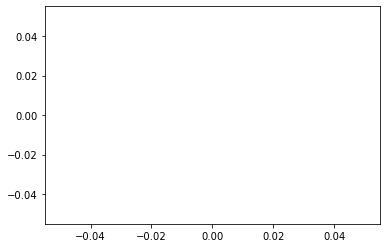

In [423]:
# Separate bridge and non bridge data
bridge_presence=buffer_clip_slope2.loc[buffer_clip_slope2.bridge ==1] 
bridge_presence.slope.plot()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

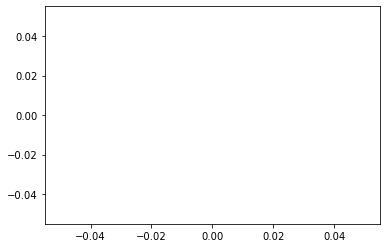

In [424]:
bridge_presence['slope']=0
bridge_presence.slope.plot()

In [425]:
bridge_absence=buffer_clip_slope2.loc[buffer_clip_slope2.bridge==0] 
bridge_absence.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,bridge,geometry,slope,index_right
0,28545390.0,0,"LINESTRING (763877.021 2127514.042, 763931.538...",0.515248,104
1,28545390.0,0,"LINESTRING (764085.238 2127586.495, 764132.324...",1.276236,104
2,97891369.0,0,"LINESTRING (762031.601 2125507.959, 762033.639...",0.030681,111
3,97891369.0,0,"LINESTRING (762031.601 2125507.959, 762047.210...",0.138515,111
4,97891369.0,0,"LINESTRING (761952.908 2125547.920, 762018.180...",0.442223,111


In [426]:
# now join again
buffer_clip_slope3=pd.concat([bridge_presence,bridge_absence])
# put the cap for the slope as maximum 25%
buffer_clip_slope3=buffer_clip_slope3[buffer_clip_slope3['slope']<25]
buffer_clip_slope3.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,bridge,geometry,slope,index_right
0,28545390.0,0,"LINESTRING (763877.021 2127514.042, 763931.538...",0.515248,104
1,28545390.0,0,"LINESTRING (764085.238 2127586.495, 764132.324...",1.276236,104
2,97891369.0,0,"LINESTRING (762031.601 2125507.959, 762033.639...",0.030681,111
3,97891369.0,0,"LINESTRING (762031.601 2125507.959, 762047.210...",0.138515,111
4,97891369.0,0,"LINESTRING (761952.908 2125547.920, 762018.180...",0.442223,111


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

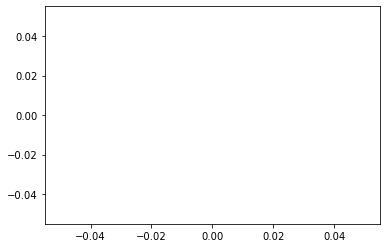

In [427]:
check=buffer_clip_slope3[buffer_clip_slope3['bridge']== 1]
check.slope.plot()

In [428]:
# Now calculate the mean slope for each count location
output_slope=buffer_clip_slope3.groupby(by=['osm_id_sensor'])['slope'].mean().reset_index()
output_slope.columns=['osm_id','slope']
output_slope.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,slope
0,28545390.0,0.895742
1,97891369.0,0.611908
2,170833583.0,2.482502
3,178552402.0,2.322977
4,223881858.0,1.498295


# Import Weather Daily level data from weather underground website Using python coding

1. https://www.shanelynn.ie/analysis-of-weather-data-using-pandas-python-and-seaborn/
2. https://bojanstavrikj.github.io/content/page1/wunderground_scraper

In [429]:
#!pip install beautifulsoup4
#!pip install -U selenium
#!pip install webdriver-manager
#!pip install chromedriver 
#!pip3 install webdrivermanager


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [430]:
from bs4 import BeautifulSoup as BS #conda install -c anaconda beautifulsoup4 
from selenium import webdriver
from functools import reduce
import pandas as pd
import time

In [431]:
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from webdriver_manager.chrome import ChromeDriverManager
from os import system as System
from webdriver_manager.utils import ChromeType
#from selenium.webdriver.common.desired_capabilities import DesiredCapabilities

In [432]:
    def render_page(url):
        options = Options()
        options.add_argument("user-data-dir=C:\\Users\\mxm5116\\Desktop\\Profile 1")
        driver = webdriver.Chrome(executable_path=r'C:/Program Files/Google/Chrome/Application/chromedriver_win32/chromedriver.exe', chrome_options=options)
        driver.get(url)
        time.sleep(3)
        r = driver.page_source
        driver.quit()
        return r  

In [433]:
# driver =webdriver.Chrome(r'C:\Users\mxm5116\Downloads\chromedriver_win32\chromedriver.exe')
# driver = webdriver.Firefox(executable_path=r'C:\Users\mxm5116\Downloads\geckodriver-v0.29.0-win64\geckodriver.exe')
#chrome_options = Options()
# chrome_options.add_argument('--headless')
#chrome_options.add_argument('--no-sandbox')
# chrome_options.add_argument('--disable-dev-shm-usage')
#driver = webdriver.Chrome(chrome_options=chrome_options, executable_path=r'C:\Users\mxm5116\Downloads\chromedriver_win32\chromedriver.exe')

#driver.get(r'https://www.google.com')
#time.sleep(5)
#r = driver.page_source
#print(r)

In [434]:
#def render_page(url):
#        chrome_options = Options()
#        chrome_options.add_argument('--headless')
#        chrome_options.add_argument('--no-sandbox')
#        chrome_options.add_argument('--disable-dev-shm-usage')
#        driver = webdriver.Chrome("executable_path=r"C:/Users/mxm5116/Downloads/chromedriver_win32/chromedriver.exe")
#        driver.get(url)
#        time.sleep(3)
#        r = driver.page_source
#        driver.quit()
#       return r

In [435]:
  def scraper(page, dates):
        output = pd.DataFrame()

        for d in dates:

            url = str(str(page) + str(d))
            print(url)

            r = render_page(url)
            print(r)
            soup = BS(r, "html.parser")
            container = soup.find('lib-city-history-observation')
            check = container.find('tbody')

            data = []

            for c in check.find_all('tr', class_='ng-star-inserted'):
                for i in c.find_all('td', class_='ng-star-inserted'):
                    trial = i.text
                    trial = trial.strip('  ')
                    data.append(trial)

            if round(len(data) / 17 - 1) == 31:
                Temperature = pd.DataFrame([data[32:128][x:x + 3] for x in range(0, len(data[32:128]), 3)][1:],
                                           columns=['Temp_max', 'Temp_avg', 'Temp_min'])
                Dew_Point = pd.DataFrame([data[128:224][x:x + 3] for x in range(0, len(data[128:224]), 3)][1:],
                                         columns=['Dew_max', 'Dew_avg', 'Dew_min'])
                Humidity = pd.DataFrame([data[224:320][x:x + 3] for x in range(0, len(data[224:320]), 3)][1:],
                                        columns=['Hum_max', 'Hum_avg', 'Hum_min'])
                Wind = pd.DataFrame([data[320:416][x:x + 3] for x in range(0, len(data[320:416]), 3)][1:],
                                    columns=['Wind_max', 'Wind_avg', 'Wind_min'])
                Pressure = pd.DataFrame([data[416:512][x:x + 3] for x in range(0, len(data[416:512]), 3)][1:],
                                        columns=['Pres_max', 'Pres_avg', 'Pres_min'])
                Date = pd.DataFrame(data[:32][1:], columns=data[:1])
                Precipitation = pd.DataFrame(data[512:][1:], columns=['Precipitation'])
                print(str(str(d) + ' finished!'))
            elif round(len(data) / 17 - 1) == 28:
                Temperature = pd.DataFrame([data[29:116][x:x + 3] for x in range(0, len(data[29:116]), 3)][1:],
                                           columns=['Temp_max', 'Temp_avg', 'Temp_min'])
                Dew_Point = pd.DataFrame([data[116:203][x:x + 3] for x in range(0, len(data[116:203]), 3)][1:],
                                         columns=['Dew_max', 'Dew_avg', 'Dew_min'])
                Humidity = pd.DataFrame([data[203:290][x:x + 3] for x in range(0, len(data[203:290]), 3)][1:],
                                        columns=['Hum_max', 'Hum_avg', 'Hum_min'])
                Wind = pd.DataFrame([data[290:377][x:x + 3] for x in range(0, len(data[290:377]), 3)][1:],
                                    columns=['Wind_max', 'Wind_avg', 'Wind_min'])
                Pressure = pd.DataFrame([data[377:464][x:x + 3] for x in range(0, len(data[377:463]), 3)][1:],
                                        columns=['Pres_max', 'Pres_avg', 'Pres_min'])
                Date = pd.DataFrame(data[:29][1:], columns=data[:1])
                Precipitation = pd.DataFrame(data[464:][1:], columns=['Precipitation'])
                print(str(str(d) + ' finished!'))
            elif round(len(data) / 17 - 1) == 29:
                Temperature = pd.DataFrame([data[30:120][x:x + 3] for x in range(0, len(data[30:120]), 3)][1:],
                                           columns=['Temp_max', 'Temp_avg', 'Temp_min'])
                Dew_Point = pd.DataFrame([data[120:210][x:x + 3] for x in range(0, len(data[120:210]), 3)][1:],
                                         columns=['Dew_max', 'Dew_avg', 'Dew_min'])
                Humidity = pd.DataFrame([data[210:300][x:x + 3] for x in range(0, len(data[210:300]), 3)][1:],
                                        columns=['Hum_max', 'Hum_avg', 'Hum_min'])
                Wind = pd.DataFrame([data[300:390][x:x + 3] for x in range(0, len(data[300:390]), 3)][1:],
                                    columns=['Wind_max', 'Wind_avg', 'Wind_min'])
                Pressure = pd.DataFrame([data[390:480][x:x + 3] for x in range(0, len(data[390:480]), 3)][1:],
                                        columns=['Pres_max', 'Pres_avg', 'Pres_min'])
                Date = pd.DataFrame(data[:30][1:], columns=data[:1])
                Precipitation = pd.DataFrame(data[480:][1:], columns=['Precipitation'])
                print(str(str(d) + ' finished!'))
            elif round(len(data) / 17 - 1) == 30:
                Temperature = pd.DataFrame([data[31:124][x:x + 3] for x in range(0, len(data[31:124]), 3)][1:],
                                           columns=['Temp_max', 'Temp_avg', 'Temp_min'])
                Dew_Point = pd.DataFrame([data[124:217][x:x + 3] for x in range(0, len(data[124:217]), 3)][1:],
                                         columns=['Dew_max', 'Dew_avg', 'Dew_min'])
                Humidity = pd.DataFrame([data[217:310][x:x + 3] for x in range(0, len(data[217:310]), 3)][1:],
                                        columns=['Hum_max', 'Hum_avg', 'Hum_min'])
                Wind = pd.DataFrame([data[310:403][x:x + 3] for x in range(0, len(data[310:403]), 3)][1:],
                                    columns=['Wind_max', 'Wind_avg', 'Wind_min'])
                Pressure = pd.DataFrame([data[403:496][x:x + 3] for x in range(0, len(data[403:496]), 3)][1:],
                                        columns=['Pres_max', 'Pres_avg', 'Pres_min'])
                Date = pd.DataFrame(data[:31][1:], columns=data[:1])
                Precipitation = pd.DataFrame(data[496:][1:], columns=['Precipitation'])
                print(str(str(d) + ' finished!'))
            else:
                print('Data not in normal length')

            dfs = [Date, Temperature, Dew_Point, Humidity, Wind, Pressure, Precipitation]

            df_final = reduce(lambda left, right: pd.merge(left, right, left_index=True, right_index=True), dfs)

            df_final['Date'] = str(d) + "-" + df_final.iloc[:, :1].astype(str)

            output = output.append(df_final)

        print('Scraper done!')

        output = output[['Temp_avg', 'Temp_min', 'Dew_max', 'Dew_avg', 'Dew_min', 'Hum_max',
                         'Hum_avg', 'Hum_min', 'Wind_max', 'Wind_avg', 'Wind_min', 'Pres_max',
                         'Pres_avg', 'Pres_min', 'Precipitation', 'Date']]

        return output


# Please input the date and page link to extract the data for your study area here

In [436]:
dates = ['2019-1','2019-2','2019-3','2019-4','2019-5','2019-6','2019-7','2019-8','2019-9','2019-10','2019-11','2019-12']
# insert the date you want to extract the data
page = 'https://www.wunderground.com/history/monthly/us/or/portland/KPDX/date/'
# insert your study location link here
#df_output = scraper(page,dates)

In [437]:
w19=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/dallas_weather.csv")
w19

,Temp_avg,Temp_min,Dew_max,Dew_avg,Dew_min,Hum_max,Hum_avg,Hum_min,Wind_max,Wind_avg,Wind_min,Pres_max,Pres_avg,Pres_min,Precipitation,Date
0,39.6,37,38,32.0,28,82,74.2,67,17,13.1,7,29.8,29.7,29.6,0.00,2019-1-1
1,35.2,33,36,31.9,27,97,88.2,72,16,9.4,6,29.8,29.7,29.6,0.02,2019-1-2
2,38.3,36,38,36.2,34,97,92.4,83,14,8.4,0,29.6,29.5,29.4,0.99,2019-1-3
3,44.6,38,37,34.3,30,93,70.8,33,14,8.6,0,29.5,29.5,29.4,0.48,2019-1-4
4,53.1,37,43,37.9,33,86,60.0,32,13,4.2,0,29.6,29.6,29.5,0.00,2019-1-5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,63.9,59,56,54.2,52,87,71.8,53,14,7.0,3,29.6,29.5,29.4,0.00,2019-12-27
361,63.1,56,63,59.5,51,94,88.1,78,22,9.5,0,29.4,29.2,29.1,0.01,2019-12-28
362,49.4,44,51,37.6,28,86,65.2,44,17,9.8,0,29.5,29.4,29.2,0.86,2019-12-29
363,45.5,36,28,25.4,21,70,47.1,29,15,8.5,0,29.7,29.6,29.5,0.01,2019-12-30


In [438]:
output_weather=w19.loc[:, ['Temp_avg', 'Hum_avg','Precipitation']]
output_weather

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Temp_avg,Hum_avg,Precipitation
0,39.6,74.2,0.00
1,35.2,88.2,0.02
2,38.3,92.4,0.99
3,44.6,70.8,0.48
4,53.1,60.0,0.00
...,...,...,...
360,63.9,71.8,0.00
361,63.1,88.1,0.01
362,49.4,65.2,0.86
363,45.5,47.1,0.01


In [439]:
output_weather.dtypes

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Temp_avg         float64
Hum_avg          float64
Precipitation    float64
dtype: object

In [440]:
# Convert object to float
output_weather2=output_weather.astype(str).astype(float)

In [441]:
output_weather2.isnull().values.any()

False

In [442]:
# Take the average for annual
output_weather3=output_weather2.mean()
output_weather3

Temp_avg         67.624384
Hum_avg          62.316438
Precipitation     0.106521
dtype: float64

# Aggregate all output together in a dataframe

In [443]:
from functools import reduce
import pandas as pd
# compile the list of dataframes you want to merge
df_all = [emerging_data,output_bikecom,output_lane,output_intersection_density1a,output_commercial,commercial_distance1,commercialcc_distance1,output_industrial,industrial_distance1,industrialcc_distance1, output_residential,residential_distance1,residentialcc_distance1, output_retail,retail_distance1,retailcc_distance1,output_grass,grass_distance1,grasscc_distance1,output_park,Park_distance1,parkcc_distance1,output_water,water_distance1,watercc_distance1,output_forest,forest_distance1,forestcc_distance1,CBD_distance1,output_bparking,output_bstop,output_school,output_school_distance,output_college,output_college_distance,output_university,output_university_distance,output_intersection_density1,output_primary,output_secondary,output_tertiary,output_residential,output_path,output_cycleway,output_footway,output_bikeway_all_lane,output_bikeway_all_track, pt_road_type2,output_bikeway_all_lane_binary,output_bikeway_all_track_binary,output_meanspeed,output_pointspeed,output_bridge,output_point_bridge,output_pct_race1,output_pct_gender1,output_student,output_pct_edu1,output_median_age,output_income,output_hhdensity1,output_pdensity1,output_edensity1,output_job1,output_slope]

In [444]:
#Merge by ID
df_merged_eco_short = reduce(lambda  left,right: pd.merge(left,right,on=['osm_id'],
                                            how='left'), df_all)
df_merged_eco_short=df_merged_eco_short.drop_duplicates(subset=['site_id'],keep='first')

In [445]:
#dfs = [df1, df2, df3, df4, df5] 
#from functools import partial 
#outer_merge = partial(pd.merge, how='left') 
#reduce(outer_merge, df_all )

In [446]:
# Add weather data in this new data frame
df_merged_eco_short['Temp_avg'] = pd.Series(output_weather3.Temp_avg, index=df_merged_eco_short.index)
df_merged_eco_short['Hum_avg '] = pd.Series(output_weather3.Hum_avg , index=df_merged_eco_short.index)
df_merged_eco_short['Precipitation'] = pd.Series(output_weather3.Precipitation, index=df_merged_eco_short.index)
df_merged_eco_short.head()

,osm_id,site_id,sensor_type,AADBT,stv_adb,stv_c_adb,stl_raw,Total Commuter,Bike Commuter,Percentage of Bike Commuter,...,Median Age,Median_HH_income,HH_density,population_density,employment_density,Number of jobs,slope,Temp_avg,Hum_avg,Precipitation
0,496723098.0,P001DAL,permanent,11.805952,0.986301,0.013699,25.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.624384,62.316438,0.106521
1,356309596.0,P002DAL,permanent,17.944163,5.794521,1.273973,12.0,34.409753,0.000000,0.000000,...,59.906351,80001.000000,1751.368649,3754.204462,2196.443274,0.777186,4.674872,67.624384,62.316438,0.106521
2,493380742.0,P003DAL,permanent,63.346667,5.726027,1.383562,220.0,32.562872,0.093736,0.287861,...,27.087181,19901.150259,1447.948598,3291.173077,2027.632706,424.099520,2.412495,67.624384,62.316438,0.106521
3,461234382.0,P004DAL,permanent,43.761310,0.150685,0.000000,129.0,7.824497,0.000000,0.000000,...,11.860364,4294.914630,540.891219,2393.077314,747.582804,0.000000,0.712253,67.624384,62.316438,0.106521
4,472409339.0,P006DAL,permanent,26.274603,0.000000,0.000000,8.0,41.540610,0.000000,0.000000,...,49.475675,20506.873738,2144.404370,6761.444468,2866.847902,2.110347,2.123432,67.624384,62.316438,0.106521


In [447]:
# If you want to export the excel
pd.DataFrame.to_csv(df_merged_eco_short, 'Eco_short_2019_updated_Dallas_0.1_mile_network_buffer_data.csv', sep=',', na_rep='0', index=False)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Use Keplergl to produce dynamic Map for all variables

In [448]:
# Make dynamic visualization
#!pip install keplergl

In [449]:
ecoshort.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon,min_dist_to_CBD
0,P001DAL,AT&T Trail at Trinity Forest Trail,permanent,2019,Dallas,3.0,11.805952,0.986301,0.013699,25.0,...,496723098.0,2.0,POINT (767915.395 2116890.570),4010.859297,35171.758189,17504.499814,1,30.0,1416.286315,36782.751742
7,P002DAL,Coombs Creek Trail,permanent,2019,Dallas,3.0,17.944163,5.794521,1.273973,12.0,...,356309596.0,2.0,POINT (755293.139 2122779.663),2112.838300,12970.284590,16150.771328,2,30.0,966.507266,14815.512107
14,P003DAL,Cottonwood Creek Trail at Hamilton Park,permanent,2019,Dallas,3.0,63.346667,5.726027,1.383562,220.0,...,493380742.0,2.0,POINT (762316.218 2140195.028),1681.682738,6991.896593,25103.203284,1,30.0,1842.555130,52828.936547
21,P004DAL,Crawford Memorial Park Loop Trail,permanent,2019,Dallas,2.0,43.761310,0.150685,0.000000,129.0,...,461234382.0,2.0,POINT (771750.380 2117533.411),2926.101046,35625.793719,29384.589591,4,35.0,803.735072,45877.867288
28,P006DAL,Gateway Park Loop Trail,permanent,2019,Dallas,3.0,26.274603,0.000000,0.000000,8.0,...,472409339.0,2.0,POINT (768610.731 2122440.975),3209.924147,23656.239658,23751.485989,3,35.0,218.202498,30425.587446


In [450]:
ecoshort_selected=ecoshort.loc[:,["osm_id_sensor","geometry"]]
ecoshort_selected
print(ecoshort_selected.crs)

epsg:2845


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [451]:
# set the co-ordinate system first
ecoshort_selected1 = ecoshort_selected.set_crs("EPSG:2845")
# Let's take a copy of our layer
ecoshort_selected_3D = ecoshort_selected1.copy()

# Reproject the geometries by replacing the values with projected ones
ecoshort_selected_3D  = ecoshort_selected_3D .to_crs(epsg=4211) # Initially given
ecoshort_selected_3D.head()

,osm_id_sensor,geometry
0,496723098.0,POINT (-96.70881 32.70787)
7,356309596.0,POINT (-96.84244 32.76284)
14,493380742.0,POINT (-96.76442 32.91885)
21,461234382.0,POINT (-96.66779 32.71307)
28,472409339.0,POINT (-96.70038 32.75781)


In [452]:
ecoshort_selected_3D['Lon'] = ecoshort_selected_3D.geometry.x
ecoshort_selected_3D['Lat'] = ecoshort_selected_3D.geometry.y
ecoshort_selected_3D=ecoshort_selected_3D.drop(['geometry'],axis=1)
ecoshort_selected_3D.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,Lon,Lat
0,496723098.0,-96.70881,32.70787
7,356309596.0,-96.84244,32.76284
14,493380742.0,-96.76442,32.91885
21,461234382.0,-96.66779,32.71307
28,472409339.0,-96.70038,32.75781


In [453]:
ecoshort_selected_3D.dtypes

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osm_id_sensor    float64
Lon              float64
Lat              float64
dtype: object

In [454]:
print(gdf1.crs)
# set the co-ordinate system first
gdf_selected1 = gdf1.set_crs("EPSG:2845")

# Reproject the geometries by replacing the values with projected ones
gdf_selected_3D  = gdf_selected1.to_crs(epsg=4211) # Initially given
gdf_selected_3D=gdf_selected_3D.loc[:,["osm_id_sensor","geometry"]]
gdf_selected_3D['geometry'] = gdf_selected_3D['geometry'].apply(shapely.geometry.shape)
gdf_selected_3D
newdf=(pd.merge(ecoshort_selected_3D, gdf_selected_3D, left_on='osm_id_sensor', right_on='osm_id_sensor', how='inner'))
buffer_vis=newdf
buffer_vis.columns=['osm_id_sensor','Lon','Lat','geometry']
buffer_vis.head()

epsg:2845


,osm_id_sensor,Lon,Lat,geometry
0,356309596.0,-96.84244,32.76284,"POLYGON ((-96.84443 32.76195, -96.84444 32.761..."
1,493380742.0,-96.76442,32.91885,"POLYGON ((-96.76478 32.91849, -96.76477 32.918..."
2,461234382.0,-96.66779,32.71307,"POLYGON ((-96.66593 32.71272, -96.66611 32.712..."
3,472409339.0,-96.70038,32.75781,"POLYGON ((-96.70014 32.75730, -96.70013 32.757..."
4,469524545.0,-96.79426,32.68145,"POLYGON ((-96.79475 32.68543, -96.79472 32.685..."


In [455]:
# Make a copy of our data frame to visualize it
df_dynamic=df_merged_eco_short.copy()
#cols = df_dynamic.columns
#df_dynamic[cols[1:]] = df_dynamic[cols[1:]].astype(str).astype(float)
#df_dynamic
# Bring the buffer geometry
df_dynamic1=(pd.merge(df_dynamic, buffer_vis, left_on='osm_id', right_on='osm_id_sensor', how='inner'))
df_dynamic1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,site_id,sensor_type,AADBT,stv_adb,stv_c_adb,stl_raw,Total Commuter,Bike Commuter,Percentage of Bike Commuter,...,employment_density,Number of jobs,slope,Temp_avg,Hum_avg,Precipitation,osm_id_sensor,Lon,Lat,geometry
0,356309596.0,P002DAL,permanent,17.944163,5.794521,1.273973,12.0,34.409753,0.000000,0.000000,...,2196.443274,0.777186,4.674872,67.624384,62.316438,0.106521,356309596.0,-96.84244,32.76284,"POLYGON ((-96.84443 32.76195, -96.84444 32.761..."
1,493380742.0,P003DAL,permanent,63.346667,5.726027,1.383562,220.0,32.562872,0.093736,0.287861,...,2027.632706,424.099520,2.412495,67.624384,62.316438,0.106521,493380742.0,-96.76442,32.91885,"POLYGON ((-96.76478 32.91849, -96.76477 32.918..."
2,461234382.0,P004DAL,permanent,43.761310,0.150685,0.000000,129.0,7.824497,0.000000,0.000000,...,747.582804,0.000000,0.712253,67.624384,62.316438,0.106521,461234382.0,-96.66779,32.71307,"POLYGON ((-96.66593 32.71272, -96.66611 32.712..."
3,472409339.0,P006DAL,permanent,26.274603,0.000000,0.000000,8.0,41.540610,0.000000,0.000000,...,2866.847902,2.110347,2.123432,67.624384,62.316438,0.106521,472409339.0,-96.70038,32.75781,"POLYGON ((-96.70014 32.75730, -96.70013 32.757..."
4,469524545.0,P007DAL,permanent,15.088095,0.000000,0.000000,8.0,29.617242,0.000000,0.000000,...,641.629395,0.000000,1.775533,67.624384,62.316438,0.106521,469524545.0,-96.79426,32.68145,"POLYGON ((-96.79475 32.68543, -96.79472 32.685..."


In [456]:
#buffer_vis=gdf1.loc[:,['osm_id_sensor','geometry']]
#buffer_vis.columns=['osm_id','geometry']
#buffer_vis

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [457]:
pd.DataFrame.to_csv(df_dynamic1, 'keplergl_eco_short_2019_Dallas_network_0.1_mile_buffer.csv', sep=',', na_rep='0', index=False)


In [458]:
# We do not have any null point. lets plot the map
# Load an empty map
from keplergl import KeplerGl
map_1 = KeplerGl()
map_1

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl()

In [459]:
#cols = df_dynamic1.columns
#df_dynamic1[cols[1:]] = df_dynamic1[cols[1:]].astype(str).astype(float)
#df_dynamic1

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [460]:
#from shapely import wkt
#df_dynamic1['str_geom'] = df_dynamic1.geometry.apply(lambda x: wkt.dumps(x))
#df_dynamic1=df_dynamic1.drop(['geometry'],axis=1)
#df_dynamic1
#df_dynamic1.rename(columns={'str_geom':'geometry'}, inplace=True)
#df_dynamic1

In [461]:
#df_dynamic1.dtypes

In [462]:
#df_dynamic2=df_dynamic1.drop(["geometry"],axis=1)
#df_dynamic3=df_dynamic1.copy()
#df_dynamic3['geometry'] = df_dynamic3['geometry'].apply(shapely.geometry.shape)
#df_dynamic3

In [463]:
# Load a map with data and config and height
from keplergl import KeplerGl
data=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Dallas/Dallas, TX/keplergl_eco_short_2019_Dallas_network_0.1_mile_buffer.csv")
data=data.fillna(0)
map_2 = KeplerGl(height=500, data={"data_1":data})
map_2

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'data_1':          osm_id  site_id sensor_type        AADBT     stv_adb  stv_c_adb  \
0   35630…

In [464]:
data.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,site_id,sensor_type,AADBT,stv_adb,stv_c_adb,stl_raw,Total Commuter,Bike Commuter,Percentage of Bike Commuter,...,employment_density,Number of jobs,slope,Temp_avg,Hum_avg,Precipitation,osm_id_sensor,Lon,Lat,geometry
0,356309596.0,P002DAL,permanent,17.944163,5.794521,1.273973,12.0,34.409753,0.000000,0.000000,...,2196.443274,0.777186,4.674872,67.624384,62.316438,0.106521,356309596.0,-96.84244,32.76284,POLYGON ((-96.84442839247693 32.76195412600755...
1,493380742.0,P003DAL,permanent,63.346667,5.726027,1.383562,220.0,32.562872,0.093736,0.287861,...,2027.632706,424.099520,2.412495,67.624384,62.316438,0.106521,493380742.0,-96.76442,32.91885,POLYGON ((-96.76477550654808 32.91848628414401...
2,461234382.0,P004DAL,permanent,43.761310,0.150685,0.000000,129.0,7.824497,0.000000,0.000000,...,747.582804,0.000000,0.712253,67.624384,62.316438,0.106521,461234382.0,-96.66779,32.71307,POLYGON ((-96.66593465006036 32.71271727454961...
3,472409339.0,P006DAL,permanent,26.274603,0.000000,0.000000,8.0,41.540610,0.000000,0.000000,...,2866.847902,2.110347,2.123432,67.624384,62.316438,0.106521,472409339.0,-96.70038,32.75781,POLYGON ((-96.70013887288266 32.75730329058548...
4,469524545.0,P007DAL,permanent,15.088095,0.000000,0.000000,8.0,29.617242,0.000000,0.000000,...,641.629395,0.000000,1.775533,67.624384,62.316438,0.106521,469524545.0,-96.79426,32.68145,POLYGON ((-96.79474572903742 32.68542547434616...


In [465]:
# save as htm file
map_2.save_to_html(file_name="Eco_short_2019_Dallas_0.1_mile_network_buffer.html")

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Map saved to Eco_short_2019_Dallas_0.1_mile_network_buffer.html!


In [466]:
#conda list ipython

In [467]:
end = time.time()
print("Tune Fit Time:", end - start)

Tune Fit Time: 2364.795143842697


# Keplergl Dynamic map is done----END

# Run Random Forest to filter the variables

# Run Negative Binomial Model to predict the AADBT